You work for a large corporation that owns a collection of restaurants of different types. Currently it is evaluating the location, type, and characteristics (cuisine, price point, design, marketing strategy) and positioning of a new restaurant in PICK YOUR CITY (if you know the local habits, you can give better insight). 

Your task is to analyse the dataset and give recommendations on strategy, based on the reviews, location (either neighbourhood or zipcode level) and competition. Also estimates on volumes and revenues of the potential undertaking. You may have to check out what the Price-Range attributes signify by visiting the Yelp website. 

Submit a report with an Exec Summary, Details of your analysis and reasoning and recommendation. Submit your code alongside. 
You are free to use any language, scripts, code or software on the web but the analysis and report has to be yours.


In [1]:
import re,json,ftfy,nltk,pycountry,random,seaborn
import numpy as np
import pandas as pd
import collections as cllt
import sklearn as sk
import matplotlib.pyplot as plt

from nltk import word_tokenize
from os import path
from glob import glob
from scipy.misc import imread
from textblob import TextBlob
from wordcloud import WordCloud
from IPython.display import display, HTML
from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
%matplotlib inline

/Users/siangyanglau/anaconda/lib/python2.7/site-packages/pandas/computation/__init__.py:19: UserWarning: The installed version of numexpr 2.4.4 is not supported in pandas and will be not be used

  UserWarning)


### 1.0 Data Cleansing

In [2]:
business = pd.read_csv("edinburgh.csv",header=0)
checkin = pd.read_csv("edinCheckin.csv",header=0)
review = pd.read_csv("edinReview.csv",header=0)
tip = pd.read_csv("edinTip.csv",header=0)
user = pd.read_csv("edinUser.csv",header=0,usecols=range(0,23))

In [3]:
checkin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1215 entries, 0 to 1214
Columns: 171 entries, Unnamed: 0 to type
dtypes: float64(168), int64(1), object(2)
memory usage: 1.6+ MB


In [4]:
user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3386 entries, 0 to 3385
Data columns (total 23 columns):
Unnamed: 0             3386 non-null int64
user_id                3385 non-null object
average_stars          3385 non-null float64
compliments_cool       1638 non-null float64
compliments_cute       399 non-null float64
compliments_funny      1072 non-null float64
compliments_hot        1242 non-null float64
compliments_list       281 non-null float64
compliments_more       898 non-null float64
compliments_note       1315 non-null float64
compliments_photos     740 non-null float64
compliments_plain      1451 non-null float64
compliments_profile    557 non-null float64
compliments_writer     1475 non-null float64
elite                  3385 non-null object
fans                   3385 non-null float64
friends                3385 non-null object
name                   3385 non-null object
review_count           3385 non-null float64
type                   3385 non-null object
votes

In [5]:
tip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2859 entries, 0 to 2858
Data columns (total 7 columns):
Unnamed: 0     2859 non-null int64
business_id    2859 non-null object
date           2328 non-null object
likes          2328 non-null float64
text           2328 non-null object
type           2328 non-null object
user_id        2328 non-null object
dtypes: float64(1), int64(1), object(5)
memory usage: 156.4+ KB


In [6]:
business.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1215 entries, 0 to 1214
Data columns (total 59 columns):
Unnamed: 0                              1215 non-null int64
attributes_Accepts Credit Cards         986 non-null object
attributes_Accepts Insurance            0 non-null float64
attributes_Ages Allowed                 0 non-null float64
attributes_Alcohol                      837 non-null object
attributes_Ambience                     673 non-null object
attributes_Attire                       927 non-null object
attributes_BYOB                         0 non-null float64
attributes_BYOB/Corkage                 1 non-null object
attributes_By Appointment Only          3 non-null object
attributes_Caters                       372 non-null object
attributes_Coat Check                   135 non-null object
attributes_Corkage                      0 non-null float64
attributes_Delivery                     873 non-null object
attributes_Dietary Restrictions         51 non-null object
at

In [7]:
review.info()
# Replace nan with blank space
review=review.replace(np.nan,' ', regex=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14290 entries, 0 to 14289
Data columns (total 11 columns):
Unnamed: 0      14290 non-null int64
business_id     14290 non-null object
date            14256 non-null object
review_id       14256 non-null object
stars           14256 non-null float64
text            14256 non-null object
type            14256 non-null object
user_id         14256 non-null object
votes_cool      14256 non-null float64
votes_funny     14256 non-null float64
votes_useful    14256 non-null float64
dtypes: float64(4), int64(1), object(6)
memory usage: 1.2+ MB


Clean up raw text in review dataset

In [8]:
review.head(30)

,Unnamed: 0,business_id,date,review_id,stars,text,type,user_id,votes_cool,votes_funny,votes_useful
0,0,aFVO6hoFlOCN8pKsmJbWjw,2009-11-14,jnsG2mFZlgdU4tPXFOnsNA,4,I had a pretty good experience at the Doric. ...,review,o9t7nO4hUiP88FQ_WEvdOw,1,0,0
1,1,aFVO6hoFlOCN8pKsmJbWjw,2010-05-02,dj6XxV1N2AAbifYXhfkUtQ,2,Whenever the train I'm meant to be getting in ...,review,-ZOyUKJ8d30debwzj1FN7g,0,0,0
2,2,aFVO6hoFlOCN8pKsmJbWjw,2010-05-12,TzqdPoa7Y5Fek6MOMdaV2w,3,"The Doric is apparently ""Edinburgh's oldest ga...",review,pAZYqb6OuPjlHF7AeGy6uQ,0,0,0
3,3,aFVO6hoFlOCN8pKsmJbWjw,2010-05-14,hLitjpBEbYf7eOKCs33GGA,3,My dad is obsessed with his Good Food Guides a...,review,OTQ68fm6EtcPD2n0g6Y2mQ,0,0,0
4,4,aFVO6hoFlOCN8pKsmJbWjw,2012-04-02,AO-2QkLw9hxZ-O1YX25bSg,3,For the start of a friend's Stag Event in Edin...,review,YwwdbliJQkau_USNEHC3Mg,1,0,1
5,5,aFVO6hoFlOCN8pKsmJbWjw,2012-06-23,gHlPuGfQtaWWSuQcBLcsfw,3,The Doric markets itself as Edinburgh's oldest...,review,UaA5yKEoaA_hFMLGDhQ1wQ,1,0,1
6,6,aFVO6hoFlOCN8pKsmJbWjw,2013-05-28,SUBJg8DQQYMFxoKQUhHIEA,3,This is a good alternative to the fast food/sn...,review,B0h78A1dkJL9BtXulclAIA,1,0,2
7,7,aFVO6hoFlOCN8pKsmJbWjw,2014-04-16,ntwlcfOiuyRelK9Rz3Ovjw,5,Amazing Sunday Roast dinner!\n\nI saw The Dori...,review,MvStP5gVKXp6kPR2KZ3x1Q,0,0,1
8,8,aFVO6hoFlOCN8pKsmJbWjw,2014-07-24,g8sb2cVggrUWbgFXaHU2gQ,5,The original building was constructed in the 1...,review,w6IyjQw_UkElNu4J0qT3GQ,1,0,0
9,9,aFVO6hoFlOCN8pKsmJbWjw,2014-07-29,sEOelrlIrEfMlzs7_uI5nA,4,Great fish and chips and shepards pie. Nice d...,review,UtcS_paZuDZTByg72xCVqw,0,0,0


In [9]:
# Referenced Regular Expression for email cleanup idea: 
def cleanup(text):

    # Make text lower case
    for f in re.findall("([A-Z]+)", text):
        text = text.replace(f, f.lower())
    
    # remove escape symbols
    text = text.replace('\r', " ")
    text = text.replace('\n', " ")
    
    # remove all non-ascii characters in the string
    text=unicode(text, 'ascii', 'ignore')

    #Creata a list of reg tools
    cleanuptools = [
    #Dates
    r"(monday|tuesday|wednesday|thursday|friday|saturday|sunday)",
    # Removing months
    r"january|february|march|april|may|june|july|august|september|october|november|december",
    # Punctuation and numbers to be removed
    r'[-|.|?|!|,|"|:|;|()|0-9]',
    ]
    
    for tool in cleanuptools:
        text = re.sub(tool," ", text)
    return text

# Constructing a list for stopwords 
stopwords = []
# Add scikit-learn's CountVectorizer's stop list to the created list
stopwords = sk.feature_extraction.text.ENGLISH_STOP_WORDS

In [10]:
review.text=review.text.apply(cleanup)

In [11]:
review.text[28]

u"this is one of my favourite finds in the city   and what a find   hidden away in the depths of charlotte square  this place doesn't look like much  it's got such a lovely  authentic atmosphere though  really genuine and comforting   it's really traditional and a great place to come if you would like a relaxing  authentic atmosphere   yes it's a bit cave like  but it's an experience  when you go  which you will  you won't be disappointed  and you'll be back  alongside arnold "

### Inspection of review contents 

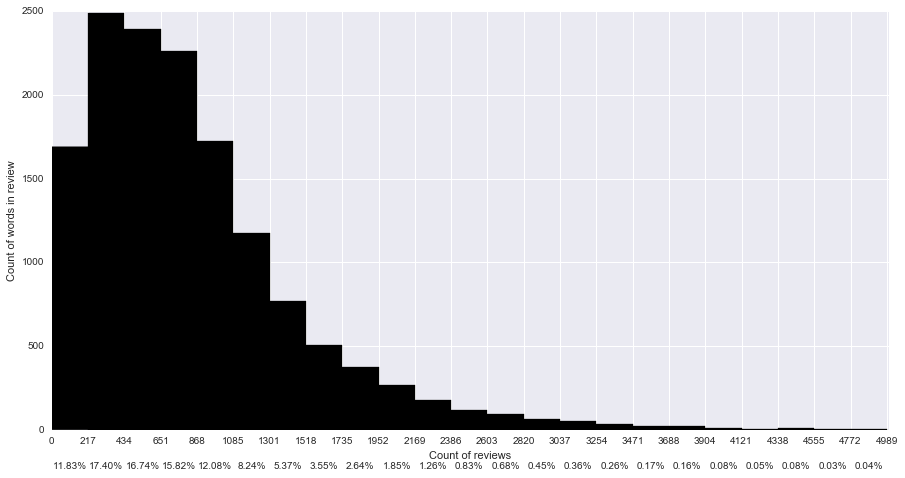

In [12]:
f, ax = plt.subplots(figsize=(15,7.5))
n, bins, patches = ax.hist(review.text.apply(len),facecolor='black',bins=23)
ax.set_xticks(bins)
bin_centers = 0.5 * np.diff(bins) + bins[:-1]
for count, x in zip(n, bin_centers):
    percent = '{:.2f}%'.format((float(count) / n.sum())*100)
    ax.annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
    xytext=(0, -32), textcoords='offset points', va='top', ha='center')
ax.set_xlabel('Count of reviews')
ax.set_ylabel('Count of words in review')

u"this is one of my favourite finds in the city   and what a find   hidden away in the depths of charlotte square  this place doesn't look like much  it's got such a lovely  authentic atmosphere though  really genuine and comforting   it's really traditional and a great place to come if you would like a relaxing  authentic atmosphere   yes it's a bit cave like  but it's an experience  when you go  which you will  you won't be disappointed  and you'll be back  alongside arnold "

### Topic Modelling

In [14]:
# Split the dataset into five categories: 1,2,3,4 and 5 stars

review_1_star = review[(review.stars == 1)]
review_2_star = review[(review.stars == 2)]
review_3_star = review[(review.stars == 3)]
review_4_star = review[(review.stars == 4)]
review_5_star = review[(review.stars == 5)]

review_5_star.head()

,Unnamed: 0,business_id,date,review_id,stars,text,type,user_id,votes_cool,votes_funny,votes_useful
7,7,aFVO6hoFlOCN8pKsmJbWjw,2014-04-16,ntwlcfOiuyRelK9Rz3Ovjw,5,amazing roast dinner i saw the doric liste...,review,MvStP5gVKXp6kPR2KZ3x1Q,0,0,1
8,8,aFVO6hoFlOCN8pKsmJbWjw,2014-07-24,g8sb2cVggrUWbgFXaHU2gQ,5,the original building was constructed in the ...,review,w6IyjQw_UkElNu4J0qT3GQ,1,0,0
14,14,aFVO6hoFlOCN8pKsmJbWjw,2015-06-22,KAkF7pDSmpjzwoUkWLM5XA,5,excellent shepherds pie the downstairs pub a...,review,-LUDwqL2O-r1D1d91G6RSw,0,0,1
15,15,aFVO6hoFlOCN8pKsmJbWjw,2015-06-28,fq17ZUSmmSWpcNtQTxw5_g,5,amazing atmosphere amazing food amazing live...,review,1z9VlIyHnGob-LGBiGhi9g,1,0,1
16,16,aFVO6hoFlOCN8pKsmJbWjw,2015-08-06,51kA5ZSyq9BAikP0-0BEyg,5,while traveling through edinburgh on our honey...,review,A7NogscbA9dxy7vUwFMiCQ,2,0,1



The raw data is a sequence of symbols that cannot be fed directly to the algorithms themselves as most of them expect numerical feature vectors with a fixed size rather than the raw text documents with variable length. Therefore, the python package scikit-learn was used to extract numerical features from text content, namely [1]-[4]:

* **tokenizing** strings and giving an integer id for each possible token, for instance by using white-spaces and punctuation as token separators.

* **counting** the occurrences of tokens in each document.

* **normalizing** and weighting with diminishing importance tokens that occur in the majority of samples / documents.

Vectorization is a process combining tokenization, counting and normalization, which turns a collection of text documents into numerical feature vectors.  

Also, in a large text corpus, some words will be very present (e.g. “the”, “a”, “is” in English) hence carrying very little meaningful information about the actual contents of the document. If we were to feed the direct count data directly to a classifier those very frequent terms would shadow the frequencies of rarer yet more interesting terms. In order to re-weight the count features into floating point values suitable for usage by a classifier I apply TF-IDF term re-weighting functions before applying NMF to reduce the influence of terms appearing frequently across the entire corpus. TfidfVectorizer function combines the functions of TF-IDF and vectorization allowing to build a document-term matrix A for the corpus of documents:

In [15]:
#Vectorization
tfidfvectorizer_1 = TfidfVectorizer(max_features=15000, ngram_range=(1, 2), stop_words = stopwords,
                                 strip_accents="unicode", use_idf=True, norm="l2", min_df = 5)
tfidfvectorizer_2 = TfidfVectorizer(max_features=15000, ngram_range=(1, 2), stop_words = stopwords,
                                 strip_accents="unicode", use_idf=True, norm="l2", min_df = 5)
tfidfvectorizer_3 = TfidfVectorizer(max_features=15000, ngram_range=(1, 2), stop_words = stopwords,
                                 strip_accents="unicode", use_idf=True, norm="l2", min_df = 5)
tfidfvectorizer_4 = TfidfVectorizer(max_features=15000, ngram_range=(1, 2), stop_words = stopwords,
                                 strip_accents="unicode", use_idf=True, norm="l2", min_df = 5)
tfidfvectorizer_5 = TfidfVectorizer(max_features=15000, ngram_range=(1, 2), stop_words = stopwords,
                                 strip_accents="unicode", use_idf=True, norm="l2", min_df = 5)


#Create term document matrix for separate datasets
term_document_matrix_1 = tfidfvectorizer_1.fit_transform(review_1_star.text)
term_document_matrix_2 = tfidfvectorizer_2.fit_transform(review_2_star.text)
term_document_matrix_3 = tfidfvectorizer_3.fit_transform(review_3_star.text)
term_document_matrix_4 = tfidfvectorizer_4.fit_transform(review_4_star.text)
term_document_matrix_5 = tfidfvectorizer_5.fit_transform(review_5_star.text)

NMF then takes the term document matrix as an input, and factorizes it into two smaller non-negative matrices W and H, each having k dimensions. When multiplied together, these factors approximate the original matrix A. The key user-specified parameter k controls the number of topics that will be produced. The rows of the matrix W provides weights for the input documents relative to the k topics – these values indicate the strength of association between documents and topics. The columns of the matrix W provide weights for the terms relative to the topics. By ordering the values in a given column and selecting the top-ranked terms, we can produce a description of the corresponding topic. It is important to remember that each document can be associated with multiple topics, which will often be the case in many document collections (e.g. a single news article might be related to both “technology” and “business” topics).

At this stage we apply the scikit-learn implementation of NMF with NNDSVD initialization. Nonnegative Double Singular Value Decomposition (NNDSVD) is typically used for overcoming sparseness of data [8]. Here I set the number of topics to be equal to 20 and run NMF for 200 iterations, and then get the factors W and H from the resulting model:

In [16]:
# 1-star review
nmfmodel_1 = sk.decomposition.NMF(init="nndsvd", n_components=20, max_iter=200).fit(term_document_matrix_1)
W_1 = nmfmodel_1.fit_transform(term_document_matrix_1);
H_1 = nmfmodel_1.components_
# W (number of emails,number of topics) and H (number of topics, number of features)
print "Generated factor W of size %s and factor H of size %s for 1-star dataset" % ( str(W_1.shape), str(H_1.shape) )

# 2-star review
nmfmodel_2 = sk.decomposition.NMF(init="nndsvd", n_components=20, max_iter=200).fit(term_document_matrix_2)
W_2 = nmfmodel_2.fit_transform(term_document_matrix_2);
H_2 = nmfmodel_2.components_
# W (number of emails,number of topics) and H (number of topics, number of features)
print "Generated factor W of size %s and factor H of size %s for 2-star dataset" % ( str(W_2.shape), str(H_2.shape) )

# 3-star review
nmfmodel_3 = sk.decomposition.NMF(init="nndsvd", n_components=20, max_iter=200).fit(term_document_matrix_3)
W_3 = nmfmodel_3.fit_transform(term_document_matrix_3);
H_3 = nmfmodel_3.components_
# W (number of emails,number of topics) and H (number of topics, number of features)
print "Generated factor W of size %s and factor H of size %s for 3-star dataset" % ( str(W_3.shape), str(H_3.shape) )

# 4-star review
nmfmodel_4 = sk.decomposition.NMF(init="nndsvd", n_components=20, max_iter=200).fit(term_document_matrix_4)
W_4 = nmfmodel_4.fit_transform(term_document_matrix_4);
H_4 = nmfmodel_4.components_
# W (number of emails,number of topics) and H (number of topics, number of features)
print "Generated factor W of size %s and factor H of size %s for 4-star dataset" % ( str(W_4.shape), str(H_4.shape) )

# 5-star review
nmfmodel_5 = sk.decomposition.NMF(init="nndsvd", n_components=20, max_iter=200).fit(term_document_matrix_5)
W_5 = nmfmodel_5.fit_transform(term_document_matrix_5);
H_5 = nmfmodel_5.components_
# W (number of emails,number of topics) and H (number of topics, number of features)
print "Generated factor W of size %s and factor H of size %s for 5-star dataset" % ( str(W_5.shape), str(H_5.shape) )


Generated factor W of size (501, 20) and factor H of size (20, 1306) for 1-star dataset
Generated factor W of size (991, 20) and factor H of size (20, 2696) for 2-star dataset
Generated factor W of size (2738, 20) and factor H of size (20, 7232) for 3-star dataset
Generated factor W of size (5818, 20) and factor H of size (20, 14114) for 4-star dataset
Generated factor W of size (4208, 20) and factor H of size (20, 9405) for 5-star dataset


In [17]:
# Create a colour series for graph plotting
def grey_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(60, 100)

# Writting functions to show top words in each topic
def TopTermsByTopic(nmfmodel, features, top):
    for index, topic in enumerate(nmfmodel.components_):
        print "\n Topic {}: \n".format(index+1)
        top_words = [features[i] for i in nmfmodel.components_[index].argsort()[::-1][:top]]
        topic_words = ' '.join(top_words)
        print topic_words

        #Prepare data for horizontal bar charts
        top15_index = nmfmodel.components_[index].argsort()[::-1][:15]
        top15_topic = sorted(topic[top15_index],reverse=False)

        #Prepare data for wordclouds
        wc = WordCloud(max_font_size=80,relative_scaling=.5,width=800,height=500).generate(topic_words)
       
        #Create a space for graphs
        fig, ax = plt.subplots(2,figsize=(12,10))
        rect1 = ax[0].barh(.5 + np.arange(15) + .5, top15_topic, color="black", align="center")
        rect2 = ax[1].imshow(wc.recolor(color_func=grey_color_func, random_state=3))
        
        #Subplot 1 - Horizontal Bar Chart
        ax[0].set_title("Top 15 Terms in Topic {}".format(index + 1))
        ax[0].set_xlabel("Weight")
        ax[0].set_yticks(.5 + np.arange(15)+ .5)
        ax[0].set_yticklabels([features[i] for i in topic.argsort()[::-1][:15]])
        ax[0].grid(True)
        
        #Subplot 2 - WordCloud
        ax[1].axis("off")
        ax[1].set_title("Wordcloud of Topic {}".format(index + 1))
        
        #Show the graphs
        plt.tight_layout()
        plt.show()
        

# Function to analyse percentage of topics in each email
def TopicDistribution(review, matrix_W, index):
    rawtext = review.text.ix[index]
    topics = matrix_W[index,:]
    row_sum = np.sum(topics, axis=0)
    percentage = []
    for topic in topics:
        percentage.append(topic / float(row_sum))
    print rawtext
    plt.bar(range(len(percentage)), percentage, color='black')
    plt.xlabel('Topic Number')
    plt.xticks(range(1,len(percentage)))
    plt.ylabel('Percentage')
    plt.show()

In [18]:
#Extracting the feature names
features_1= tfidfvectorizer_1.get_feature_names()
features_2= tfidfvectorizer_2.get_feature_names()
features_3= tfidfvectorizer_3.get_feature_names()
features_4= tfidfvectorizer_4.get_feature_names()
features_5= tfidfvectorizer_5.get_feature_names()


 Topic 1: 

bad ok day sat pm ridiculous just like giving bad service explanation awful food bad early bad day sort feel thing outside drinking food noodles bad food horrible cocktails gave dip won good thing attention good bad experience luckily added used night taste toilet girl staff did soggy late ordered sunny course don eat worst closed service bad inside frozen place quid literally rubbery totally hope really bad sad worse money bottle wine sure offer inedible card chef eyes meat charged expectations mouth bites spicy fresh recently remove missing old horribly good food just bad experience hardly sadly honest lunch avoid canned level change quick quality food par waitress person hard near service


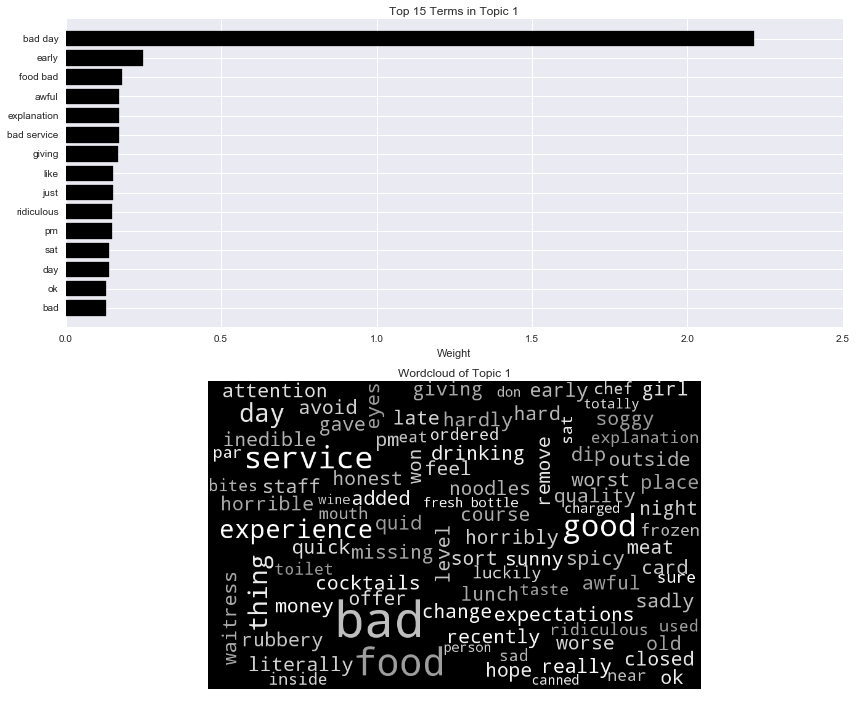


 Topic 2: 

chicken ordered curry sauce salad ordered chicken rice got wasn good meat dish like tasted lettuce ve cooked flavour taste just meal away spicy weird onion quick bit worst tasted like half overall lunch odd watery lamb tasteless enjoyed tiny crispy hot soggy threw stuff main dishes half way experience didn deep came deep fried start dry pleasant wasnt partner consisted garlic didn taste tried boiled complain burrito tonight texture wrong reviews mexican eating literally completely nice veg disappointing pork salt sweet green shrimp thai spice boyfriend filled hard wings toppings chilli spring mexican food meals fried aways lot ate love contained prawns looked way say


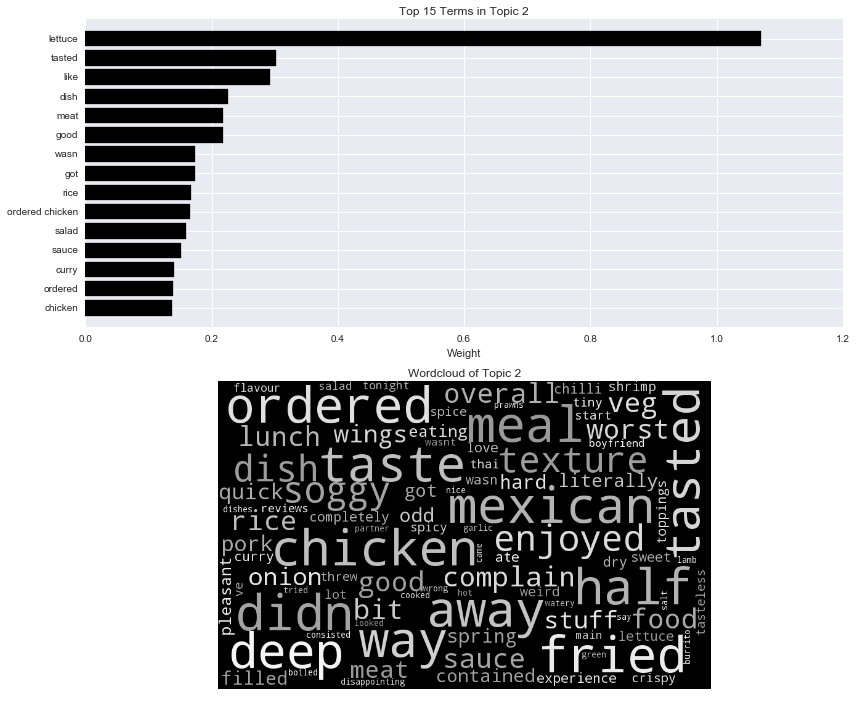


 Topic 3: 

chips fish fish chips worst cooked meal batter ago time tasteless grease just frozen hours obviously tastes like like cheese chippy inside little definitely good rubbish came totally waste money ages tastes ve smoked complete salmon quite years child best sitting chef waste changed scallops tasted bag terrible barely salted skin overly think staff bought twice order piece actually chewy massive restaurant definitely feeling surely taste pretty bones shop money evening worse right faces previously difficult steak used girls town fresh fat matter horrible does head oil fried young happy rubbery eaten disgusting hair vegetable rice credit trying burrito doubt coming oh word hate


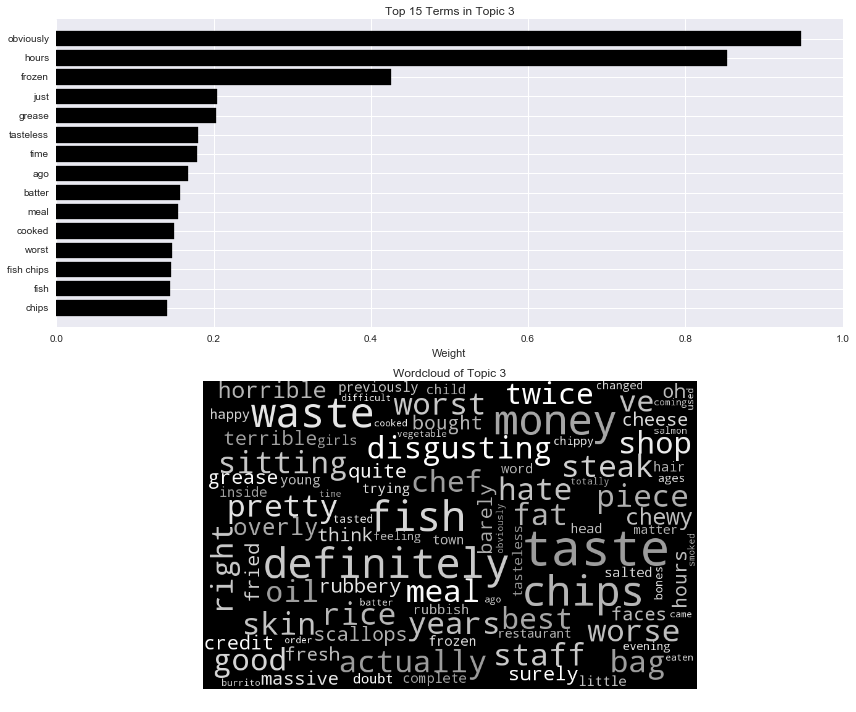


 Topic 4: 

food staff quality italian restaurant poor quality food overpriced edinburgh place service avoid terrible rude italian food left high horrible better worst terrible food honestly hungry food just does royal prices portions cold royal mile awful food horrible clearly level attentive worse thought mistake mile food service care ok bland cheap disappointing alcohol establishment grumpy home extremely expensive great food italy mexican think wait staff rude staff serve okay presented expect eaten poor service money menu experience dirty stale stars costs kitchen poorly want waited just poor quality served serving expectations priced cheaper dull honest past delivered mussels hardly cooking ve eaten uninspired based completely open frozen suppose blue ve standards best pre


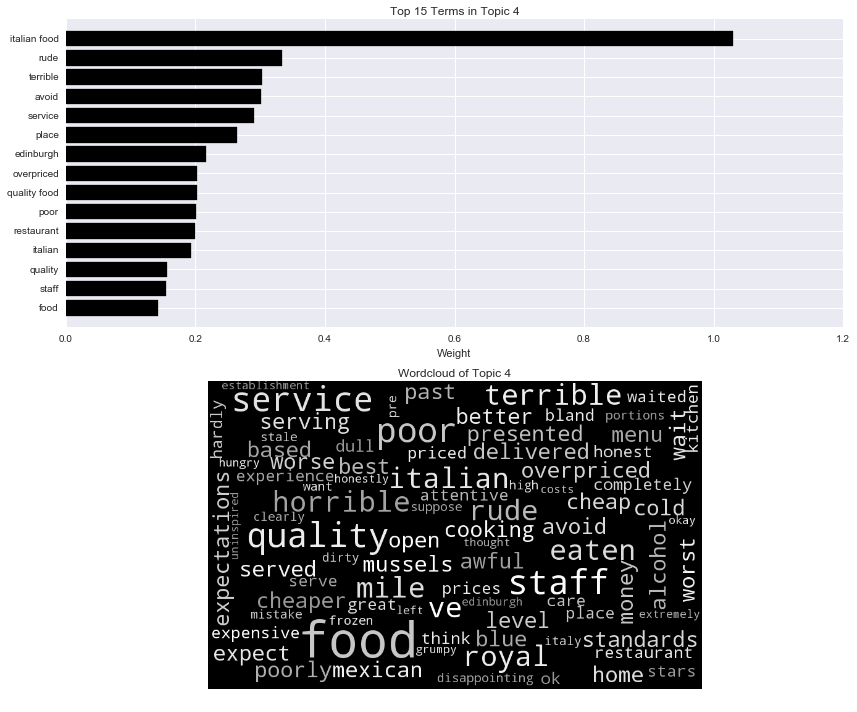


 Topic 5: 

wine waiter asked water served said dishes cheese restaurant glass hot menu red did came indian wanted manager went brought friend room price hot water check ordered glass wine say cocktail arrived dry told bottle voucher like instead tapas sauce just way offer ice courses small looked course cream vegetables sure little chutney cooked review waitress nice dessert pay right half diners white different tomato steak rice bit waiter said person lamb took life ended sat saw day tasty pounds spices wife naan oh want temperature cheeses mins decided pointed ok chef plastic glasses old starter didn reasonable glass water main course second main coming


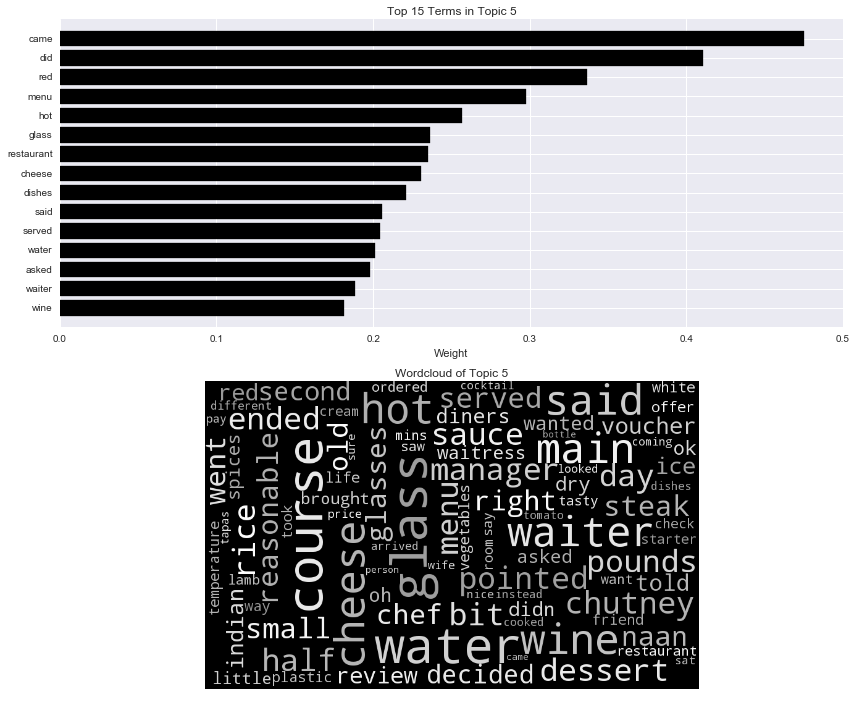


 Topic 6: 

don know ve don know sushi price edinburgh going think doesn like make chewy great cool paid lunch don think probably ll tasted venue tourist trap fresh trap hard review people week look having just don dreadful let know money tourist tough staff drink dried say buffet things naan lot pounds way horrible kitchen oh ago year years menu glass eggs decent outrageous old think ve good things just let uncomfortable don expect balls point wrong bowl fine hope customer bother felt like desperate new need ones surprised little straight read isn don bother worst right dinner relatively waste eating ve got seen japanese better huge times mother american tasted like sense


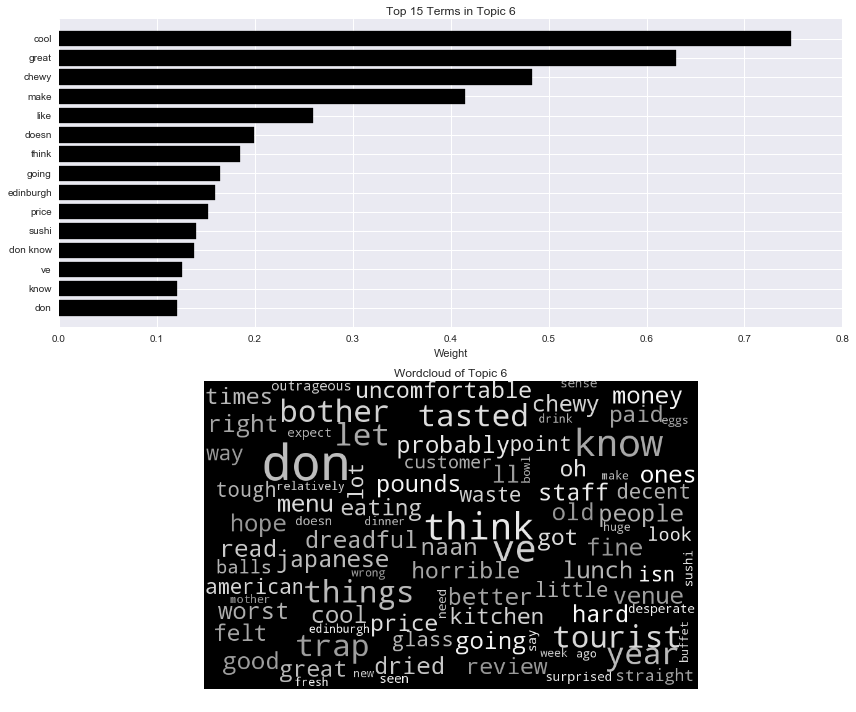


 Topic 7: 

pizza italian oven pizzas la cheese topping good aren cooked night plus minutes just late fair pasta sure ve want grilled did away ready garlic thought placing say base decided uk short rushed restaurant pieces cut cook ordered traditional cold great simple microwave sides lack wrong got time shouldn considering hand points moved deliver sauce order probably tesco taken entirely odd barely live toppings using comment better style hours house spice properly mean scotland managed standard server takeaway pm nearby pretty delivered portion disappointed offerings bread eats thank hungry delivery guess far pubs cheap check god fresh couple day work


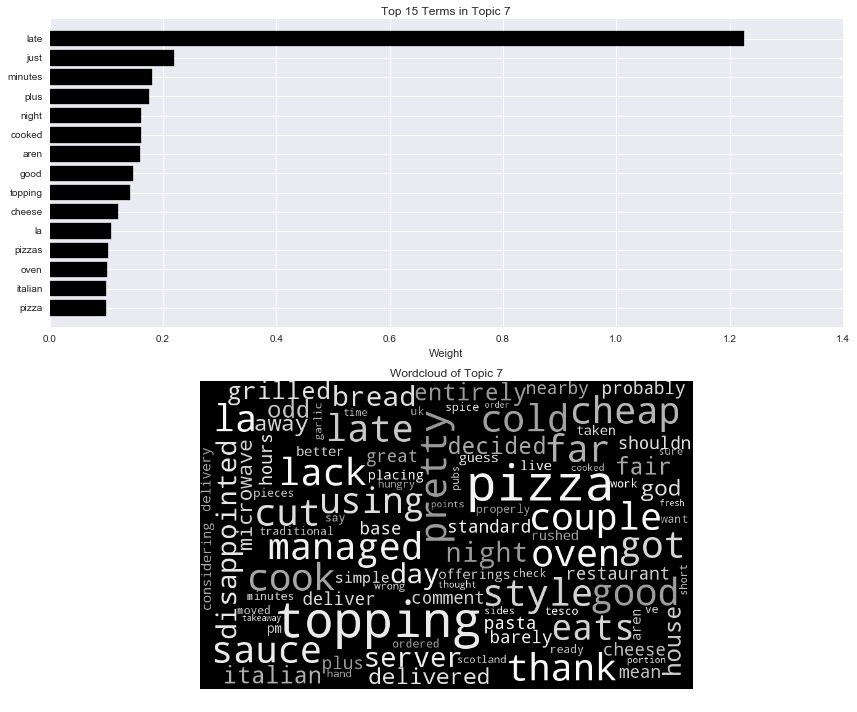


 Topic 8: 

burger burgers man onion rings drinks bun fries won chips try potato bar visit thanks new frozen reviews tasteless cheese toppings cheap sides salsa apology wait sauces dry read house read reviews disappointed cocktails incompetent dressing apart terrible tasty inside going sat cost partner greasy chain makes special dip thought waste time today passed quickly unpleasant sorry good disappointment tastes like small plus big stale received instead location chocolate cold long wait sweet wrong minutes waitress eventually beers massive pay turned disappointing late luckily crap bit presented plain things chance quality dog look order quite rush walking afternoon decent standards bad service ll price tastes


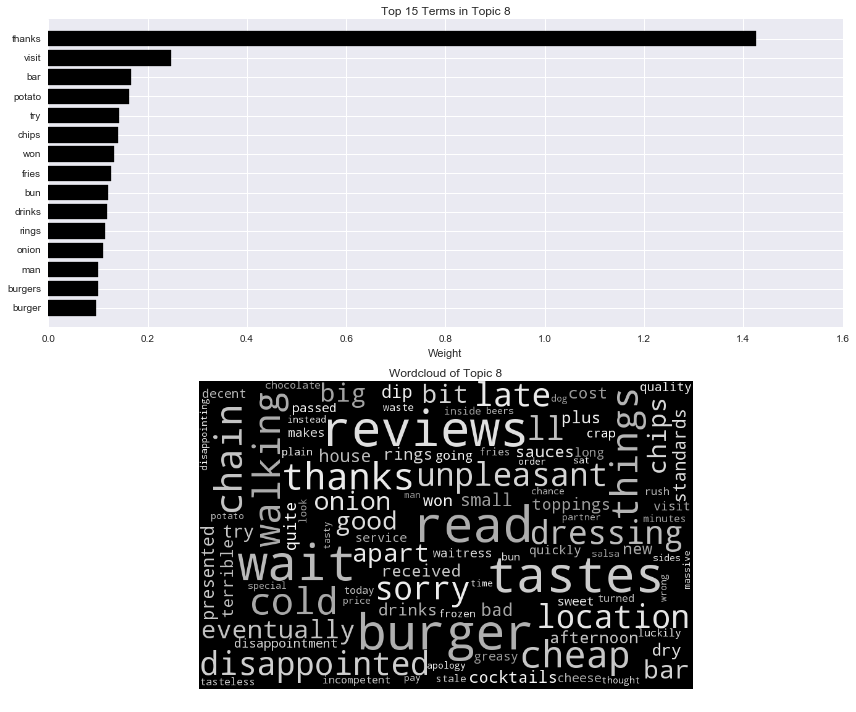


 Topic 9: 

breakfast gluten eggs toast gluten free bacon menu free sausage scrambled options salmon waitress poor time extra french items best need kitchen plate great short busy decided management given ordered plenty egg ask meal overcooked oily haggis turned roll place black pudding pudding bread new slices expect available black expensive generally soft table salad tea slightly piece wouldn sort disappointing traditional yelp discount places restaurant came buy bit treat hope potato good experience beans deal soggy potatoes butter restaurant food weak morning recently having know decent offered husband truly mediocre best walk recommend loved poor quality wouldn recommend took minutes make buffet away added small eat let fail


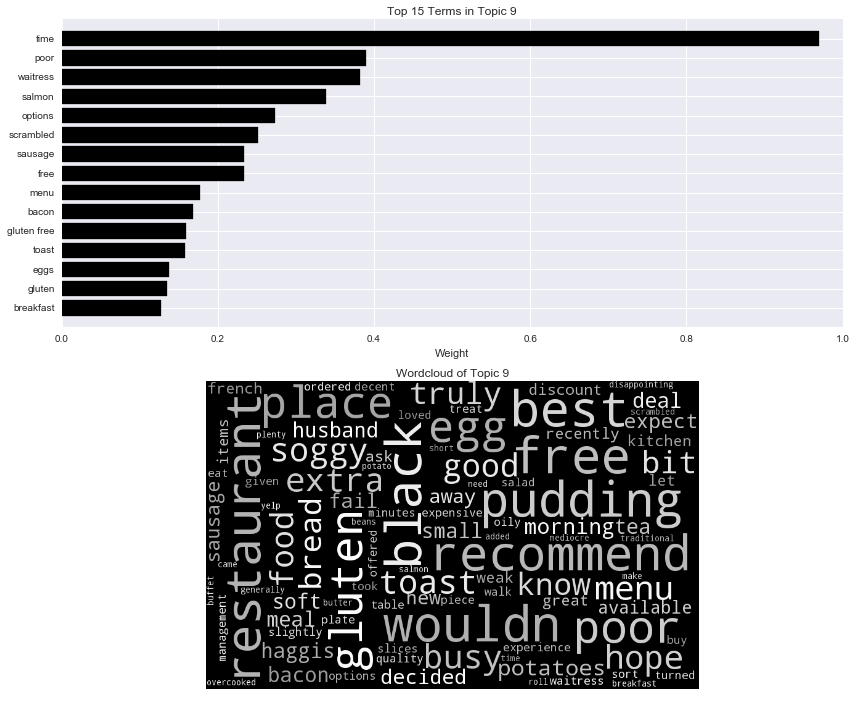


 Topic 10: 

cafe thats tables tea review store customer changed bottle suffered hands sandwich avoid shop sit looks credit floor outside actually station wasnt card customer service greasy right awful yes years food cheap decide say years ago does local cheap minute seat fact stuff ago owner surprised longer covered open acceptable good sign decided im pretty good different milk afternoon previous edinburgh opening staff truly charge read counter annoying clean couple try taking dirty reviews bag afraid going signs girlfriend did loved doesn fat non available hot biggest priced rip eyes walk supposed says putting health close serve pointed paid coffee coming finish sorry leave


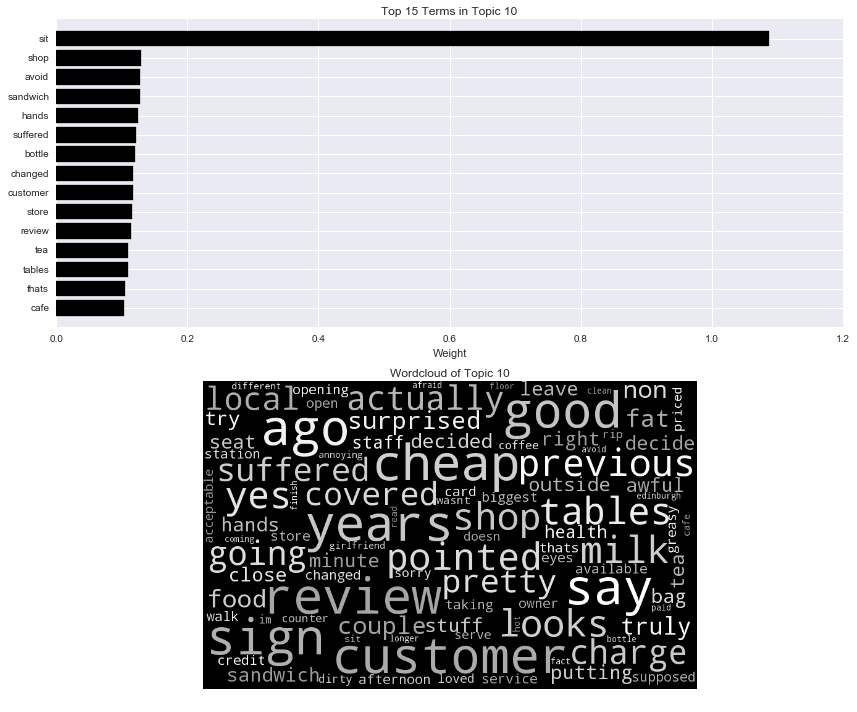


 Topic 11: 

really disappointed got dont really disappointed like soggy just place quite dry people really bad feel won didn went greasy think pork home expensive live guy boy bit spice queue beans bad food overall thats away attitude problem meat family eat mixed small want couldn great love chatting note lovely number generally overpriced reviews coming time change certainly places lost used sound reading choice review times said potatoes fairly thing portion sorry door poor doing looking care tried fast need didn care extra naan husband pasta really looking took end customers didnt service food looking forward nice chunks come walked far hard good true pick leave spicy


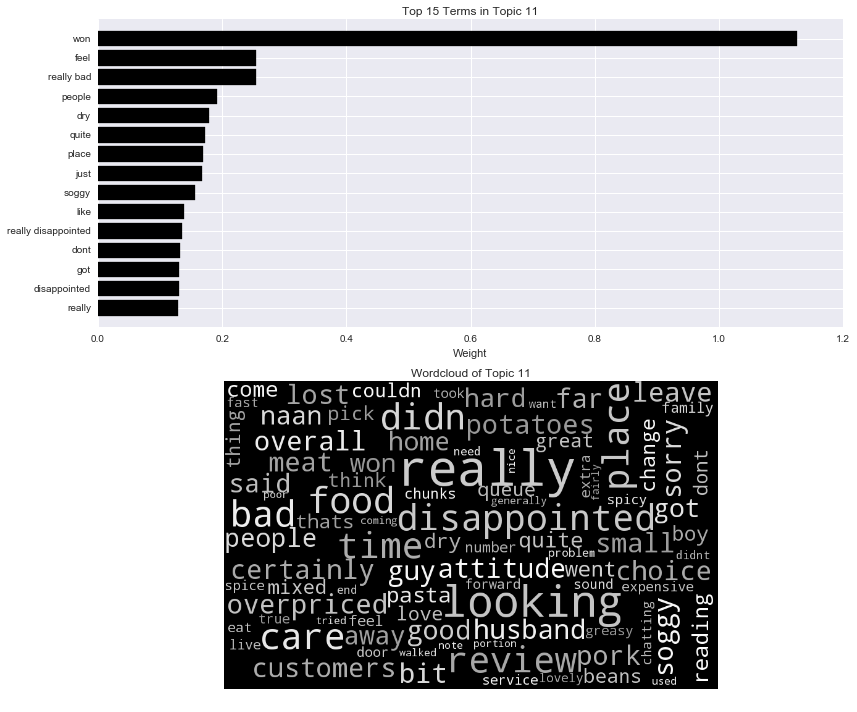


 Topic 12: 

table rude told experience thai walked restaurant friends corner asked didn people waitress staff pm got reservation service sit tables group having quite arrived better did want sure customers said felt main like problem given make customer manager reservations didn want starters just book chair booked way tell left able party evening finished idiot showed visit real window bad experience friendly booking person turned using main courses customer service try dining night let despite kitchen host dessert nope stood went arrive rude staff use dinner salad yelp felt like courses available order returning long ruined cutlery right point pubs welcome appreciate beers unfortunately clearly options expect


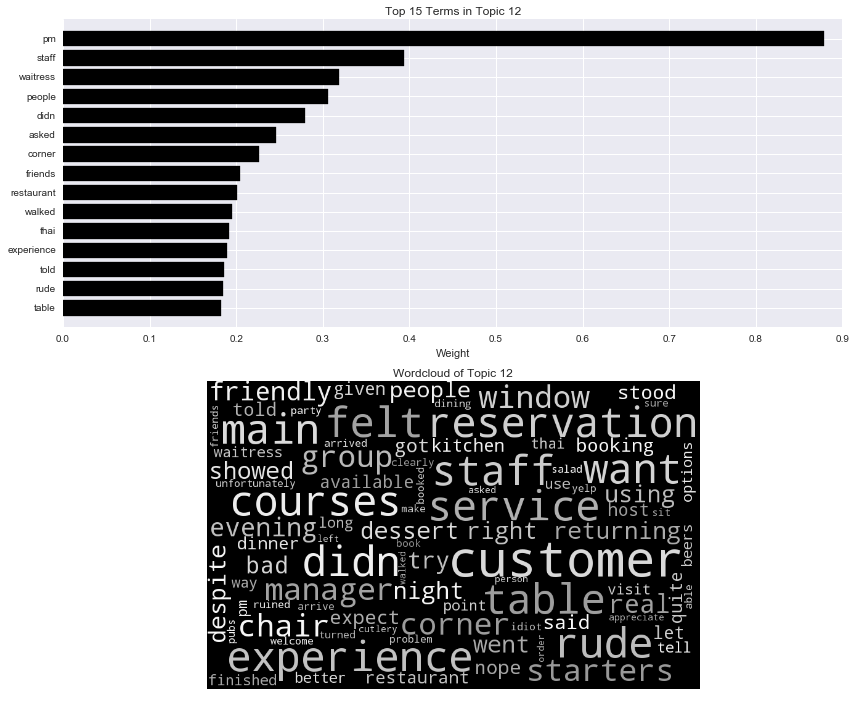


 Topic 13: 

soup bowl didn meal dish ordered impressed main sea good steak try bread noodle decided big reviews wouldn recommend second liked broth worth recommend decent day served tea came st weren husband away girlfriend couple wasn help pick wouldn main course partner starter staff quality gave later come street fish piece far sashimi looked mistake restaurant seated pieces spring hair course caf drinks meals unfortunate portions rolls eat mediocre hotel visited supposed item presentation cakes certainly offer japanese waiter huge tiny american highly seafood value time delicious nice gluten opted visit really didn vegetarian terrible tables olive oil ask texture second chance just meat bland


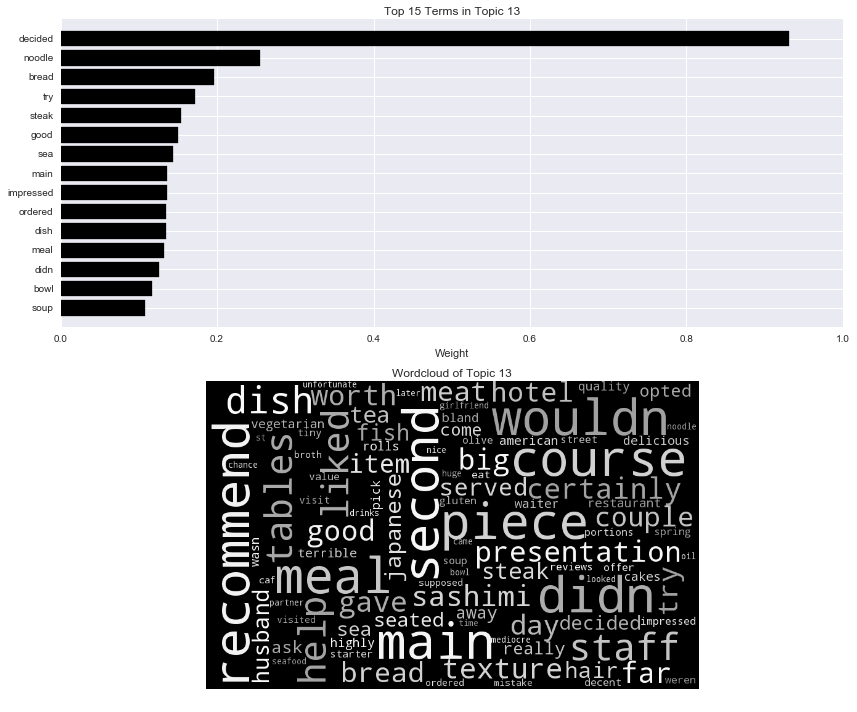


 Topic 14: 

stand come beer warm atmosphere space limited ingredients eat outside run able wanted actually juice good bar ok street eh tomato literally understand time food great makes station pounds times just milk cheap crap knowing make food ok don went close stale prices places nice rice shit wonder waste time toilet told people lower ve hard tastes did straight ate places edinburgh need waste better paying fried end want uncomfortable ve got try new personally mistake squeeze properly main sitting decent beautiful cook thanks cooking sick today pasta personal tried selection ll building lunch desperate known course guess short issue quite train years waiters


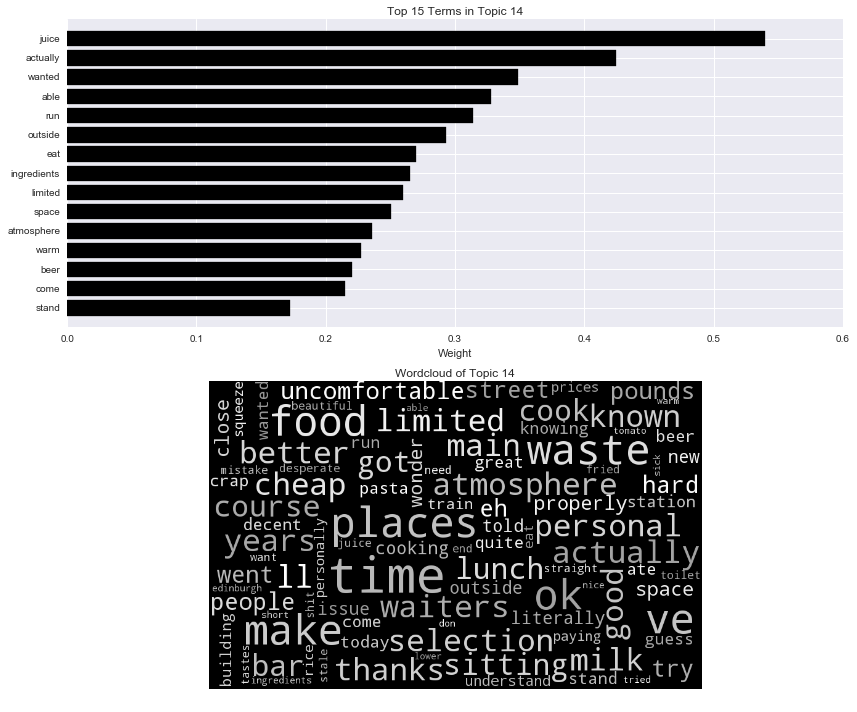


 Topic 15: 

minutes order hour drinks wait took waiting delivery service time mins waited busy finally left told food arrive long half said later came come menus apology away started terrible arrived half hour till eventually minutes later ordered booked wasn called wait minutes took minutes calling couldn went getting orders waiter hadn tried ask sitting meal seated phone given asked finally got despite straight flat disappointed definitely leave passed waited minutes guy long wait finished ordering asking attention hours customer service trying customer got sat worth ill woman option money pizzas deliver hungry seeing walk wrong taken area cold bothered starter min dinner lunch recommend clearly standing appetizers tip


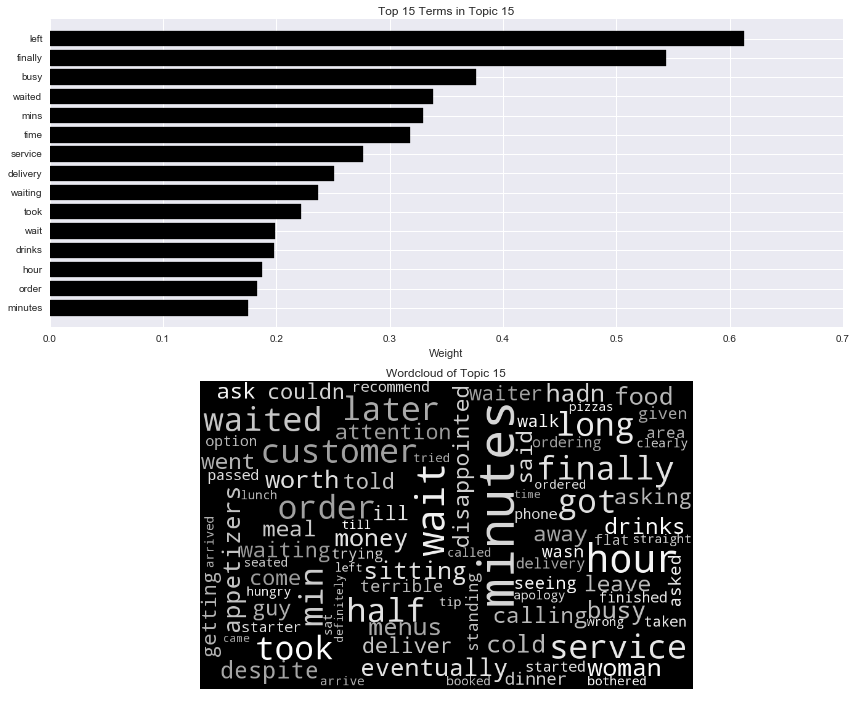


 Topic 16: 

star closed today waiters appears good food ve star rating rating given tasted like business tasted food good bites attitude local hint replaced simply sad longer bread st wings good thing like yelp scotland rate eat pay reviews microwaved okay chair ago cheap fresh weeks ago getting make looking garlic caf weeks thing incredibly dinner food just soggy wouldn fact just great indian little extremely service home main terrible good service seafood zero nearly street flavor let crispy asked reservation light pieces looking forward review wrong giving sitting shit sauce week open forward beef edinburgh ages spicy atmosphere scallops day flavours happy sorry real meal minute party overcooked


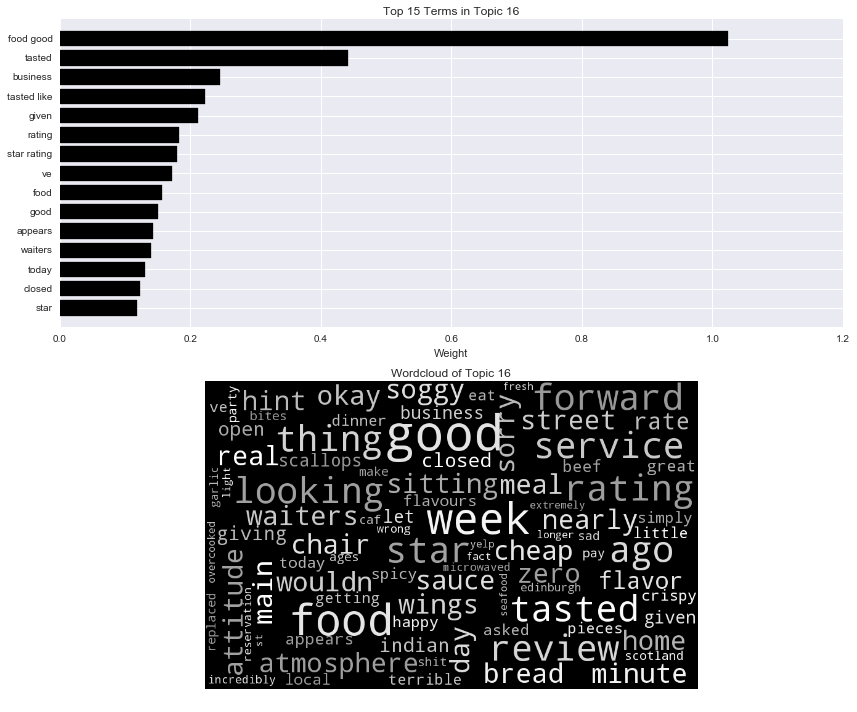


 Topic 17: 

place bar night just time pub reason place just music quiet man waiting la going say probably door following shut toilets best waste city money said business forgot return try leave area leaving thing awful upstairs review floor tables looking especially seat definitely mind decided sure ll staff good dog sat absolutely waste money started lost think let way twice people like unfortunately having free looked sticky downstairs decide working group serve super town couple places times real imagine better wish cut worth dinner pretty discovered nice cleaned felt big thrown toilet need possible bit shop drink wasn meal closed late hoping


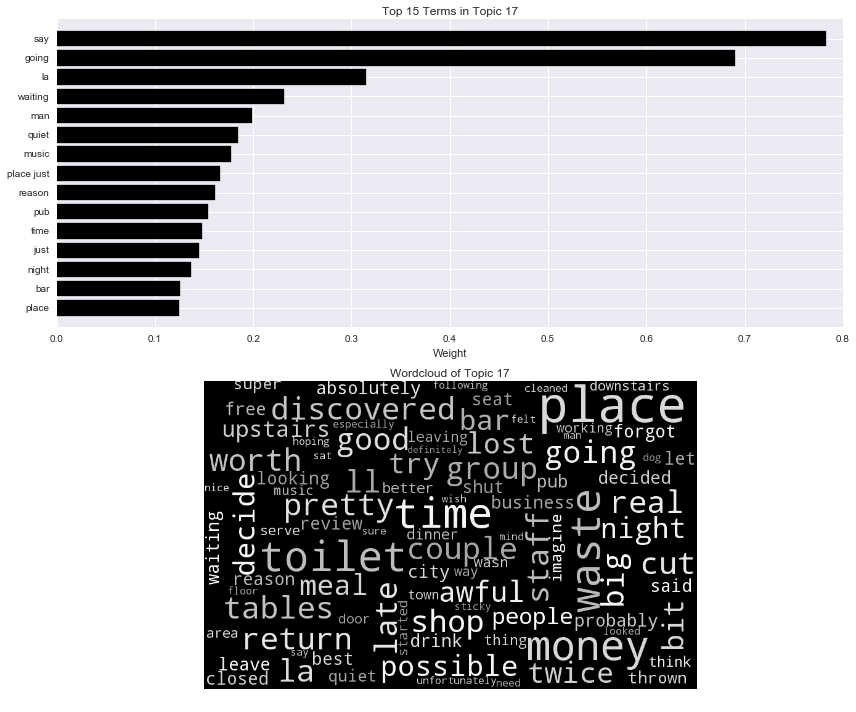


 Topic 18: 

coffee chocolate cake bit day things going thought won tea friends worse nice welcoming tastes place pm good think shops warm coffees value cafes min milk decent come entire customer service people good things roast staff shut love changed owners don lot hate having shot far suffered reading weren woman quite went awful clear fan just house didn hot read glasses toilet stopped getting little cream customer disgusting room nasty beans busy drinking eating great evening feeling good experience mind pleasant early hands honest tried plates friendly work light buy music really did cakes festival didn taste standard understatement pretty understand weak takeaway experiences


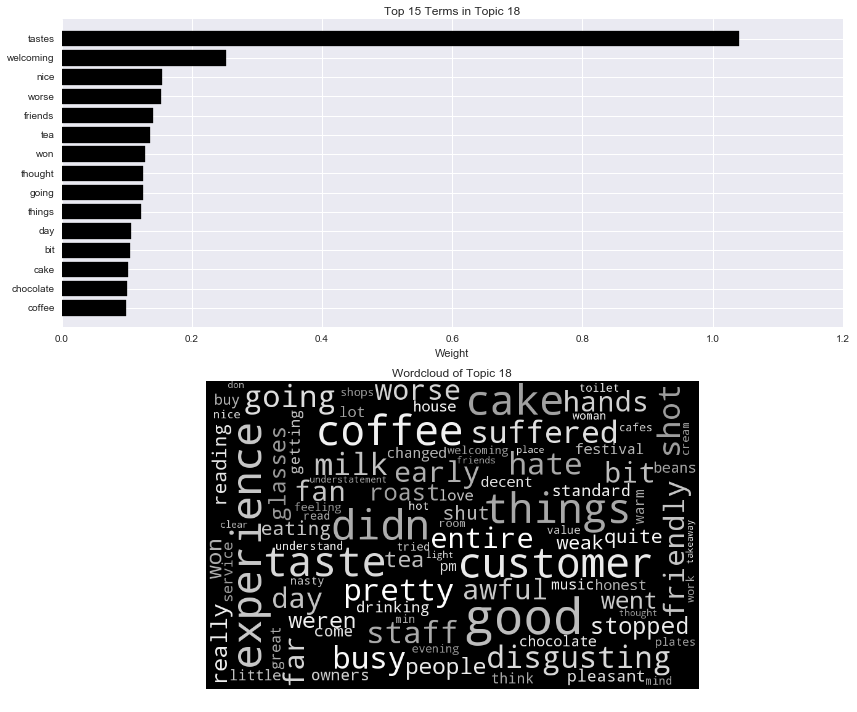


 Topic 19: 

average service slow pub like charge prices place meal water bread avoid expecting long drink served burgers chain ago experience king st expect long wait happen charged microwaved used food menu tasted plastic location starters use tasted like sandwiches wait service slow slow service american won places decent story station servers better city disappointment low took server mediocre redeeming expected understatement pricey fact thanks say got mins normally restaurant food food tasted dish review far goes diner local filling nd area centre end restaurant return dining experience smile unfortunately sushi sunny different added terrible dining service food lucky beer cold edinburgh basic fine bed par personal check high


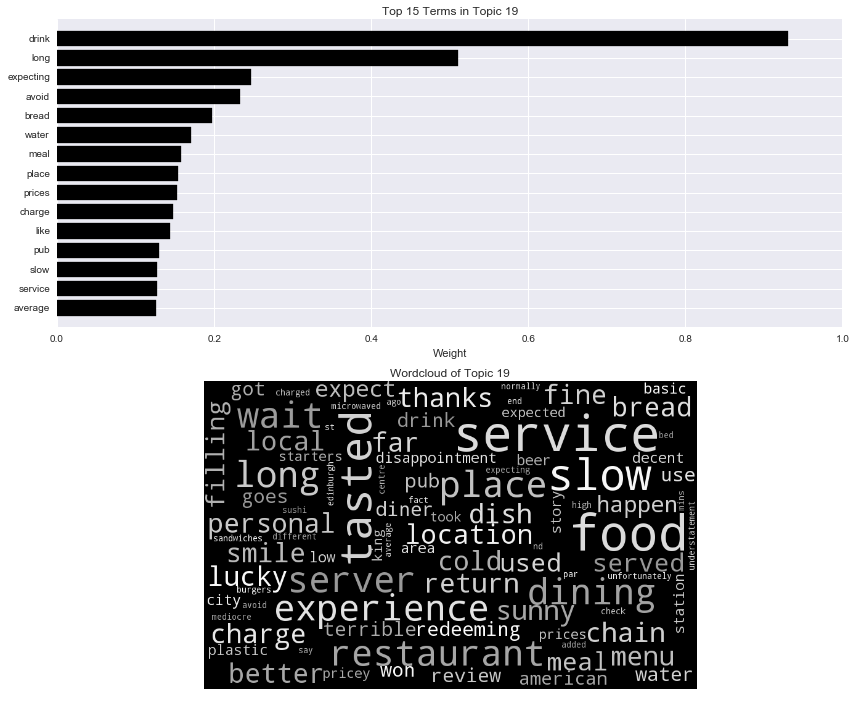


 Topic 20: 

chinese food chinese food noodles sweet sour sweet sour rice taste fried takeaway buffet tasteless sauce restaurants pretty dish fact beef fast eat fried rice worst far looks duck shrimp prawns grey ill unfortunately spring fast food plate disappointment want tofu ate cheap ribs recommend liked real oil card checked going cheaper waitress restaurant fries poor quality vegetarian prawn greasy bland garlic world admit disappointing know plates just tasty really little speak mushroom tasting worse like lot spent makes staying pork old response best let chunks edible vegetables friends food menu hot guests didn probably worst stay mixed rest roll days meat signs host giving spare size


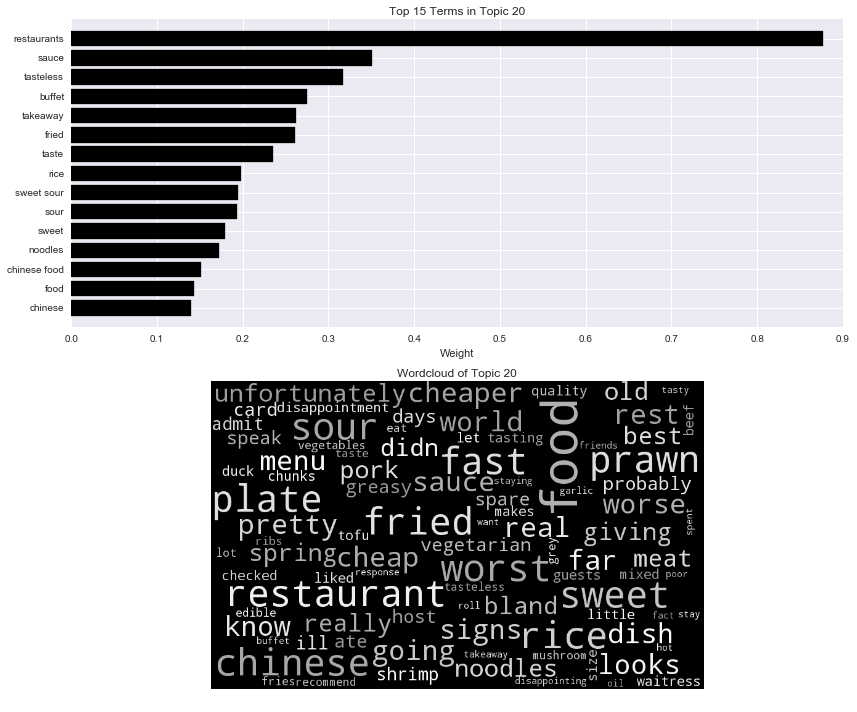

In [19]:
TopTermsByTopic(nmfmodel_1, features_1, 100)


 Topic 1: 

table time order minutes took arrived drinks ordered got waitress waited asked wait long busy waiting came told did didn service hour food left went finally ask sat orders wanted said waiter tables visit door taken away come seated later kitchen waited waited long time poor night times menu walked given ll late drink half point arrive actually seat let pay new eventually ages experience brought starters served wait minutes meal round having decided manager stars leave attention lunch people know guy past gave ve menus ignored minutes later started finished looked birthday needed just thought customers bring couple open twice water near honestly


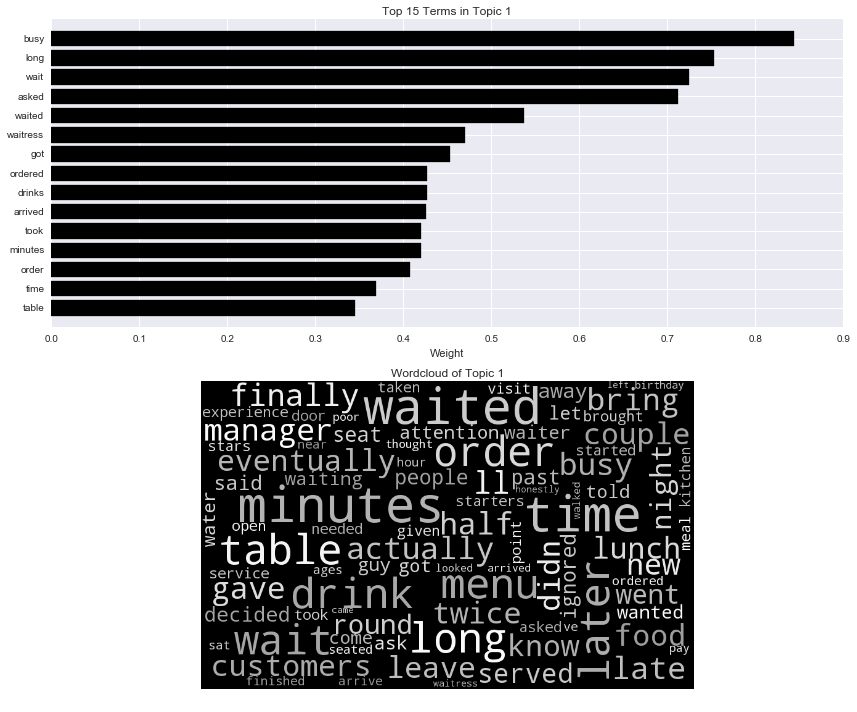


 Topic 2: 

chicken sauce curry ordered rice spicy meat like taste tasted fried frozen boiled flavour wings sweet lemon bland dinner chilli dumplings tasted like veggies actually dry thing enjoyed chicken wings came atmosphere think eating chop beef hard fried rice sweet sour pretty cooked ordered chicken good sour boyfriend ago nice got edinburgh like chicken sauces expected love thai wrap salt lamb sticky quick meal friend fries hype disappointment coriander chewy heat recommend told burrito disappointed avocado raw prawns lacked chilli sauce fast nachos cheap didn taste served guess tasting didn mashed did lot adding soggy removed looking best mainly won pork bite apple worst veg shredded salad night


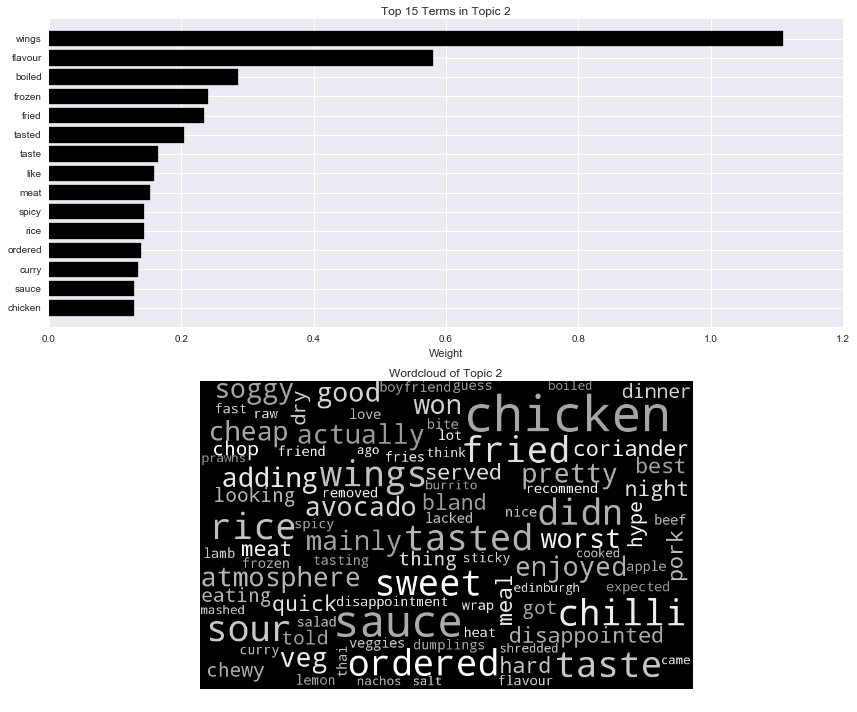


 Topic 3: 

pizza pizzas italian pizza express express cheese paradise base toppings la sauce tomato ate home pepperoni bad delivery pasta slice topping dough getting margarita stone really cooked nice delivered restaurant eaten high road takeaway extra ago pretty meant till review veggie good better late baked quick buying salad case style crust time having stodgy away fact won returning thought place freshly inside gluten ordered bizarre chips pay best delicious free years frozen unfortunately extremely waited menus lost lacked flavour extra star watered places cheap chili different italian restaurant worth calzone greasy definitely seafood joke menu spinach tomato sauce snack hell oily knew starving milkshakes mushroom


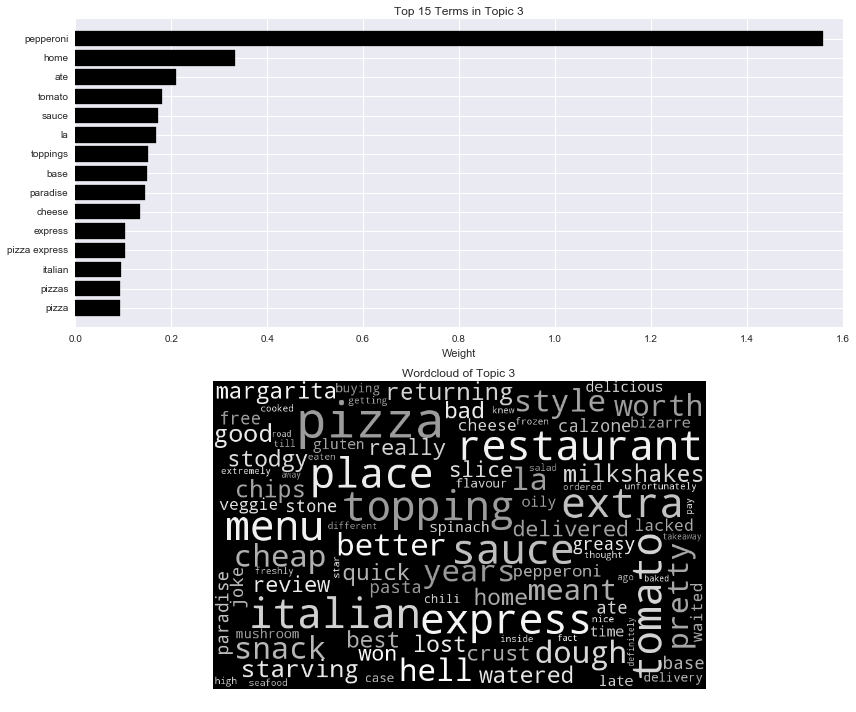


 Topic 4: 

coffee breakfast cafe coffee shop nice good shop wifi look forest eggs cakes like cup place good coffee idea free wifi work say terrible bacon bitter forest cafe cappuccino floor american espresso delicious panini run free house decent half far cafes new space coffee good today customers similar pancakes didn morning got lie music milk pretty points basic attitude apparently non second cold spot sausage caffe decor corner better generic advertised town nero time hidden away tables jam small hollandaise make good walls counter comfortable character world little bruntsfield leith people soup eggs benedict benedict caffeine tempted cups hand wooden impressed opened making waitresses cream positive drink


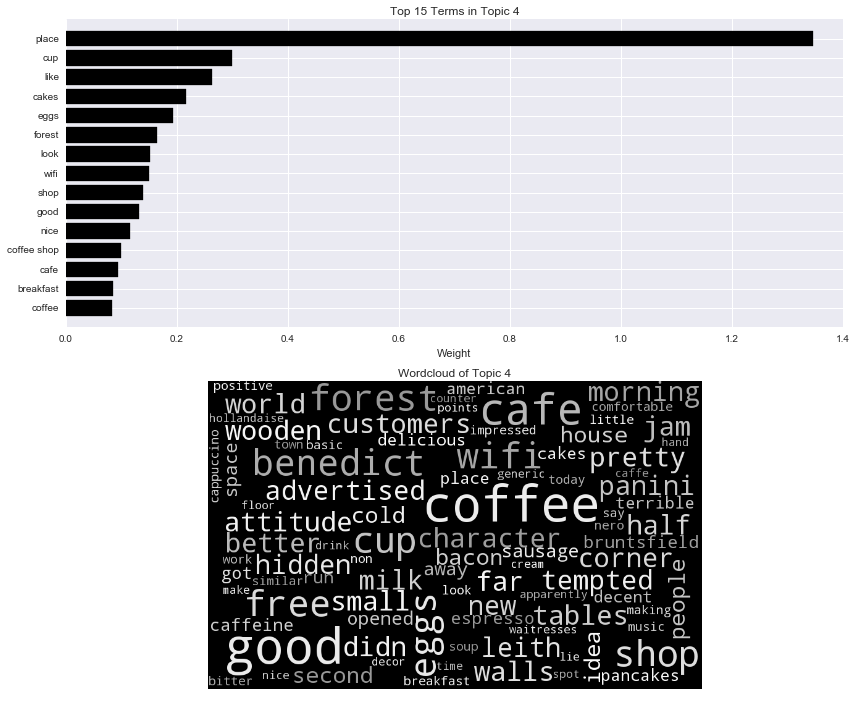


 Topic 5: 

chinese takeaway sushi japanese rice beef food menu rolls takeaways chinese food good fried spring rolls quality prawn spring dish chinese takeaways chinese takeaway dishes soup ramen student prawn crackers crackers noodles eat japanese food won sashimi ve standard vegetarian far really certainly meal overall fried rice noodle usual chilli offer better miso offers expensive time discount awful prawns student discount probably plates buffet duck yo asian salty chinese buffet mushrooms price good food greasy free weird probably won flat egg old number cook does experience like seafood cooking box options isn won coming sweet chewy authentic sour terrible soggy dinner fresh crispy usually went sweet sour delivery rude edible deep fried definitely veggie


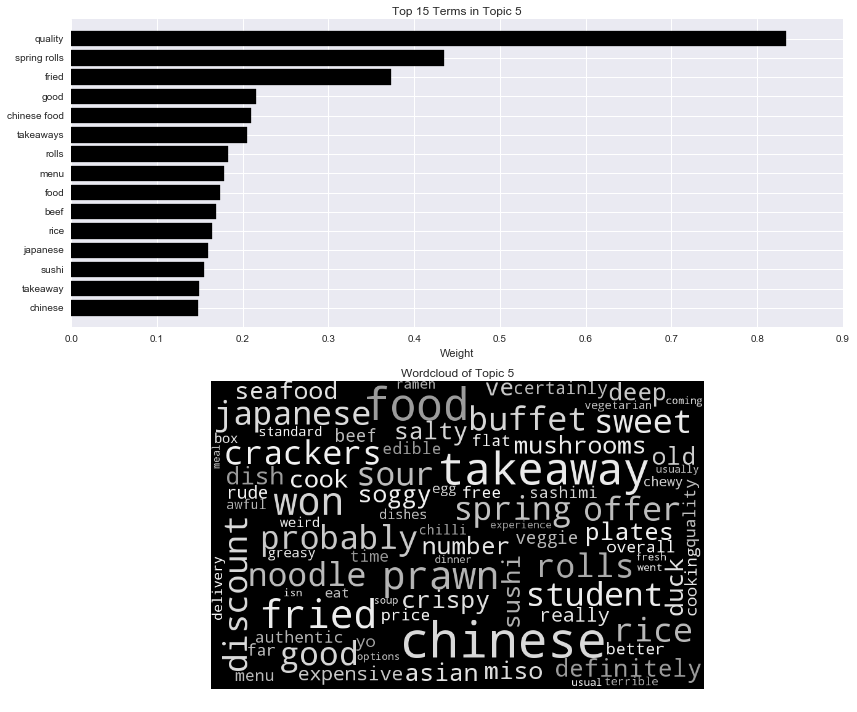


 Topic 6: 

fish chips fish chips batter chippy soggy chip chip shop local ok fishy couldn fried edinburgh hit miss night dinner ordered fish fish cakes onion considering shop dry miss starter eat hit size better came oil onion rings rings pie special ve far bit deep street peas plate vinegar meh ordered spots sea haggis does salad portion extremely pudding greasy sauce crunchy arrived staying looked fresh visit scotland away pork deep fried okay portion size right potatoes cakes tasteless fully mean hungry bad stomach reading cheese attention great hours issue mains rave nope skin didn want notice club price came dinner missing tasted offer quite chips good eating meals fair thought


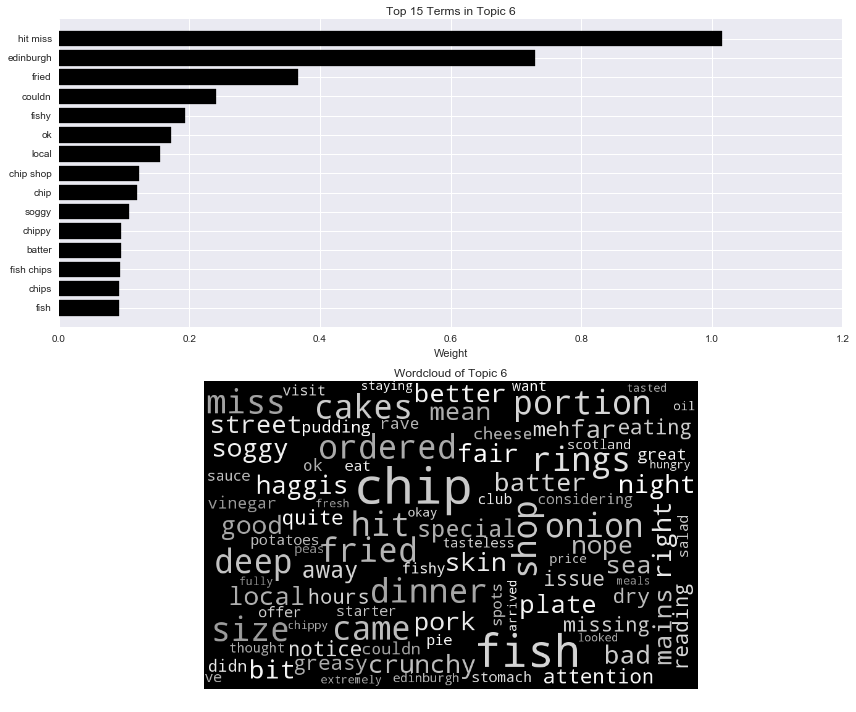


 Topic 7: 

chocolate hot chocolate hot cake nice ordered served lemon cream better coconut dessert writing good rush overpriced eventually sweet slice solid average cakes independent say form dark starbucks brownie really nice got service prices smoked despite taste expect pretty disappointed ice popped ve better jk like guess bother tart group read situation half ice cream ve rich experienced better banana strawberry salt said white experienced butter ve experienced customers especially getting high hit salted hat salmon weather clearly open overall apparently sitting draft soup carrot stew stuff come order gentleman lower chilly wasn review books final places members bitter little nice touch tables occupied half hour watery delicious tray waitress said


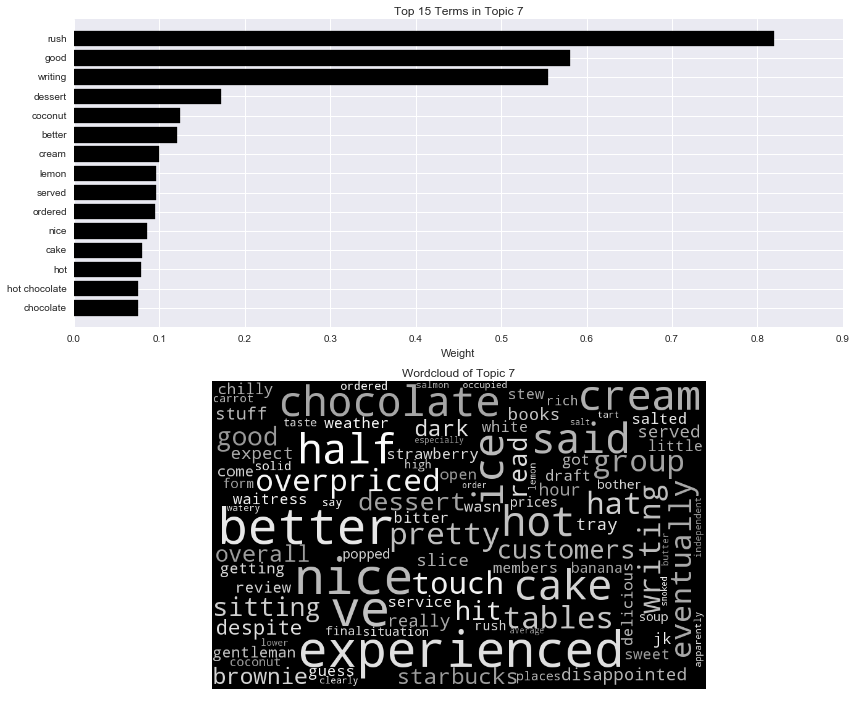


 Topic 8: 

royal mile royal mile tourist trap local tourist trap pubs don centre rude haggis tourists door pretty choice scottish appetizer edinburgh location reasonable prices expensive experience better coffee shop dragged sister situated running shop whisky didnt home giving fact star little service eventually sadly rd staff dated week memorabilia traditional scottish lot away paid convenient basic places traditional lovely ceilings menu long group sad venue kitchen mainly decent hard low appeal weren whilst nice bite british forcing choose open honest large group despite dinner code branch feel aside serving head getting like yeah places eat tasteless turned lot better wrong feel like temperature don expect bathroom ugh pasta italian


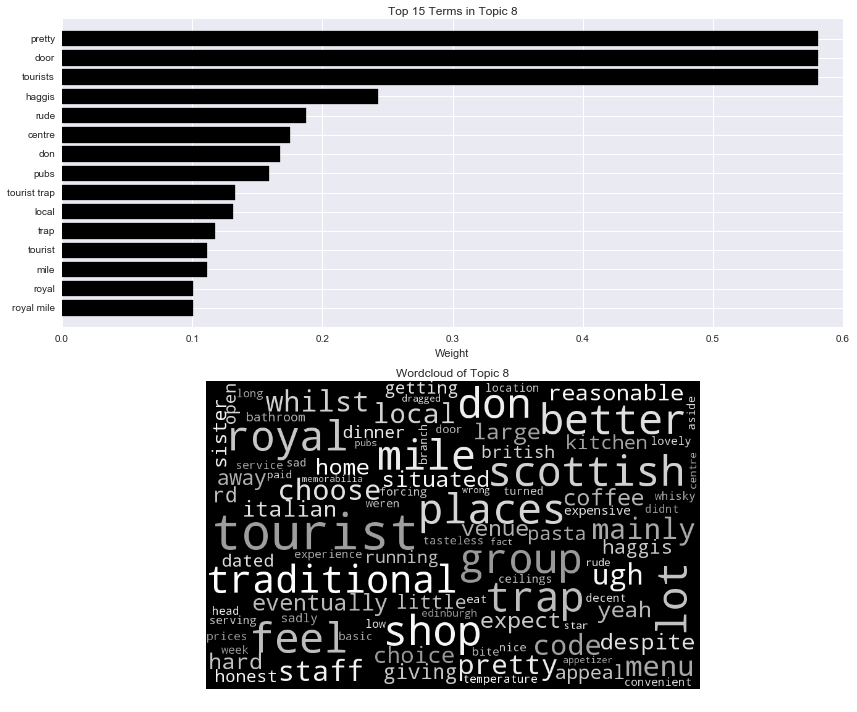


 Topic 9: 

bar drinks night drink bars cocktails room lot music place good student prices large toilet think bar restaurant seating happy beers fairly table service area restaurant bar napoli napoli group atmosphere pint ve glasses cocktail stairs inside shots beer tables reasonable old don think selection downstairs cool able staff haven toilets glass probably kind edinburgh vibe comfy small list heard plus don problem theme friends stand wine fun quiet groups nice people like couches north messy passing choose reason quite personally range venue hear bar staff unfortunately definitely hard broken evening changed students trying parties colour fan huge sort clientele thing lured good place loud just


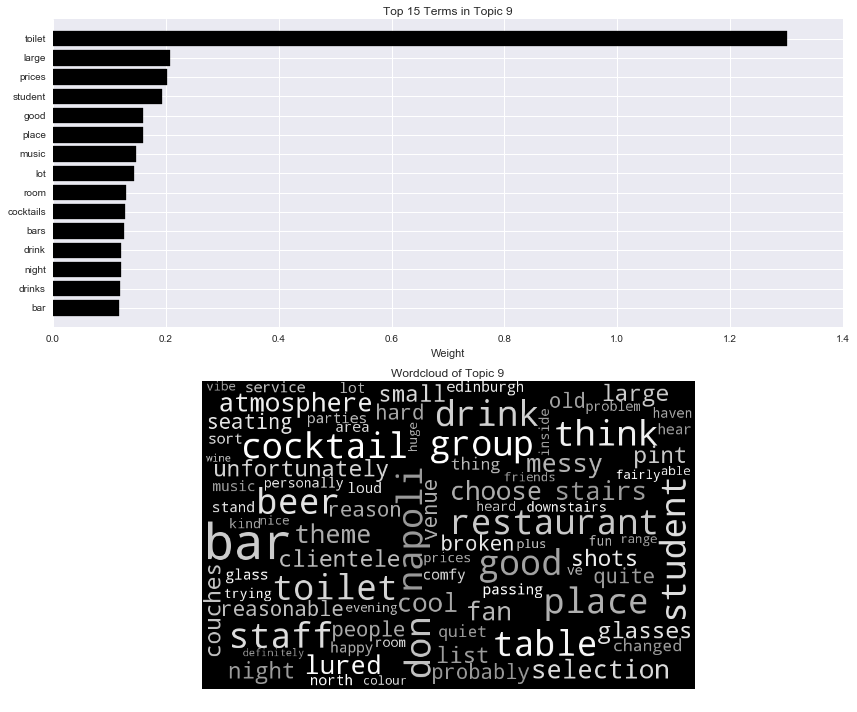


 Topic 10: 

sandwich bread lunch soup cheese day breakfast wasn pork sandwiches try bacon make little went like waitress good brunch just order menu sure eggs panini got bit egg roll bagel place counter bad thought used outside choices small looking soups bags meat bowls dry wouldn olive slice opted prices hot cafe fillings lunch menu reviews half available wanted special looked going new ham know selection hot food asked shop brie nice suppose fresh ah eating size tasty items bad day feel wrong stop pretty train oil impressed lot looked good open toast ll today toasted heard start longer choice lunch time particularly alas decided meadows


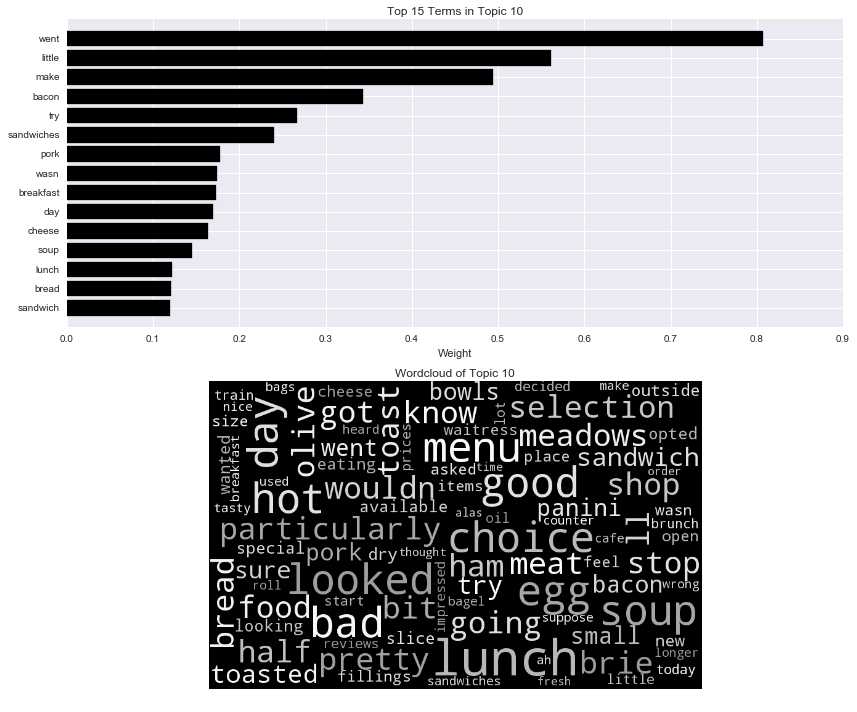


 Topic 11: 

burger burgers bun fries cheese good chips king meat ve better patty bacon cheeseburger better burger good cheese burger taste ve eat menu sauce fast food like wasn quite onions average bit mcdonalds voucher high beer fast mcdonald shakes unfortunately overcooked mac excited disappointed price tasted paper just deliver southern cow greasy milkshake expecting tasted like place visit eve came black serving dry couple lots chicken burger instead veg mac cheese gourmet don recent salad undercooked frozen husband quality gone cutlery sauces beers fiver recent visit went guys potato left joint trying tasty entirely holyrood wife finished chef weren plate coke bakery cherry lettuce worst way chili diner


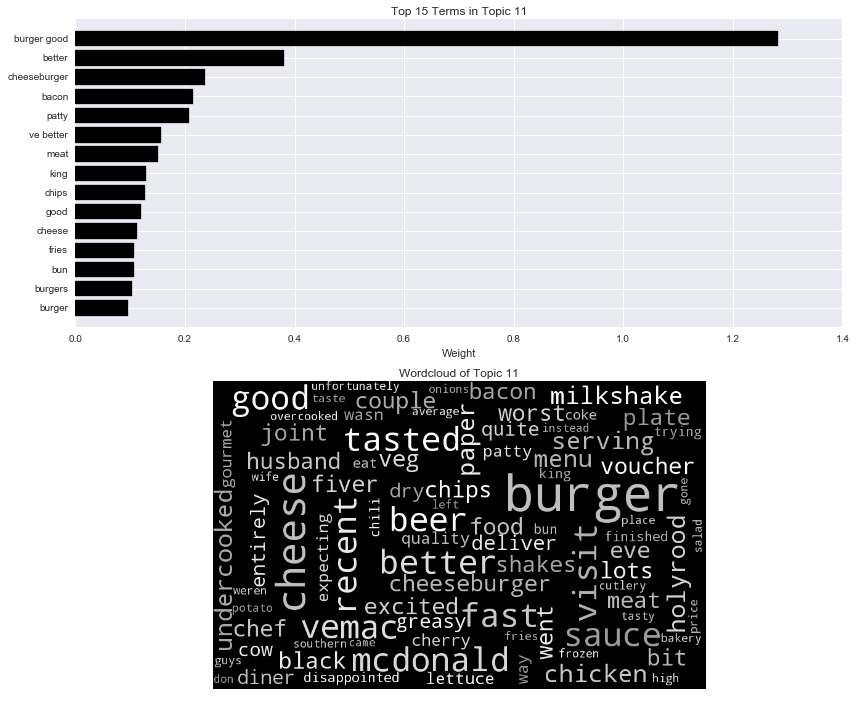


 Topic 12: 

place better street location places great eat best quite kebab edinburgh cheap like isn area money greasy doesn food don ll lot people need thing bit st city centre huge restaurants quality used home time way does princes make ve come going shopping fast feels john times unless try italian aren fact walk shops far busy kebabs old fast food special wouldn day mall music kfc plenty certainly high long looking live prices wrong reason think getting visit station idea honest looks nice night building avoid convenient quick expect past want offer atmosphere exactly price close depressing worth overall said cheaper drink


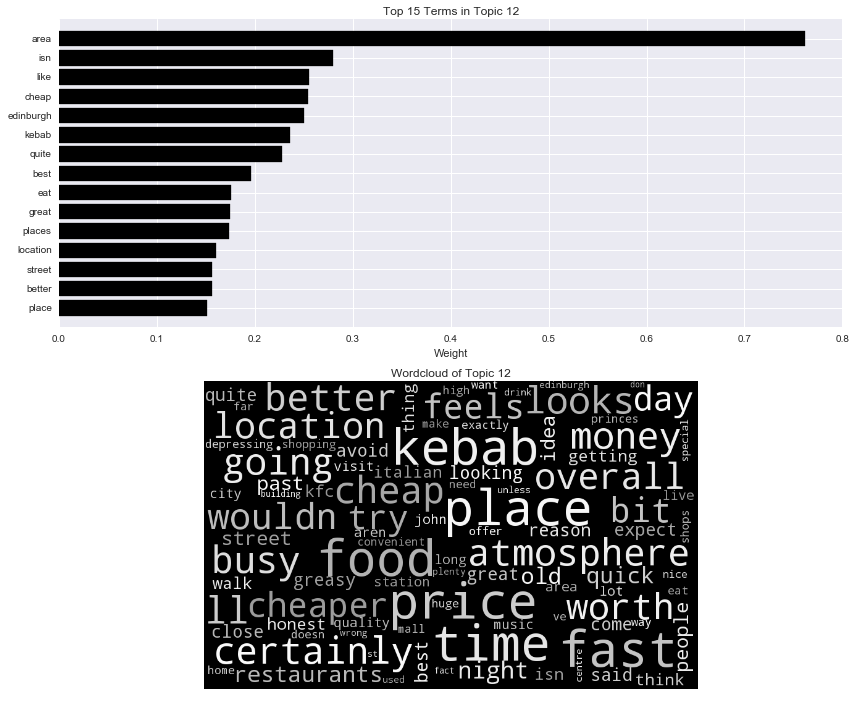


 Topic 13: 

potter harry harry potter jk elephant elephant house rowling birthplace harry birthplace house wrote fan castle prices bathroom place make don jk rowling covered pretty connection just tourists used way probably write famous thing menu food decent reviewers unless want toilets crowded excited ridiculous went bet decide completely visit going decent fans sit sandwiches reason know edinburgh deal week books don know awful coming getting opening coffee taking giving hate love weak school dry try quite dear bother hard view standard instead seats true cold sense won going aren salad dressing cake packed took hour things fact joke admittedly guess appeal weren casual hours disappointing great old like


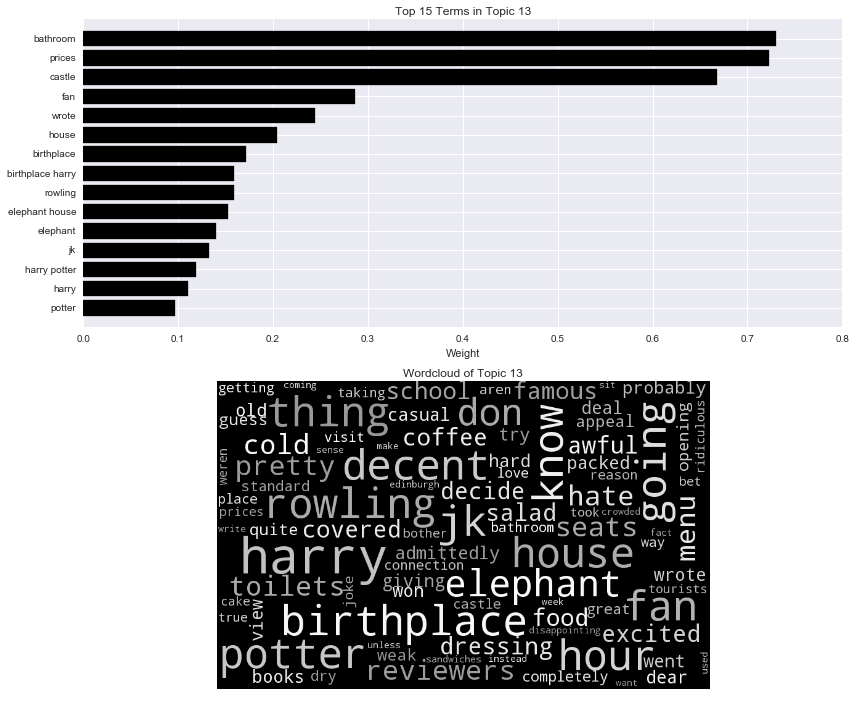


 Topic 14: 

staff friendly food unfriendly staff friendly friendly staff staff nice nice lovely atmosphere staff lovely disappointed good atmosphere really times great rude uninspiring friends plus loud pounds went lunch big lunch couple staff just couple friends food ok music quiet attentive bit went cold quite generous staff really kitchen won ran thai expensive eat customers indian good pleasant ok night bought served positive miserable bad far better waiting outside cafe feel doesn makes waiting staff hurry decent came coffees menu lots disappointing definitely dated turns plates bit disappointed huge thinking elephant attention work quality management pretty mediocre way overpriced great location market meat staff good reviews member old shame decor expecting didnt place great right location


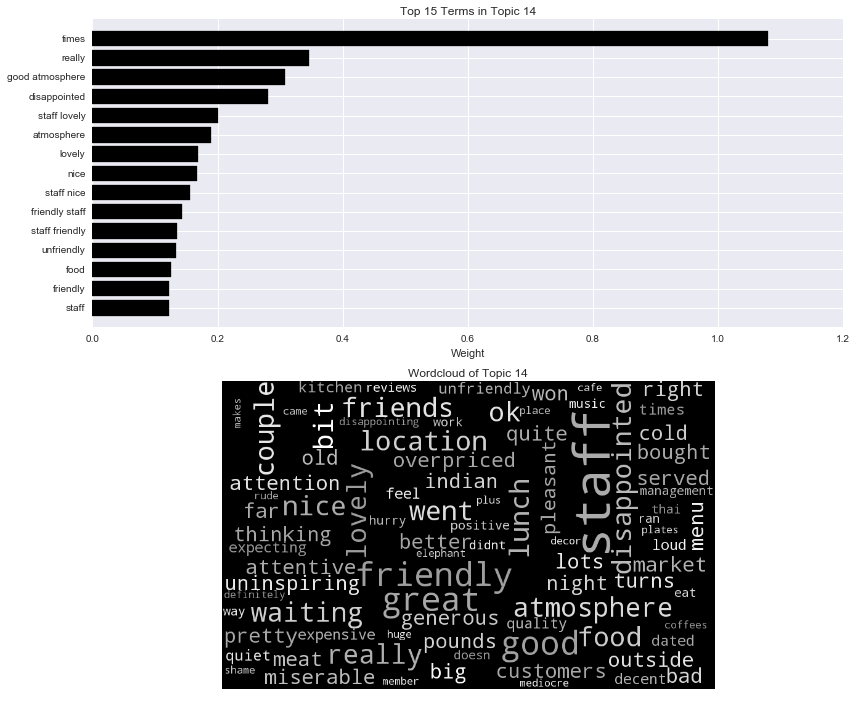


 Topic 15: 

food service good good service okay food good restaurant bland great slow average star good food meal pretty dull food service experience level service good quality priced price experienced service food evening pretty good reviews portions day excellent food okay plastic server clean say didn bad dinner felt drinks overcooked portion slow service place come poor food just based judging quality food return totally good restaurant restaurant food atmosphere surroundings wish considering noisy looking veg fan high pay want forgettable worth check tip lovely horrible man great reviews limited said recommend service really clear review end particularly served food bland fast indian establishment modern expectation time food dog wants dead small portion felt like sadly tasted completely indian food weak


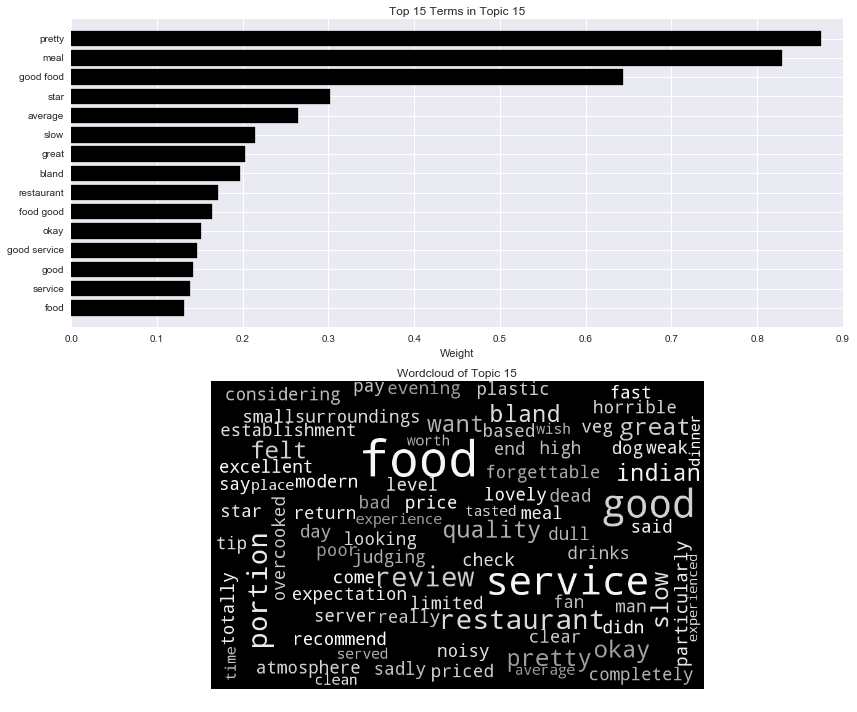


 Topic 16: 

pub pint students student pub food clientele particularly fair share drink share tourists average traditional fair space isn pubs local prices night attract expensive outside discount people area place crowd moved old locals trying corner certainly money scottish tables think directly open group usual located beer drunk range pretty cards decent traditional scottish train fancy man selection screen average food special university change chain food deliver bad years allowed head beers trip variety day particularly good actually flat large liked drinking spend expect asked decor somewhat hang pricey burgers pop type food wasn range drinks write home drinks tatties neeps neeps tatties party super food isn talking food drink watch busier


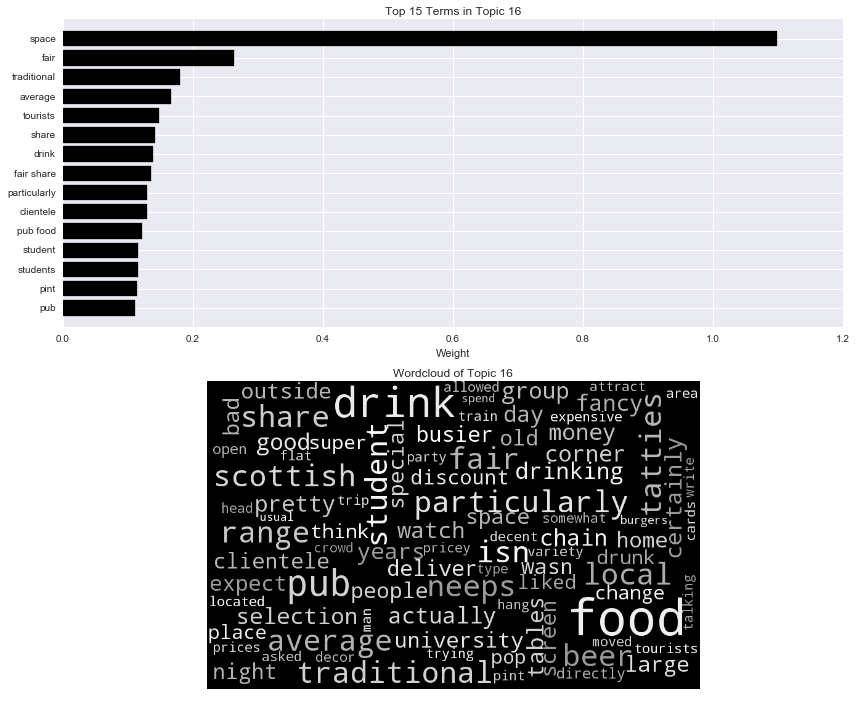


 Topic 17: 

tea cafe roll afternoon scones cup cakes choice pot friend sausage cup tea sushi left bought decor tuna like sausages went bit think half lemon little cups place bad cost stingy standard interesting lovely selection salad green syrup came fine cake ll pricing breakfast things small room visit looking charges wee given strawberry town slightly arrived proper just shop couldn meh maple love really bad worth having looking forward welcoming toilet forward extra ground cute cocktails great maple syrup teas visited book point boy hot difficult tart boyfriend looked espresso like place lackluster albeit green tea entering way thing deal kindly disappointed experience brown slice ask


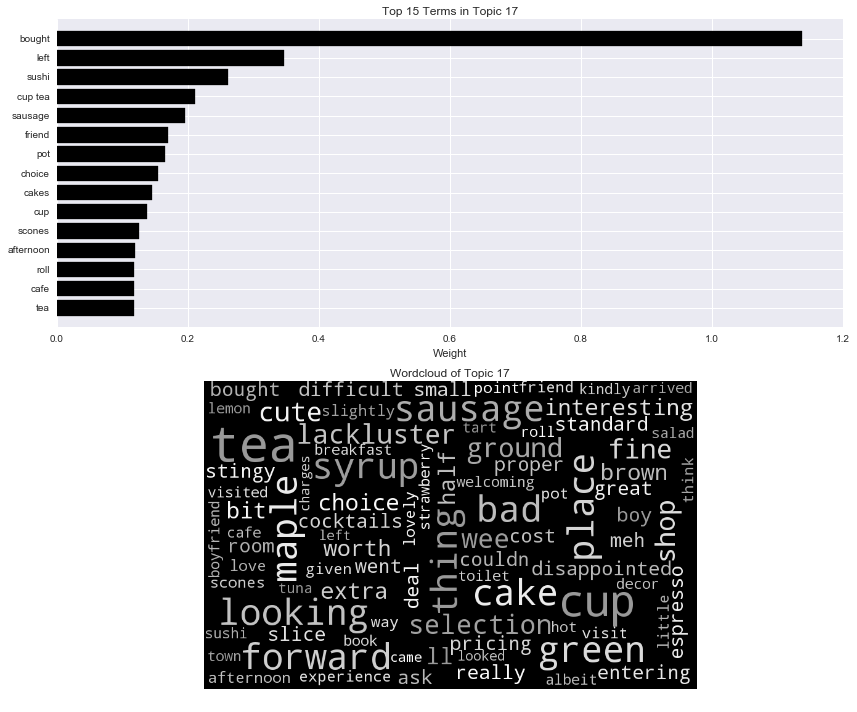


 Topic 18: 

mexican mexican food burrito salsa food guacamole nachos beans tortilla margarita cheese enchiladas love tacos tex mex tex mex fajitas mexico illegal rice bland little sour cream tasteless quesadilla viva mexico viva starter tiny cream say edinburgh want spice didn burritos bowl small pulled pork decor wait jack basic pulled sour mexican restaurant walking past ingredients lamb stuck big decent like place illegal jack past white spicy mains week say place meh sadly don got lack average meal mess bean future restaurants edinburgh joy reason california black drinks food barely pork things portions spanish authentic beef recommend hungry pretty walking rate odd way middle decided ordered chips main taste manner send


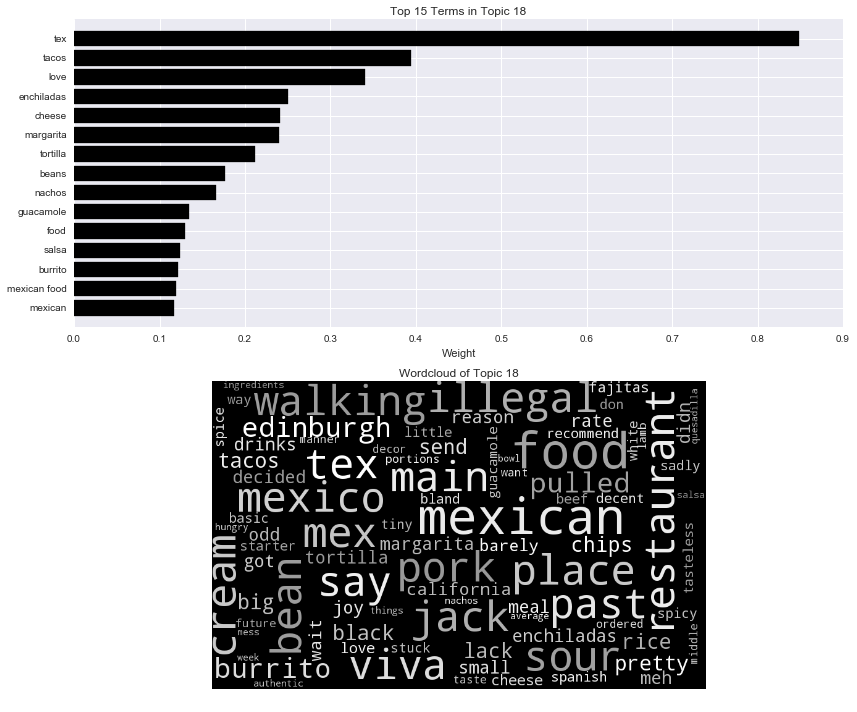


 Topic 19: 

restaurant steak wine menu wasn pasta room main table dessert better starter meal dish italian nice courses dishes ordered small pretty soup restaurants glass waiter bottle seafood flavor cheese came good medium cooked sauce served overall white disappointing server course red dining glasses going didn like fine white wine way portion great far fairly said seated instead scallops dinner edinburgh taste rare plate decided best cold wife yelp booked pork pm butter stars main courses tasty attentive quite ok average risotto husband offered experience lovely did big brought salmon special steaks quality mushroom set asked looked inside need expected thought house appetizer


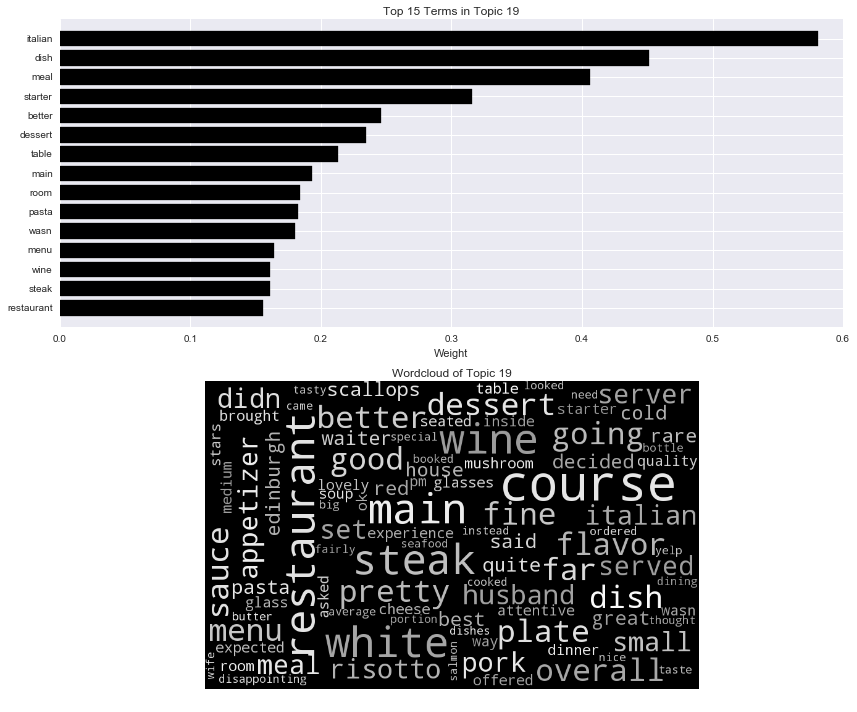


 Topic 20: 

just really like bit ve don ok didn know little experience think say feel people quite felt place look taste bad time actually sorry going did meh wasn flavour things food just friend don know kind feeling just ok way oh saying real got food disappointed try come didn really slightly make want yes trying use great looked meal chop noodles dining guy years tired little bit cool feel like doing guess drink cut wrong style don really boring amazing tasty just bit really really doesn left really just shame kinda wanted making idea review stuff caught lot la coming ve eaten sure big american stars gone came expecting eating fresh


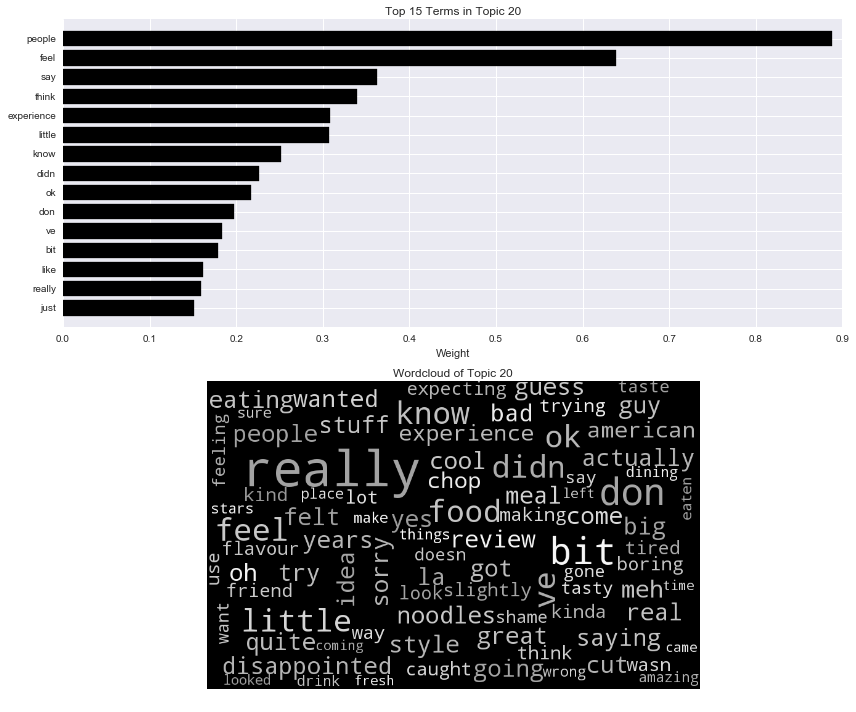

In [20]:
TopTermsByTopic(nmfmodel_2, features_2, 100)


 Topic 1: 

really like just place ve don think bit want know times kind feel bad love people look time food going isn thing say come places lot doesn way actually ll wrong street things quite make little stars does old said used big didn yes don know eating better sure wouldn got end hard feels amazing centre pretty probably high right work ve got makes need day fine review edinburgh new seen don think feel like far shopping plus wasn eaten home place really best mind past really good reason given exactly felt quality really really like place don wrong shops trying taste slightly just don worth city won kind place honest


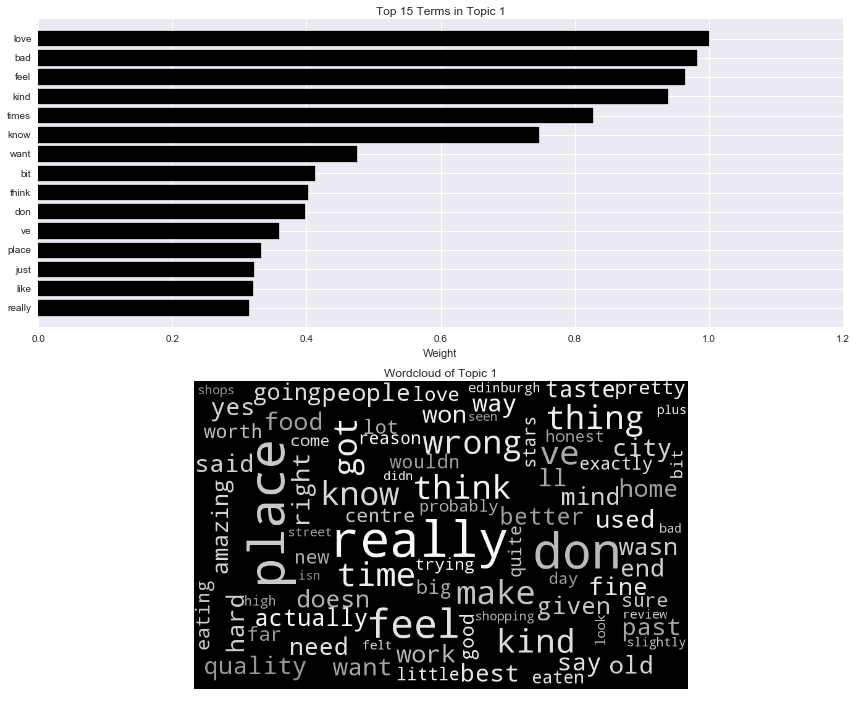


 Topic 2: 

pub beer selection drink ales beers decent grub pubs pub grub traditional pint student grassmarket quiz pub quiz standard scottish old does pretty doctors gastro edinburgh pub good gastro pub students good selection special isn standard pub quick drink cheap drinks tourists football royal prices mile atmosphere ale dog probably royal mile year crags bit fairly quite place evening local burgers watch whisky stag tap busy going means visit traditional pub live popular quick drinking station perfectly wee located location night discount isn pub stop near spend area garden packed lagers selection beers seat nice pub likely best right wide scottish pub fine range pub food fun crawl pub crawl sports range beers albanach traditional scottish seating


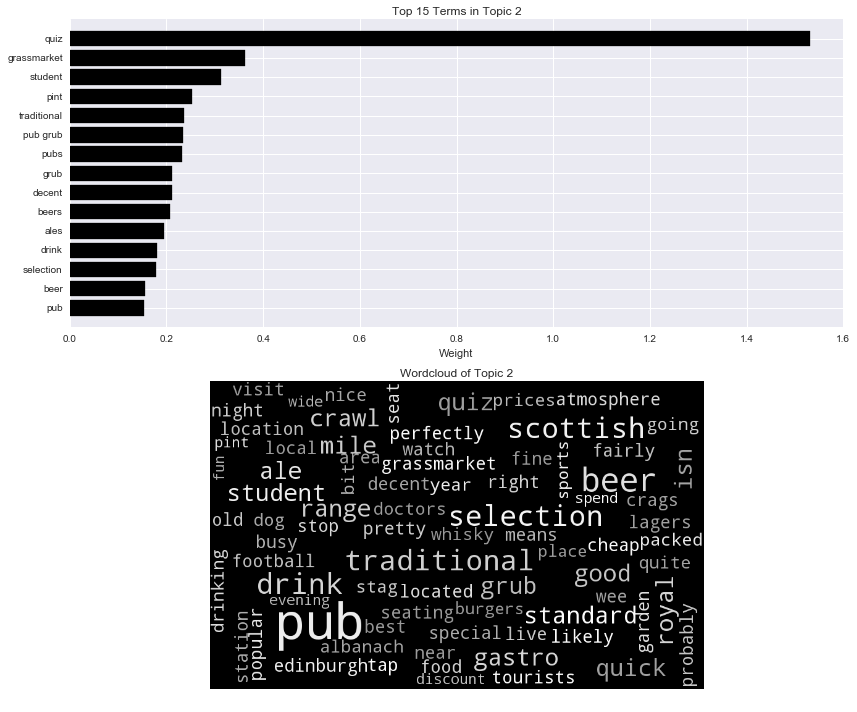


 Topic 3: 

good food service pretty food good ok place pretty good good service service good good food decent price overall value prices better fast good value money quality bad food ok bit food pretty really good average good place quick value money reasonable worth friendly range dishes experience overall said quite priced visit expensive fast food tasty definitely good good decor staff restaurant said good range seafood menu slow lovely food quality food atmosphere probably good selection ate fresh restaurants pricey good atmosphere uk good option edinburgh general reasonably food tasty came excellent recommend terms selection portions place good friendly service presented lunchtime server bit expensive high staff friendly ago best went places lunch overall good attentive options long italian fare authentic need years good quality real quite good


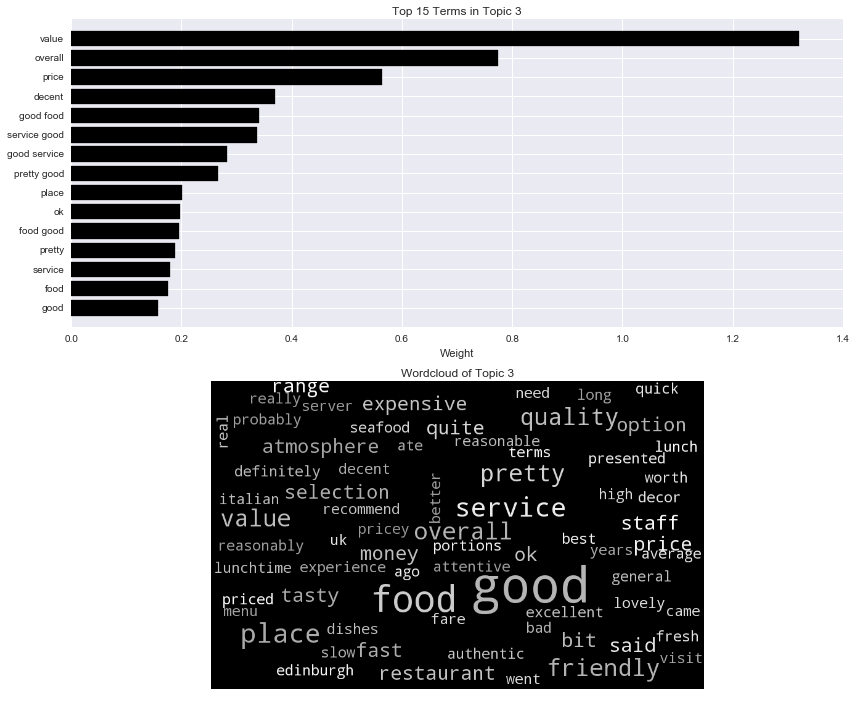


 Topic 4: 

coffee cake coffee shop shop cakes chocolate latte shops coffee shops morning wifi good coffee coffee cappuccino starbucks kilimanjaro coffee good press coffee great good coffee artisan cup come milk staff average flat white pastries corner coffees dropped scones espresso free sandwiches flat fine great coffee day try looking cup coffee need just deli white roast lattes carrot carrot cake artisan roast round late nicholson slice coffee just brownie hot looks sit street people like students counter work just coffee coffee really stop coffee food unfortunately strong mondo decent little check chain place beanscene nicholson street long trying reviews chai coffee ok quite coffee cake feel read spacious quality decent coffee area drink clean fi lack hot chocolate best usually


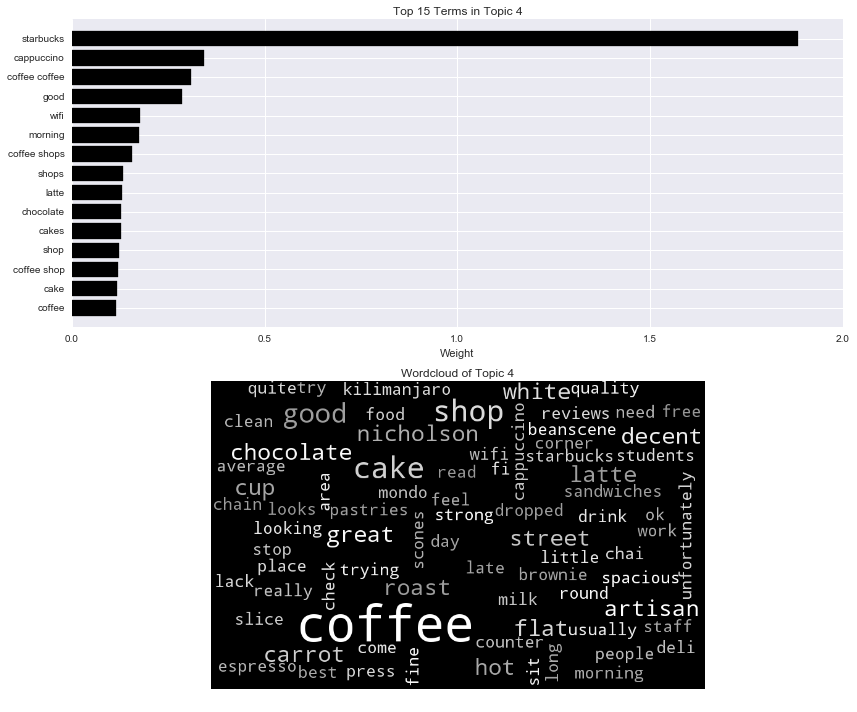


 Topic 5: 

fish chips fish chips chip chippy fried chip shop batter greasy shop pizzas pretty portion deep battered quite just fish bar rapido deep fried chips pretty supper fish chip decent crispy good peas menu mars mont suppers haddock fish supper cooked chowder sausage steak okay soggy salad mars bars takeaway chips good city outside pretty good burgers mushy peas fried mars sausages ordered inside best standard wasn say mushy probably dinner things city centre cheese chips fish bit tastes experience chips like ordered fish night average seadogs chippies prices home fry really rare haggis serve hours sauce ve fresh money old dogs usual better bit greasy scottish square fat eat edinburgh goat cheese mediocre goat cod fish cakes smoked


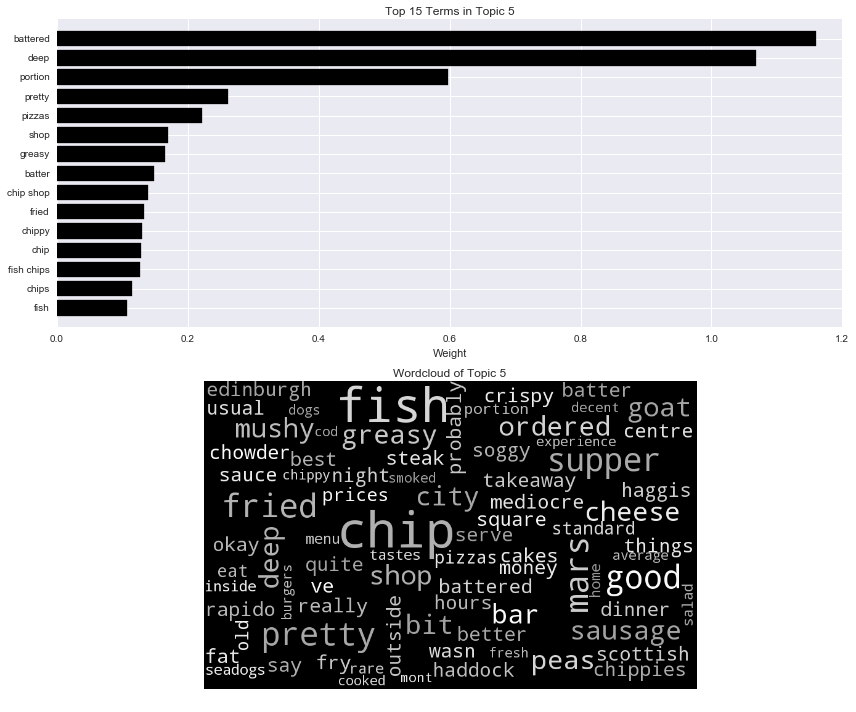


 Topic 6: 

burger burgers fries bun chicken cheese beef chips onion chicken burger ok did american cheeseburger rings beef burger holyrood order onion rings patty red burger king fast meat cheese burger fast food bacon just came taste veggie gourmet burger joint best got bit frozen king diner beer options fried burger fries tasty menu ones liked burger ok falafel good really mustard burger chips went southern special joint beef burgers cheap burger bun sauce burger place standard like thing edinburgh try time fan half free burger good burger menu opted coleslaw joints milkshake squirrel specials honest things selection better salad work meh saw cheese fries glasgow lettuce quid huge burger just style dry burger really sweet potato star good burger wooden


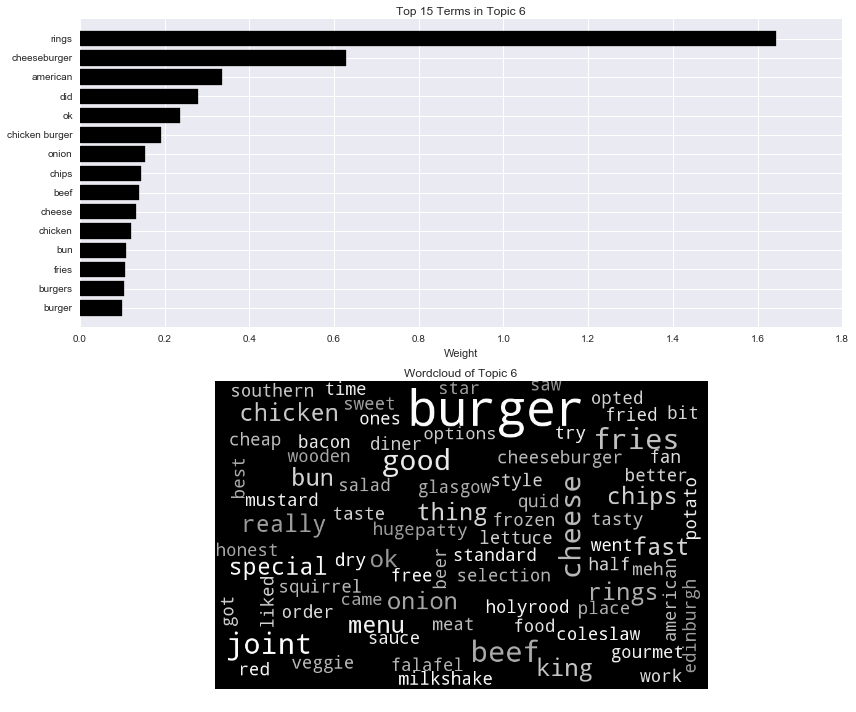


 Topic 7: 

bar drinks night music drink cocktails area cocktail people bars tables cool loud space room old beer time beers street quite live music fun live place dance bar staff good couple big pint evening busy irish drinking definitely staff crowd say looks bar area upstairs feel seating visit group new floor venue sort table students downstairs fairly friends open pretty ll priced going late looking large quiet range things serving booths work bit lot served menu way dark clientele offer having seats dancing treacle week sit location start gin bar good summer happy outside atmosphere makes vibe list did weekend cosy pricey conversation different


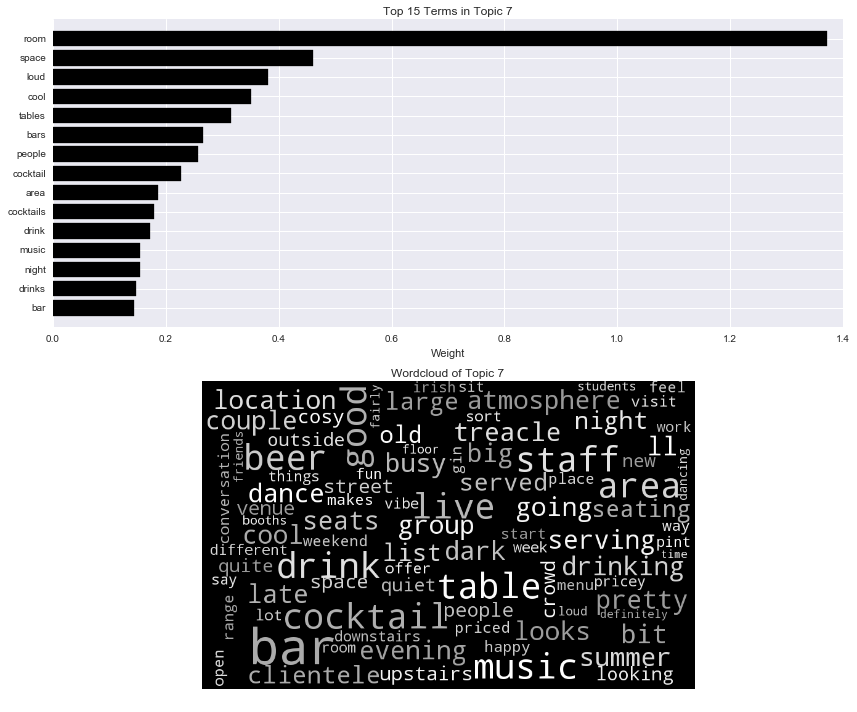


 Topic 8: 

soup sandwich lunch sandwiches salad deli bread quick cheese shop day baked filling soups tasty lunch time looking offer time potatoes eat options soup sandwich roll potato today lunchtime cheap choice alright choose area panini fresh tomato wrap sandwich shop bite baked potatoes overall just lentil pop paninis friend fillings bit pretty wee toasted decided rolls small inside chicken overall said hot new soup day grab little better salads vegetarian said town baguettes quick lunch walked deal warm healthy usually avocado tend menu castle got delicious came sit outside bacon brie caf set decent available baguette afternoon places work business filled hungry super salmon place lunch tattie looked


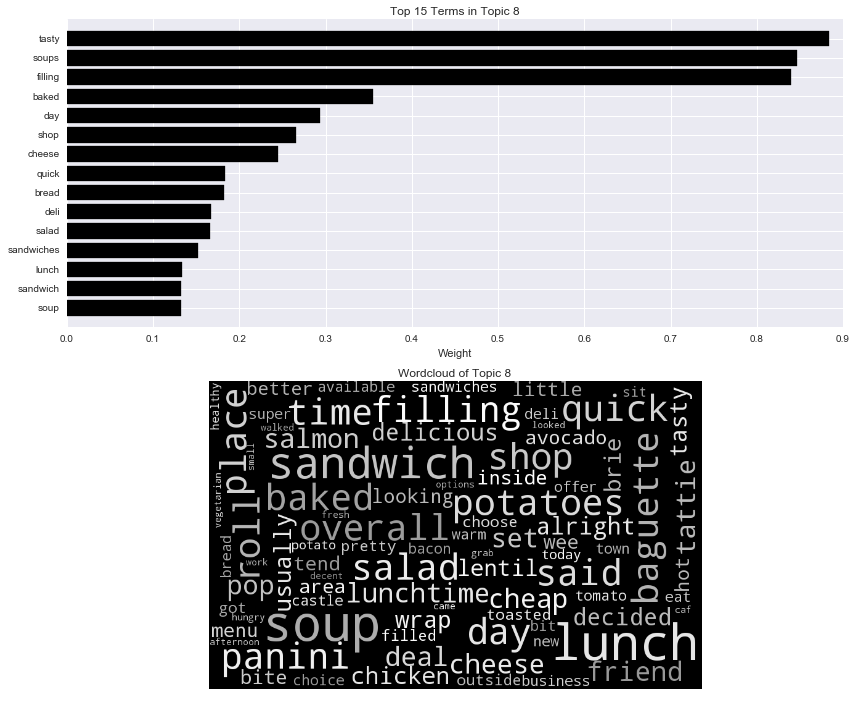


 Topic 9: 

tea afternoon afternoon tea pot cake pot tea cup scone cup tea eteaket cold tea coffee table cakes scones place water tea bit coffee tea sweet caf friend seating thing popped visit comfy got didn service tea good hot teas left sandwiches definitely room time practically chai castle cups cozy look bit cuppa liked pass central wee quite sweet clotted clotted cream choose free bag view baked twice cream don cramped served carrot mini best edinburgh pastry shots know perfect place nice looked warm jam classic review funny sure weren asked really liked options bridge hot water conveniently potential tart doing slice nice box okay chocolate book finished tables weekend did read


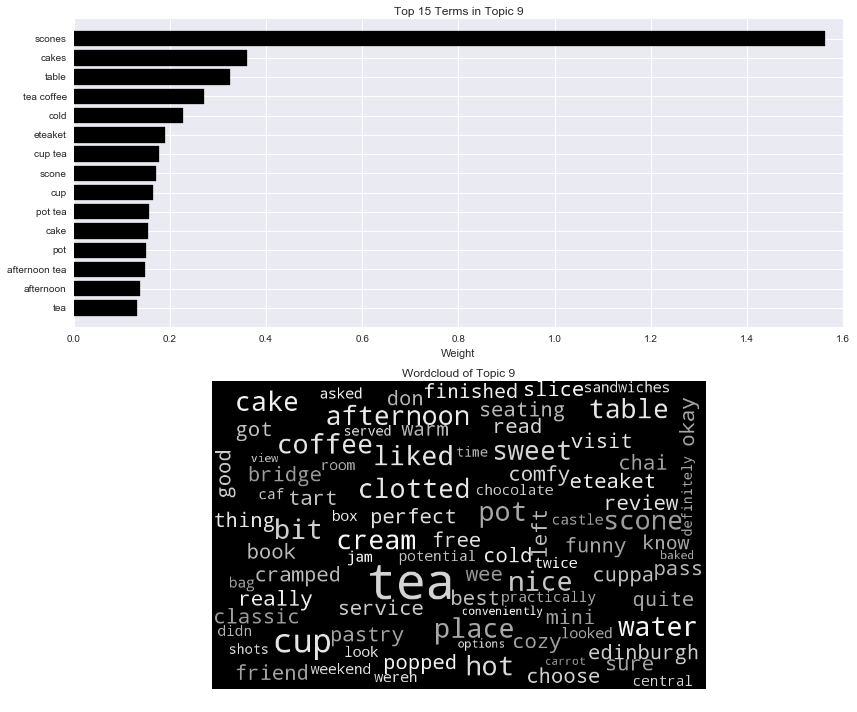


 Topic 10: 

chicken curry thai rice indian sauce dishes curries lamb naan meal kebab dish spicy tasty food meat restaurant came ordered pad pad thai quite pork green delivery chilli cooked poppadoms tasted noodles kebabs menu flavour wasn friend beef dry prawns fried fresh rice naan indian restaurant portions tikka probably indian food vegetarian salad cheap tried price taste main green curry thai green buffet prawn mixed chunks night pakora flavours vegetable ve thai food garlic masala tandoori spice style options reviews kitchen korma curry rice meals coconut malaysian sweet noodle curry sauce tuk veg craving ok vegetables evening overcooked hot spiced mosque like bad bland mango particularly pepper paneer free


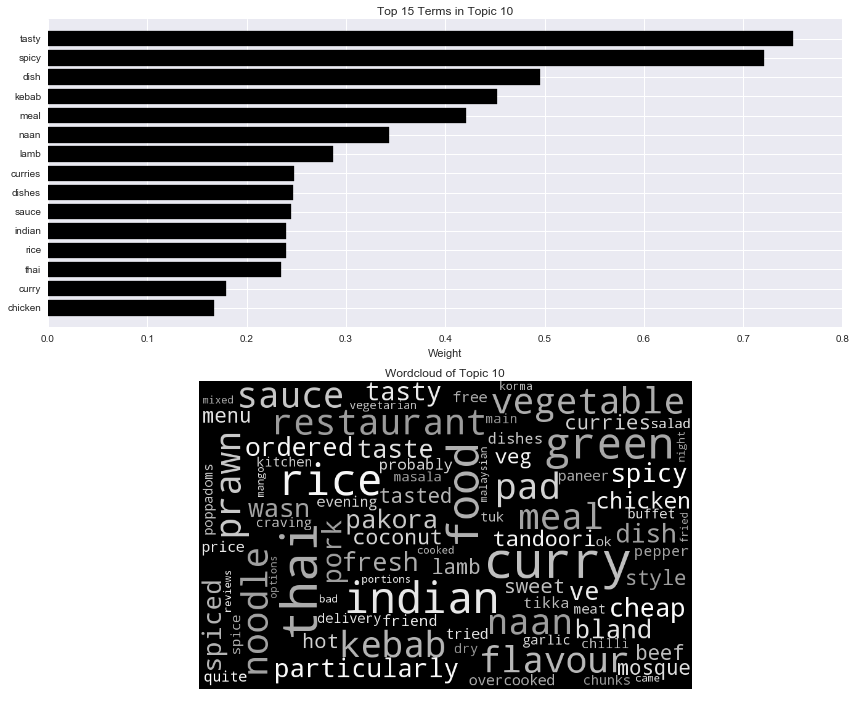


 Topic 11: 

great food great place place great food atmosphere food great service staff selection location service great portions staff great quick great location music time great service slow view great atmosphere really place great great quick drinks leave good great coffee great people cooking kids fantastic friendly expensive lunch got great idea food portions used loved great idea great selection food let tasty delicious deal wasn great nachos service slow great deal choose quiet place food unfortunately price cheap times buffet tables yummy easy got friends relaxed meal horrible especially big ambiance large stars food menu location great says hit tasty food isnt drinks expensive great just awesome hall walk overall great potatoes views memorabilia excellent place come mediocre tastes journey came right great views shame great time atmosphere really amazing produce


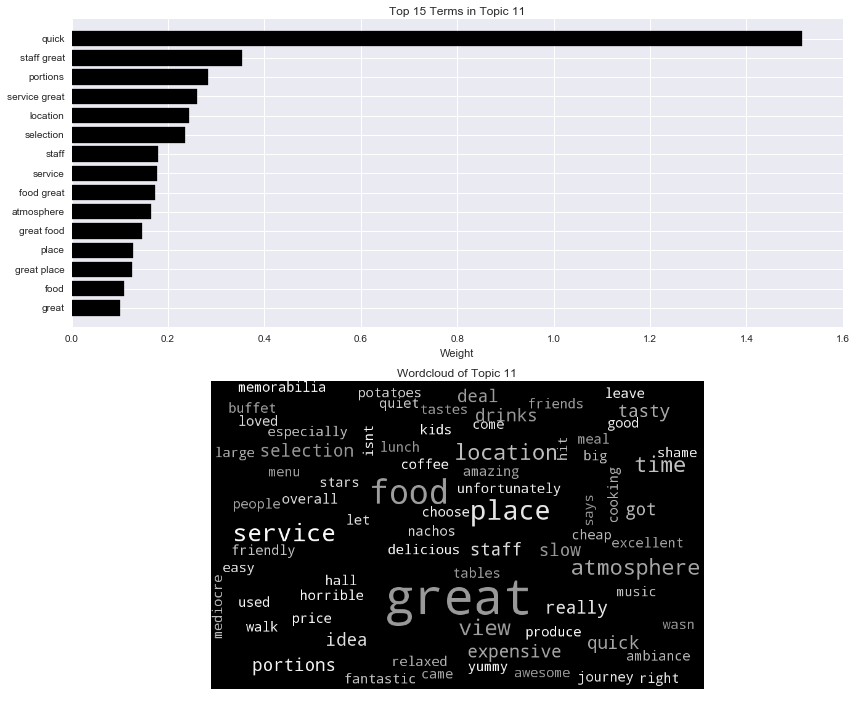


 Topic 12: 

table restaurant main did wine menu steak didn order meal came ordered waitress arrived starter dessert wasn dinner time bit service course asked went lovely waiter dish minutes small just served took wait experience delicious left starters courses got tasty felt night cooked cheese stars dining seated main course glass fine try food wanted finally mains ask busy tables decided friend sauce little think bread bottle thought chocolate said waiting having quite enjoyed plate duck rare water waited long told later looked staff lamb salmon dishes salad visit pudding weren given pork brought group booked overall potato pm voucher cream ice


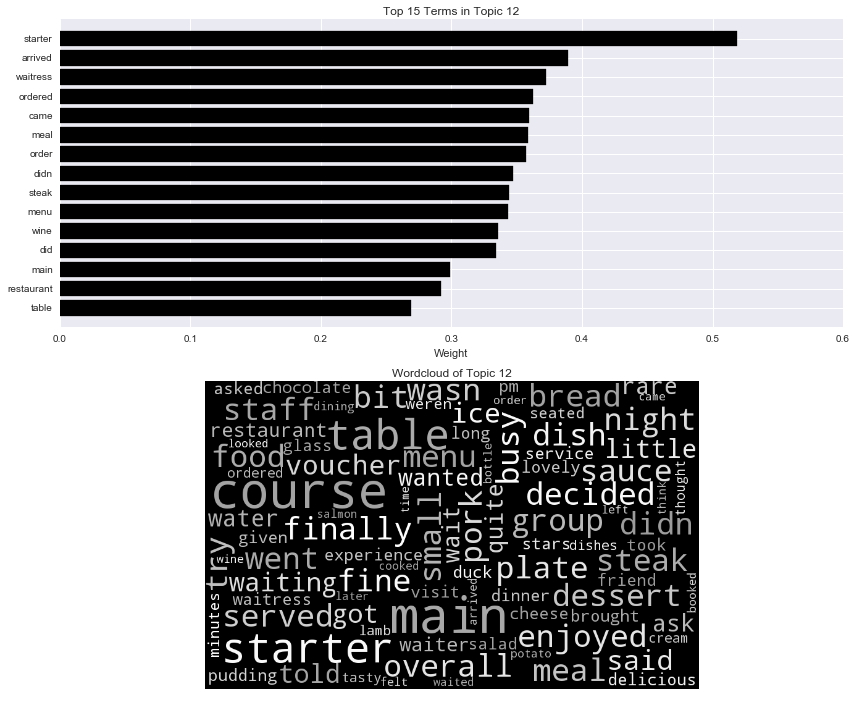


 Topic 13: 

sushi japanese yo sashimi rolls tuna bonsai tempura maki miso edinburgh dishes yo sushi hot belt conveyor conveyor belt tofu miso soup roll teriyaki small salmon gyoza crab time lunch raw japanese food served bento sushi bars places fish nigiri pop fresh pieces eat chef try menu floor expensive different yes bit certainly did experience ramen harvey tang japanese restaurant dragon edamame raw fish chain london broughton little didn limited ve shrimp street interesting squid bars broughton street rice restaurants best tasty tried say love california cold cuisine come wasabi isn eel average sister things options specials food price restaurant better enjoy food said service bento box heavy order set probably


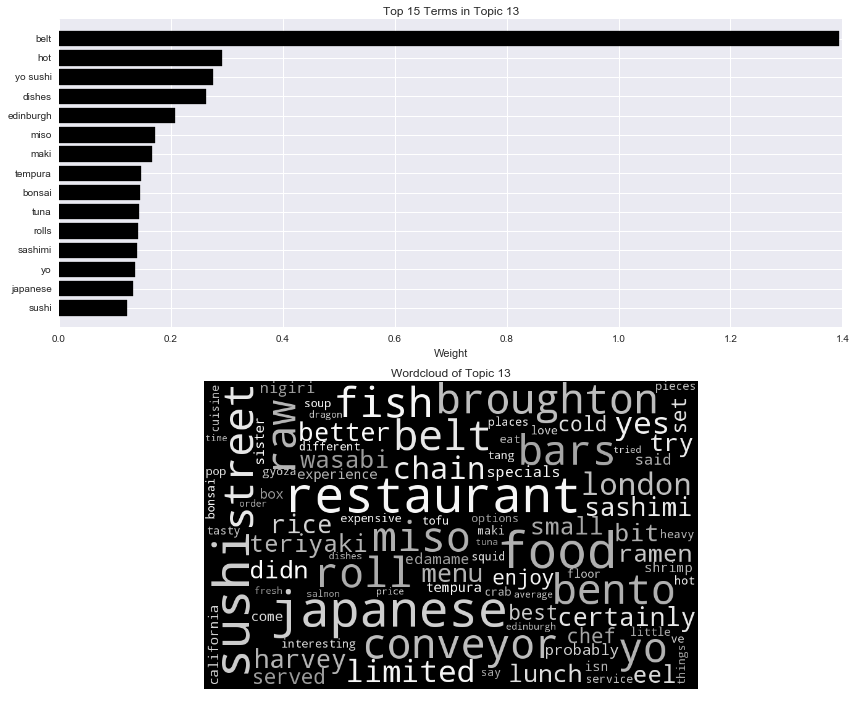


 Topic 14: 

chinese restaurant takeaway chinese restaurant dishes chinese food chop chinese takeaway food restaurants menu buffet edinburgh duck fairly usual isn chinese restaurants different area standard chop chop quality karen cantonese best chinese beef dim sum jimmy dragon dumplings quite cuisine best dim sour takeaways large authentic better chinese street sum way prices happy hour eat korean local wong like chinese happy prawn crackers meal tasty lemon dining crackers does ve delivery better offer certainly restaurant edinburgh particularly ribs cheap average away crispy chinese dishes pork bean expect home eating standard chinese years traditional dish noodle chow mein black bean mein lot china chow range local chinese noodles offers city dinner meat prawn including bean sauce quick jimmy chungs chungs


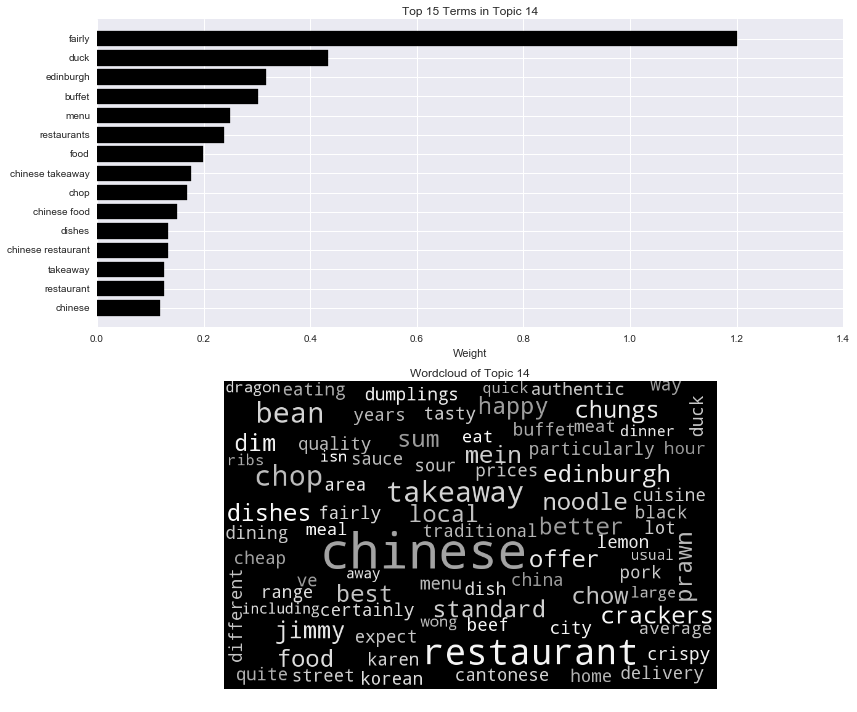


 Topic 15: 

burrito mexican mexican food beans cream burritos salsa tacos sour cream guacamole sour rice hot tex tex mex mex chicken cheese meat carnitas extra sauce like food nachos wings pork beans rice tortilla eat got decent hot sauce illegal bland pinto margaritas taste steak cardos los cardos mexico ordered los spicy ok beef illegal jacks flavour want bite jacks better ice used filled quick bite refried refried beans tasty away wasn veggie dry chocolate bit taco order think tortilla chips quick ice cream add really corn haggis flavor just mexican restaurants size chips try chipotle viva bite eat enchiladas line wanted mole chips salsa mexican restaurant uk carnitas burrito say small chili sweet fajitas wrap big


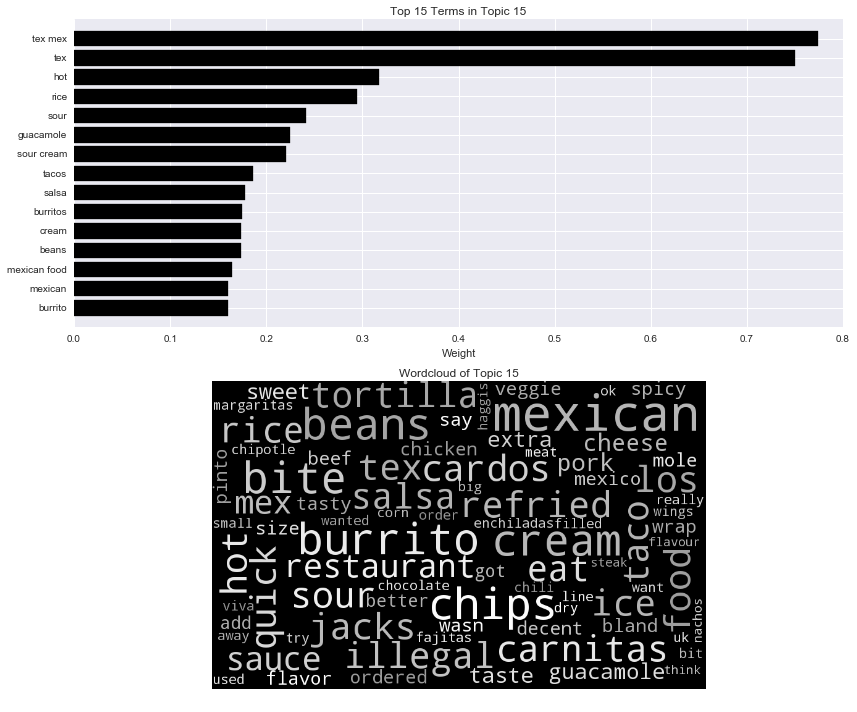


 Topic 16: 

pizza italian pizza express express pasta pizzas toppings branch italian restaurant good pizza night area cheese base quite mamma pizza pasta usually better pretty time bella italy favorita italian food free review connection decent quick cheap delivery bread calzone pizza don la la favorita usual grassmarket olives choose italia salad late dough crust stockbridge restaurant slice visit eat bella italia slightly offer eating takeaway grease home particular zizzi pasta dishes does chain offers garlic pepperoni went expect mile fresh seafood late night particular branch definitely friendly buy bases gluten free topping tasty pepperoni pizza best ve edinburgh delicious gluten variety ordered non style onions walk good busy tiramisu pizza tasty pasta pizza fast leith kebab


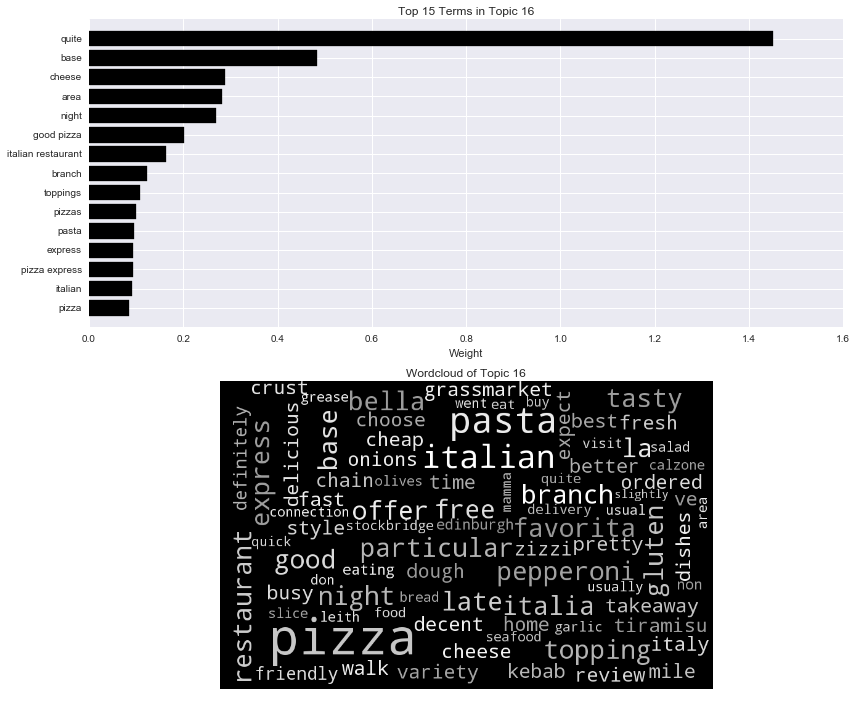


 Topic 17: 

und die der das nicht es ist mit sehr den man war sich ich ein sind gibt wird auch auf leider hier zum gibt es einen gut aber allerdings als des aus im witchery ok mcdonald hat ca pie personal standard um calzone international grassmarket mash sausages hotel buffet grass expensive warmer je edinburgh market los en ale form castle restaurant original smoothies et haggis fast basis mein espresso aroma met cappuccino cafs chicken edinburgh castle bad sainsbury portion extra old man view problem old gets princes street bookings pudding princes earthy place pubs service slow express superb bagels les stars food style salad vegetarian sandwiches


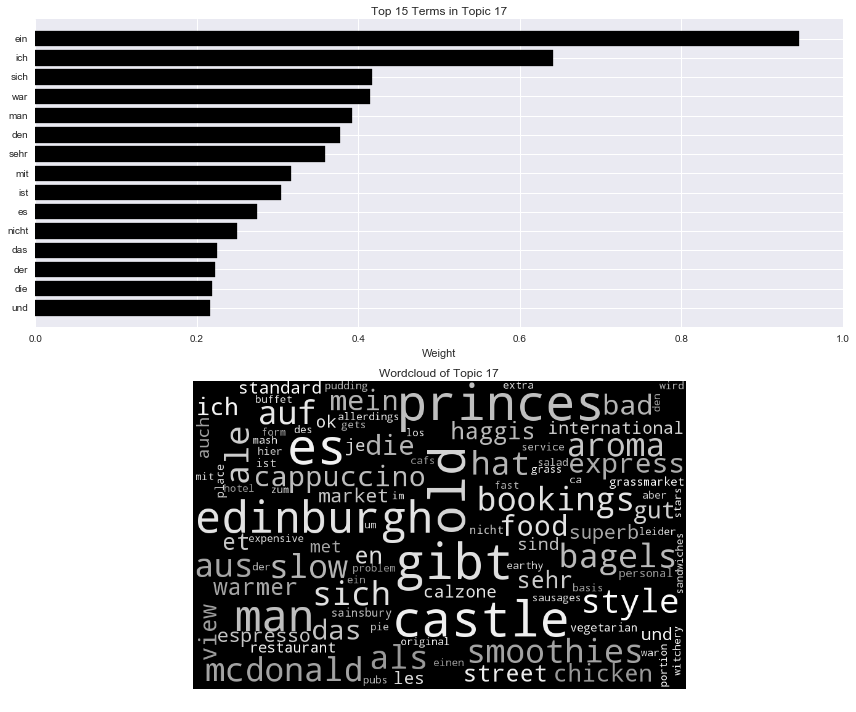


 Topic 18: 

nice little friendly staff really nice place atmosphere really nice staff friendly quite quite nice tapas staff nice nice little bit decor food nice nice food nice atmosphere selection italian inside wine decor nice little bit expensive spanish lovely touch food feeling like went vegetarian friendly staff impressed wasn place nice little place red menu bland large simple place love different modern lot wee dry nice friendly cosy sweet flavours didn nice touch just feel location warm staff really outside scones chilli okay nice staff looked add spot cute little pizzas interior girl come unfortunately tart list voucher pleasant ambiance chairs nicely cocktails cute nice meal cozy thought taste service nice pastry reasonable nice selection turkish dont salad missing liked needs salads


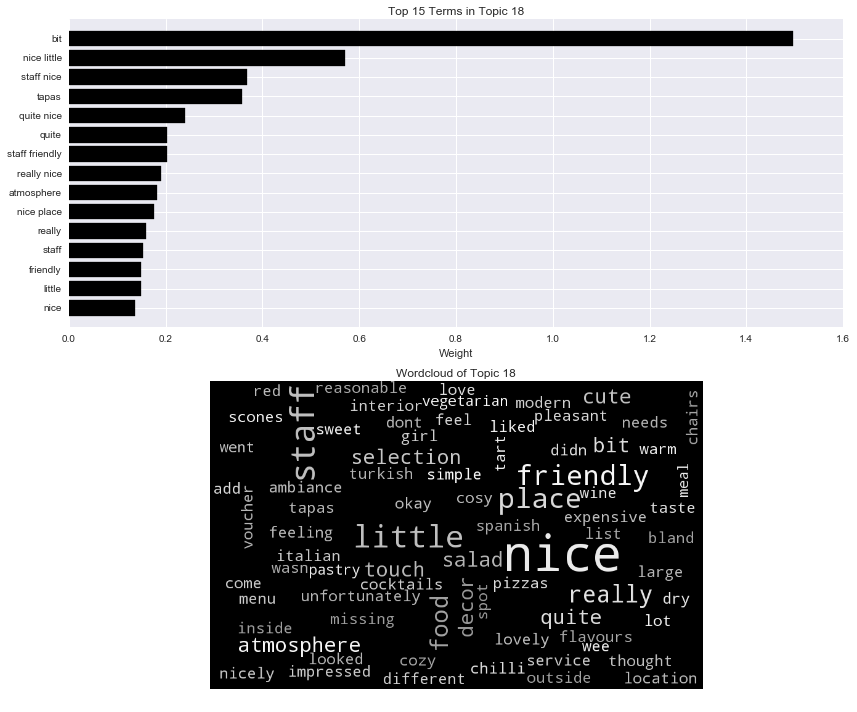


 Topic 19: 

breakfast eggs bacon toast pancakes brunch egg scrambled scrambled eggs syrup morning haggis french toast roll salmon maple syrup maple got sausage french black pudding scottish items beans menu scottish breakfast pudding sausages black options porridge veggie bacon eggs american rolls spot fried good breakfast brunch benedict hotel delicious special english smoked cooked time lovely plate smoked salmon eggs benedict salami gf best cooked breakfast disappointed like hot traditional double bacon maple day breakfast day opted pleasant salad going diner breakfasts just breakfast lunch benny orange came bagel granola squeezed bread yelp definitely fry enjoyed poached hangover panini free didn stopped having mozzarella slightly hollandaise eggs benny expecting salads crispy love wasn wait waitress friendly


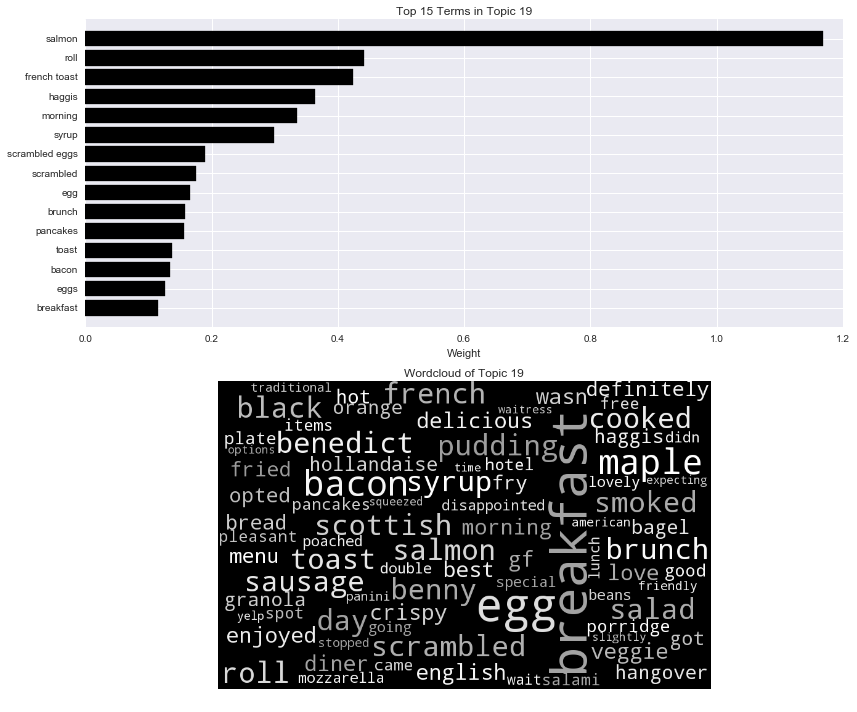


 Topic 20: 

cafe harry potter potter harry elephant tourist elephant house mile royal house royal mile edinburgh castle outside cafes rowling tourists little forest inside turkish prices little cafe day place grande cakes area people hot cafe grande potter fan jk forest cafe quite pretty fan wrote view feel spoon bad sit sure jk rowling sign way greasy beautiful busy food elephants serves pie road just far doesn cafe just queues situated bright crowds street writing make away views small customers toilets french open cake space greasy spoon covered spot tables different gavin view castle relaxed isn tourist trap views castle tad tasty apple lovely nicholson room trap seat owner serve average snacks graffiti coffees


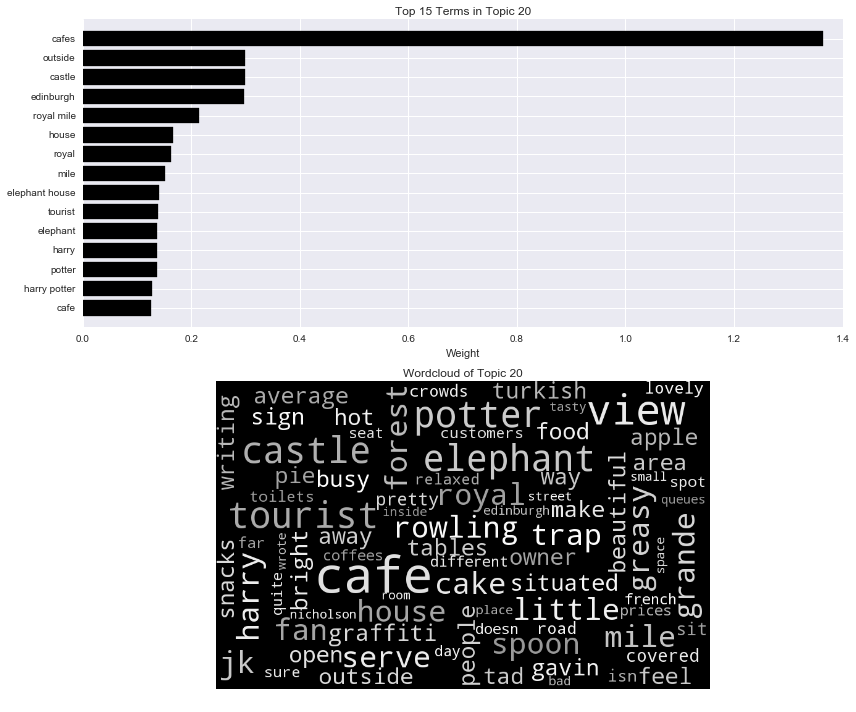

In [21]:
TopTermsByTopic(nmfmodel_3, features_3, 100)


 Topic 1: 

like ve place just time don bit think know food people love ll feel got say thing want going way things come times try pretty quite order make eat away day lot actually edinburgh best didn fact better need did big right places kind long little having different stars feel like probably felt review isn sure yes makes getting table doesn home bad don know let look friends amazing far eating mean space happy remember work reason looking wouldn mind ok hard heard friend new feeling meat tried definitely years coming looks experience does open night wrong minutes room past usually old


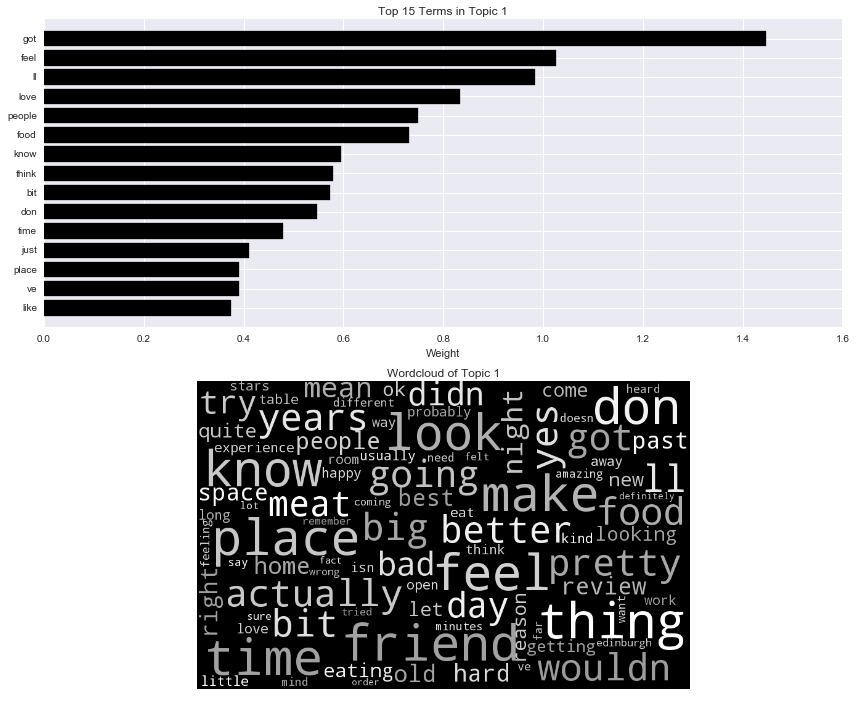


 Topic 2: 

bar pub drinks beer beers drink cocktails night selection cocktail area music bars old atmosphere pint pubs staff seating ales nice edinburgh cool tap bar staff tables real good range vodka friendly local ale leith drinking quite live menu busy burgers feel room comfy new traditional crowd cosy street modern quiz friends live music craft pub food evening decent decor offer monkey large brass big bar area relaxed whisky fun inside outside brass monkey student brewdog awesome booths vibe comfortable trendy people spirits rooms definitely chairs dark priced sit scottish just place dog work try town style seat venue looking looks royal traditional pub wee list


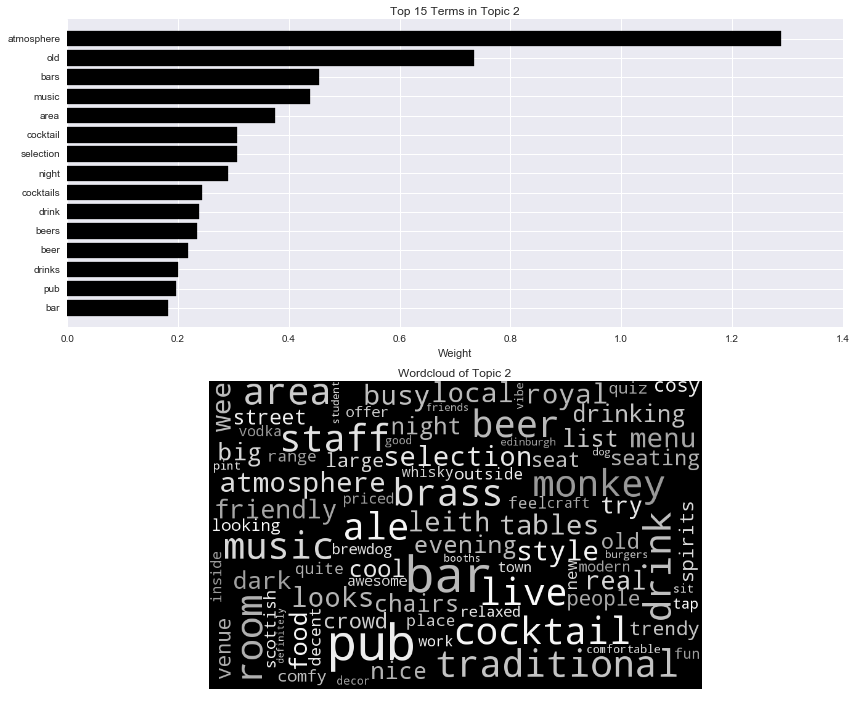


 Topic 3: 

pizza italian pizzas pasta toppings pizza express express delivery crust la favorita ham la favorita hut pizza hut mamma base chain dough cheese parma parma ham free gluten pizza good pizza place branch papa papa john good pizza domino gluten free family quick pepperoni pizza pasta john salad italian restaurant mozzarella italian food bases fresh pizza toppings good rocket spicy delicious vittoria pizza pizza available like pizza takeaway tomato pizza edinburgh got peppers home nom online night ingredients crust pizza fried pizza better oil pizza paradise want carbonara time pasta dishes just pizzeria half restaurant drunk happy authentic italian italy discount offer slice greasy garlic taste order eat ordered walk pizza amazing calzone slices best pizza delicious italian pasta pizza leith definitely olives pastas prices


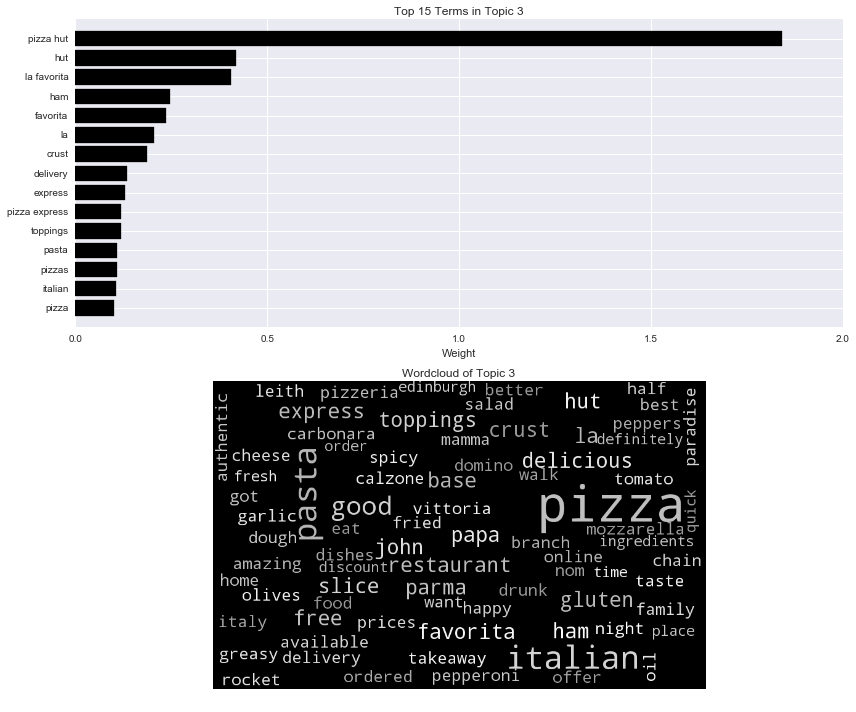


 Topic 4: 

chicken sauce chinese rice spicy pork fried wings beef tasty noodles dish mexican ordered burrito meat sweet takeaway delicious sour chilli hot prawn spring spring rolls fried rice came order chicken wings taste salsa rolls crispy fresh filling chili tender definitely ribs noodle bowl sweet sour tacos just sauces vietnamese beans pretty wrap portion pho bean shredded delivery ramen nachos curry chinese food bbq guacamole little nom cooked dishes away yum small pulled lamb mexican food soft carnitas plate flavour spice deep portions didn got oh malaysian crackers chop tortilla thought salt sour cream roast went starter yes prawns veg piri nando apple good dumplings corn coconut


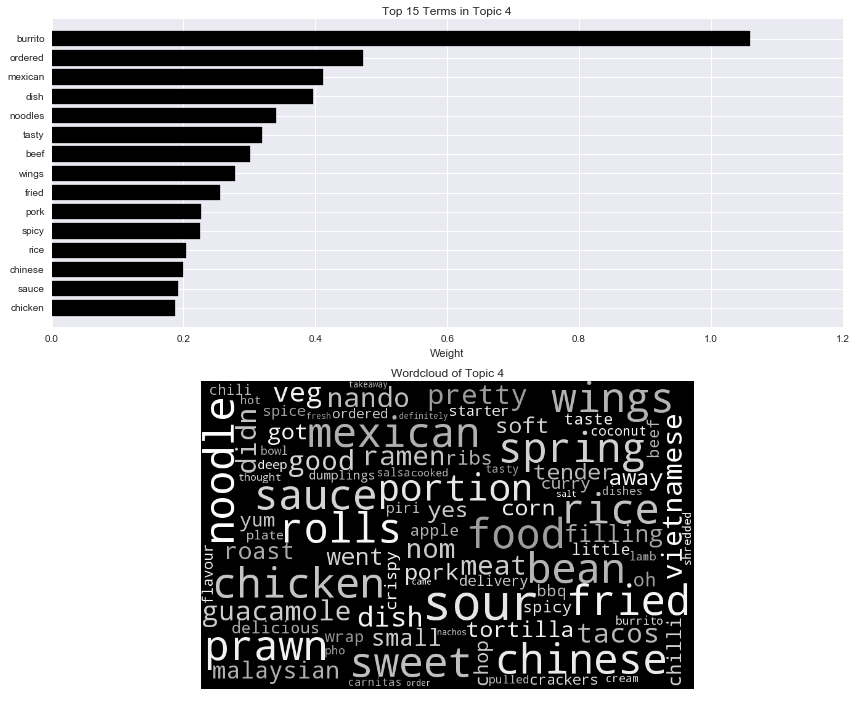


 Topic 5: 

burger burgers fries cheese bun chips beef beer holyrood bacon fast toppings fast food gourmet good burger american patty beef burger veggie sweet potato cheese burger delicious potato wannaburger good sweet beers best menu cheeseburger tasty gourmet burger quality better chicken burger milkshakes options burger fries came joint haggis burger joint relish burger king great burger wasn definitely potato fries got best burger blue bbq meat love southern option blue cheese cut veggie burger cajun skinny juicy chicken big burgers great didn edinburgh recommend order food burger just point best burgers american style skinny fries onion milkshake hamburger free meal chilli regular burger really burger good sure places come red hand cut diner double burger place awesome shake style west glasgow great mcdonalds buns


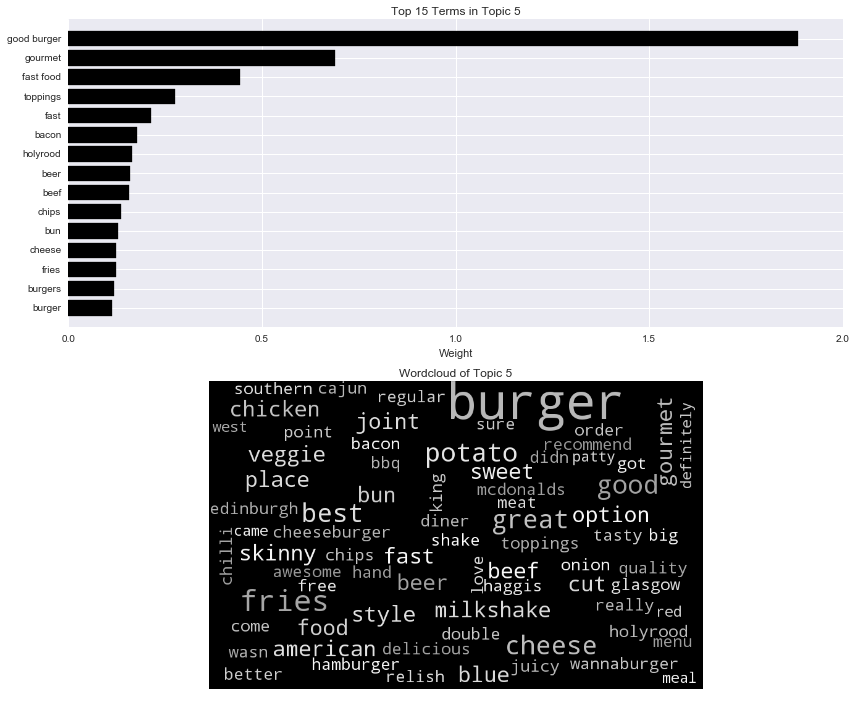


 Topic 6: 

lunch sandwich soup sandwiches salad deli fresh fillings quick bread shop baked tasty potato selection soups cheese baguette day range salads bite wrap lunch time baked potato eat area offer filling small cafe choice panini delicious potatoes rolls options counter wraps place want lunchtime roll quick bite time inside stop menu sit cheap today quick lunch ingredients meats prices cheeses quality healthy make street home usually wee lunch menu bite eat baguettes paninis shops friendly choose wide tomato decent baked potatoes offers variety snack grab value does busy looking potato shop sandwich shop huge just pick large pretty falafel sell good selection spot road toasted pop deal reasonable rocket affordable


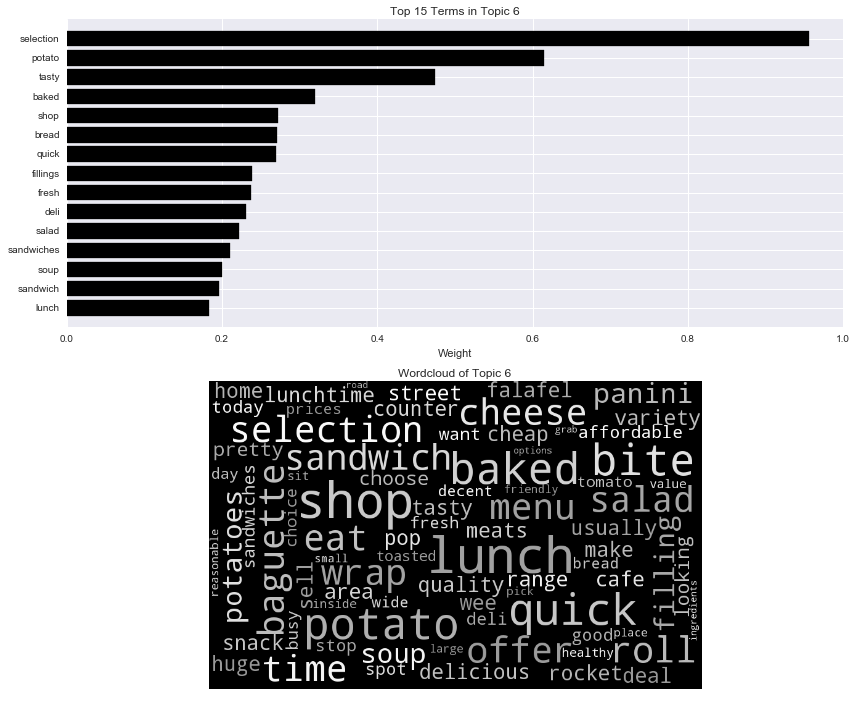


 Topic 7: 

thai curry pad pad thai thai food green curry spicy green coconut food soup prawns prawn red curry rice red thai restaurant thai curry thai basil duck spice tom thai restaurants thailand satay basil thai green dish meal best thai king main edinburgh good thai coconut milk dishes thai dishes friend box siam lunch restaurants chicken satay authentic thai menu dusit starter right just kha tom kha thai places noodles theatre chicken pad orchid curries ordered milk delicious phuket time curry chicken love thai chicken mosque want enjoyed thai meal nice thai meal friends best away stir time thai friends thai cuisine coconut rice deals just right lovely seafood chili sweet authentic curry delicious bangkok mouth traditional vegetable silver bowl share papaya wasn curry dishes ting thai ting online quick ginger


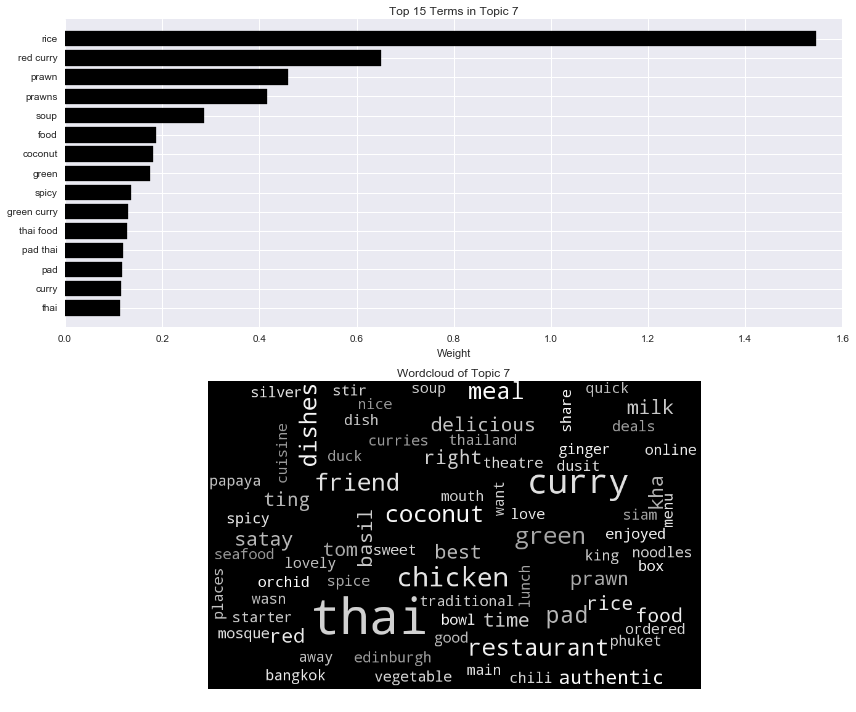


 Topic 8: 

und die das der war ist sehr mit auf es ich ein auch zu eine nicht fr aber gut dem hier von wir waren freundlich essen den da im gibt wirklich alles nach schon preise etwas man dann freundlich und personal kann mal sehr gut dass als des whisky einer sich vom aus hotel ganz karte einen noch en beim gutes nur edinburgh um hat whiskies que la mile royal mile royal mein echt tour restaurant fall et laden pub los haggis het een klein princess street super ne princess cola men hunger bon bad met station cafe potter harry potter harry para lo trs


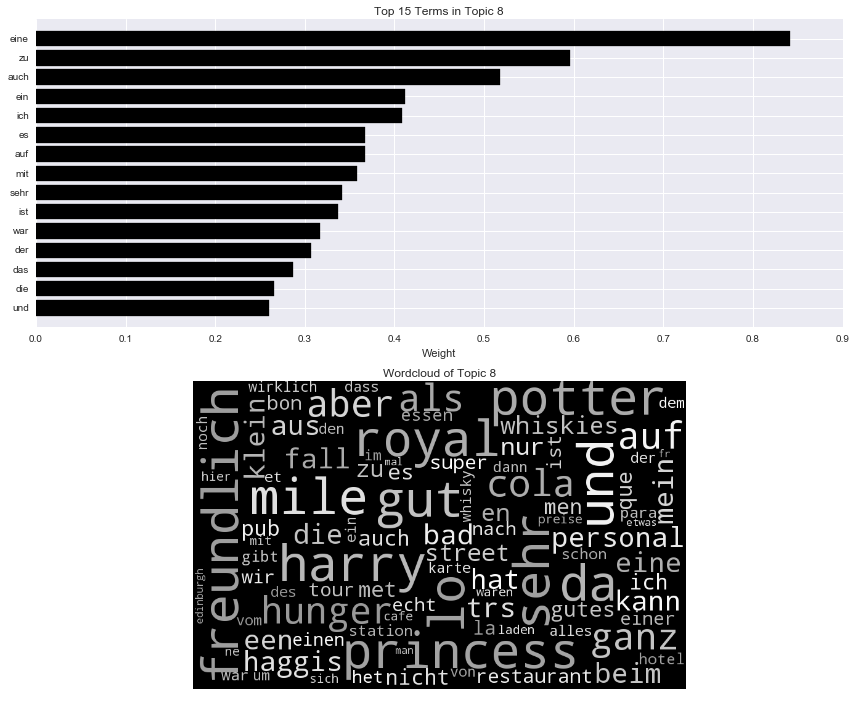


 Topic 9: 

fish chips fish chips chip chippy haddock chip shop fried battered batter supper shop haggis fish chip cooked greasy best pie excellent fish fresh fish fresh deep peas chippie deep fried traditional fish supper portion crispy seafood cod tasty excellent best fish sauce sausage special mushy shops edinburgh mushy peas chip shops dogs kebabs way crisp order seadogs good fish chips fish world vinegar eat haddock fish scottish fish bar sure mars great fish brown scotland steak pie good chips chippies chips best city sea steak salt late haddock chips home pub ordered fish delicious good soggy perfectly takeaway portions chips great fresh fish tasty fish cardboard place delicious fish fried fish easy place brown sauce ll locals inside suppers chips excellent kebab just fish good chips really franco gravy


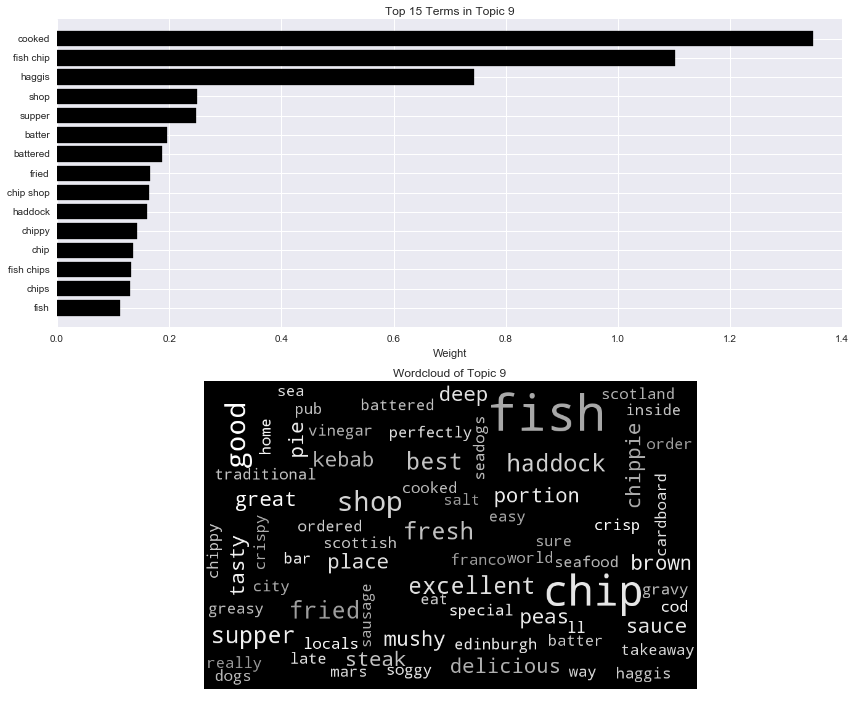


 Topic 10: 

really really good nice really nice really enjoyed good enjoyed food really really tasty really friendly really really staff really liked staff really like tasty quite really liked amazing place really lovely cool free really lovely service really bit lots didn said really cool really great lot place gluten meal think yummy super went menu really really delicious really quite really yummy gluten free helpful friendly wasn nice place friends atmosphere really really busy loved decor things good really brilliant restaurant really wait enjoy especially overall fancy love atmosphere delicious really night really normally price pricey really enjoy location actually really nice atmosphere cappuccino got going thought places came thing great really really cheap don really didn really time really really interesting town cake fair cheap surroundings discount tasting fault music cocktails quite nice options impressed big


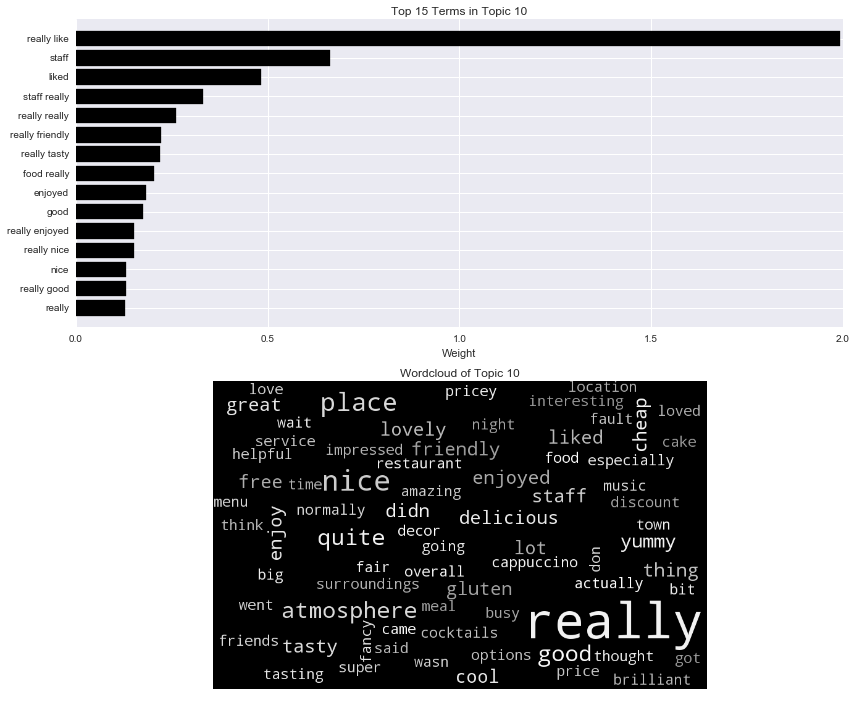


 Topic 11: 

great food food great great food great place place service great service atmosphere staff friendly service great location great selection great atmosphere place great selection fantastic great little great location edinburgh recommend great value friends great beer price people little prices quality friendly staff excellent amazing love highly staff great beer castle recommended beer great slow delicious worth decor great meal really great great staff meal wonderful lovely great price great quality definitely huge kids loved highly recommend enjoy reasonable value fun dinner food service great range priced great prices quick friendly service menu great great menu fresh pie fab great night portions great pub outside tasty food drinks little place music staff like fantastic food price great great experience eat busy great breakfast definitely recommend overall great edinburgh great makes best pricey stop love place grab time wait cheap


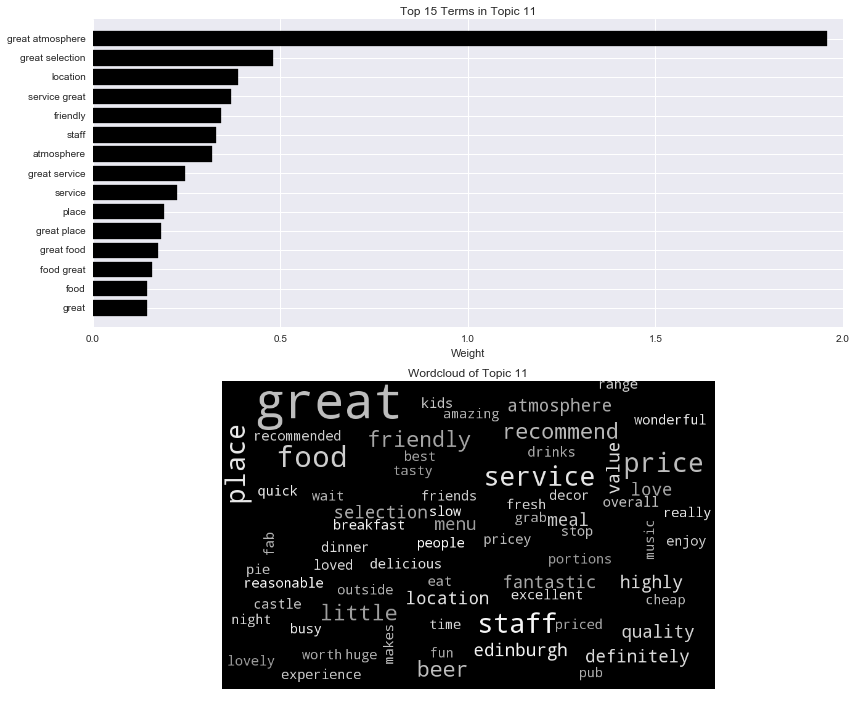


 Topic 12: 

visit overall said worth overall said little worth visit dishes place cafe recommend quality ll soon impressed lunchtime menu definitely excellent pay soup served definitely worth look forward pay visit high visit soon forward recommend pay smart look time new welcoming flavour particularly good offering value offers extremely little place range high quality visit overall edinburgh sample good quality town said impressed sampled evening return nicely recommend visit lovely places today say opened enjoyed visit happily pleased visited impressive heartily stylish little cafe heartily recommend enjoyed relaxed packed offer surroundings sure welcome good dishes bistro diners trip return visit style imagine say overall second visit quality dishes happy course feel simple deli served good favourite addition feeling said really things visiting serves place worth


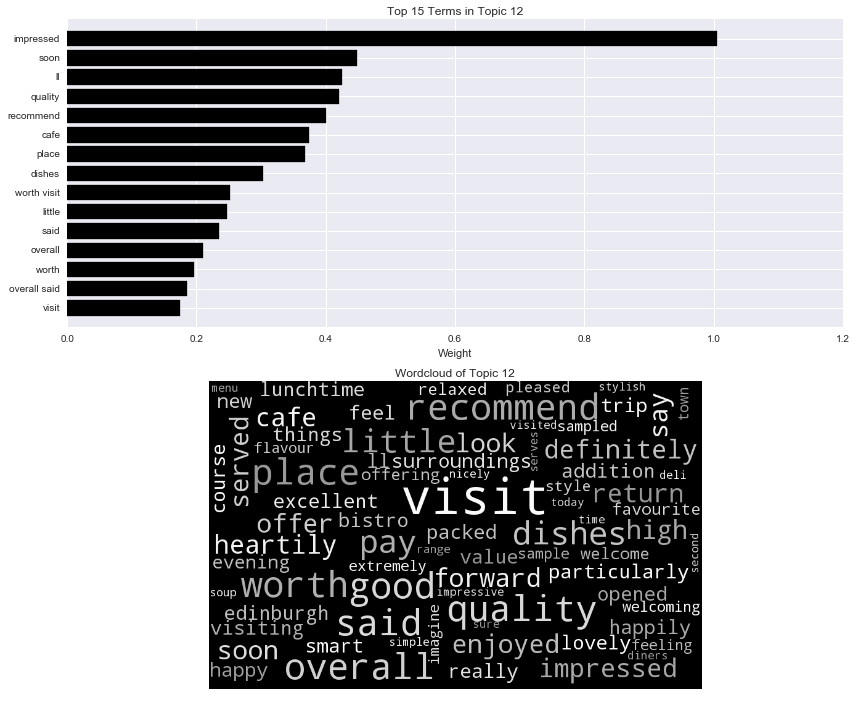


 Topic 13: 

wine steak dinner meal lovely menu table restaurant nice main dessert went came ordered course starter cooked glass delicious bit dish night bottle service did salad mussels cheese wasn sauce didn enjoyed bread courses mains waitress little arrived perfectly starters served dining list small time french plate salmon seafood perfect pudding evening portion quite just lunch definitely got start friend wine list duck waiter red attentive pork took tasty experience wanted beautiful chose pm booked started looked thought brought special main course group risotto having set white smoked opted lamb voucher taste scallops loved large decided meat try end seated date think


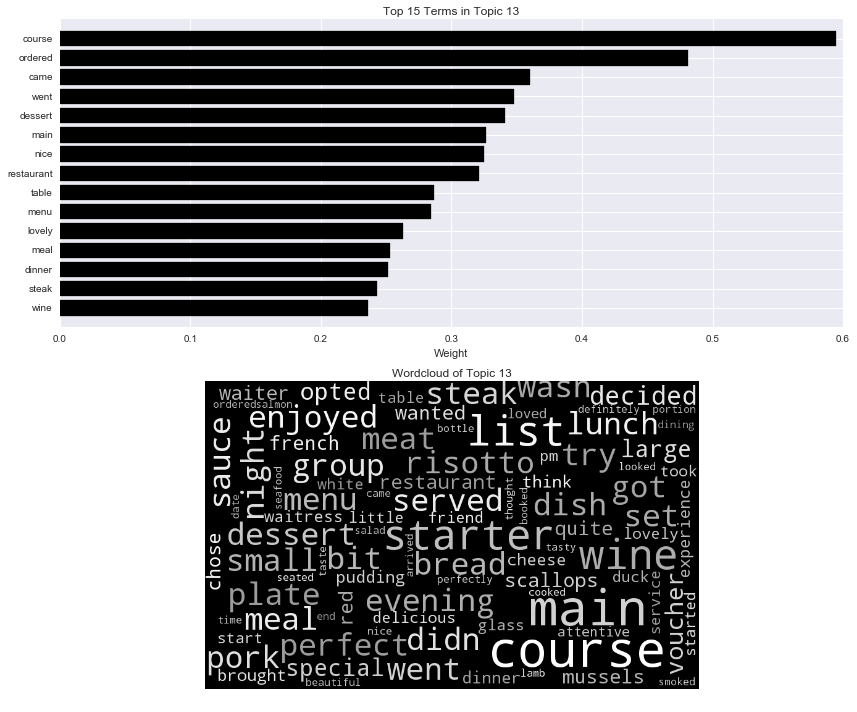


 Topic 14: 

breakfast eggs brunch toast bacon haggis benedict eggs benedict morning scottish scottish breakfast egg salmon scrambled pancakes poached veggie day juice spot roll breakfasts scrambled eggs menu black pudding place french toast fresh porridge place breakfast poached eggs breakfast lunch pudding black sausage smoked salmon royal sausages french options royal mile smoked mile syrup waffles breakfast brunch weekend breakfast menu orange edinburgh definitely beans fried spoon bagel looked great breakfast cooked delicious bear mushrooms friendly tasty wee rolls went maple maple syrup pm wifi fruit greasy free orange juice breakfast roll good breakfast eggs benny blue bear best benny breakfast good got try fine veggie haggis cooked breakfast cafe perfect greasy spoon plate traditional veggie breakfast came little granola big cute bread caf breakfast rolls


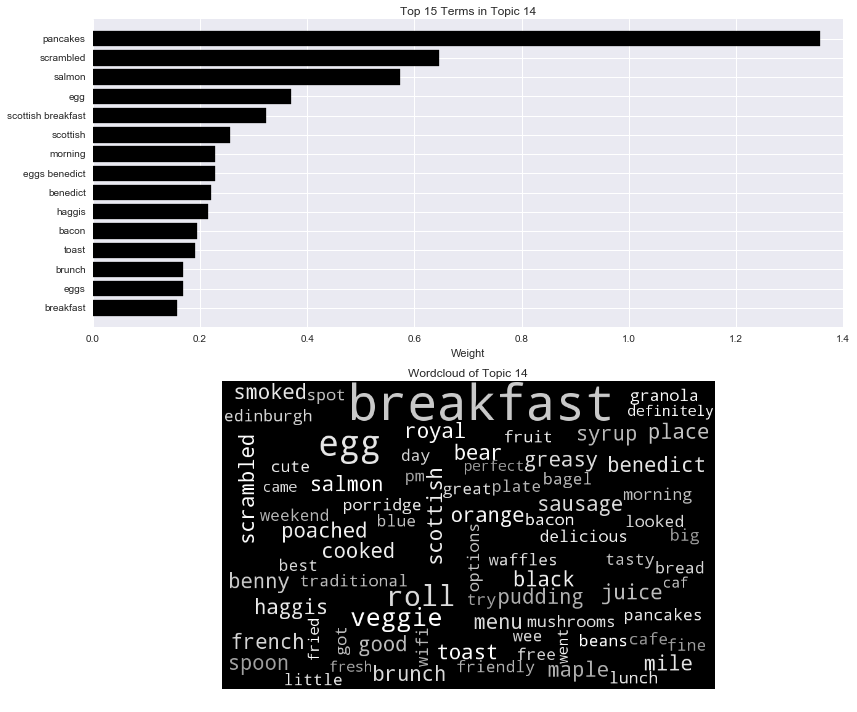


 Topic 15: 

coffee cafe cake cakes good coffee little shop lovely coffee shop flat flat white house nice friendly espresso white wifi staff sit place morning coffee house area good milk great coffee free pastries coffee good cup walk artisan perfect coffee great artisan roast seats starbucks grind outside come roast coffee cake open work inside stop latte quite coffee shops spot people away city seating friendly staff cute sandwiches little cafe small cappuccino grind house yard street addition peter leith just italian fi staff friendly window free wifi wi fi wi scone little coffee edinburgh day coffees location shops strong way leith walk caffeine peter yard yes food coffee watching kilimanjaro better coffee seat baristas costa bit delicious takeaway loudons town windows


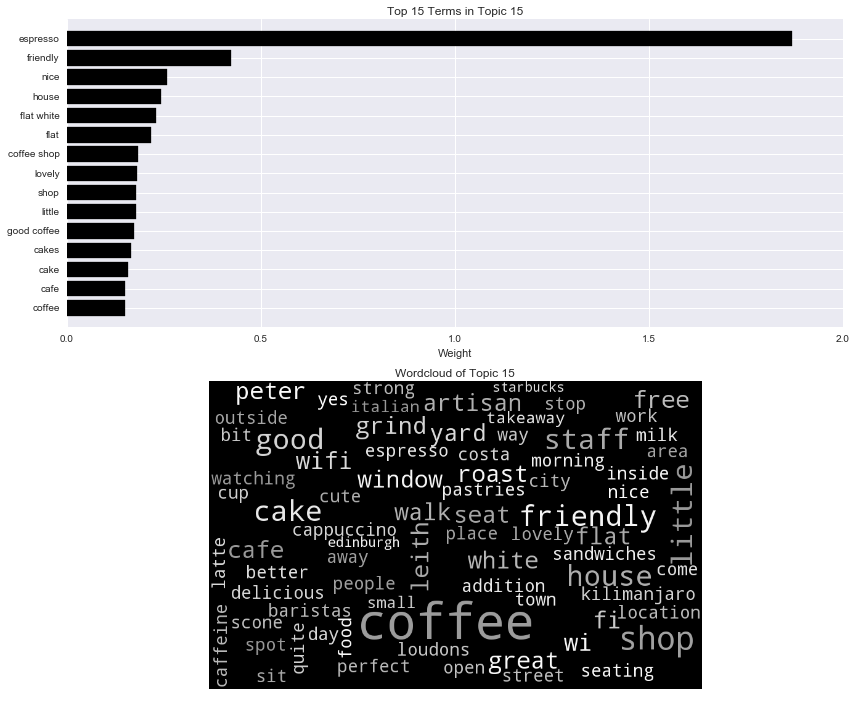


 Topic 16: 

chocolate cream ice ice cream hot hot chocolate cake chocolates dessert luca amazing chocolat hotel chocolat vanilla flavours cakes cafe sweet hotel store free dark just like friend chocolate cake marshmallows delicious got caramel black white brownie cocoa hot chocolates quite sugar strawberry shop try white chocolate milk gluten dark chocolate truffles vanilla ice gluten free went pudding choice different scoop chocolate sauce butter banana desserts best yummy wee jam gf looked sorbet tart right pistachio love luca ice creams sell ice creams counter taste whipped flavour offer definitely tried melted beach rich mash having latte coconut buy ve salted choose small warm salted caramel cheesecake teas person worth types choc end yard


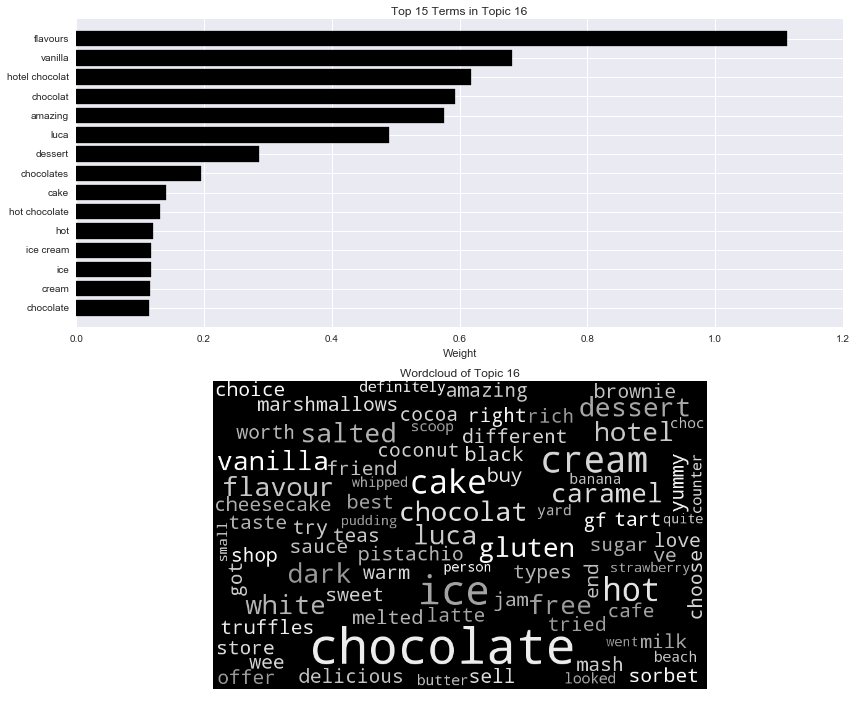


 Topic 17: 

good food service good food food good good service service good friendly pretty pretty good nice excellent value price good value staff prices friendly service quality place good place atmosphere reasonable fast good selection money value money good quality place good staff friendly decent good price good atmosphere selection mexican really good food service quite good times food friendly service friendly quality food local atmosphere good pricey quick overall come good good good range food excellent good staff friendly staff nice food ok cheap good choice stars staff good pleasant busy reasonable price mexican food location excellent service reasonable prices recommended efficient overall good deal good prices slow food nice portions service nice kids nice atmosphere beer food reasonable stopped choice happy bit service fast attentive food pretty drinks better good location spaghetti dinner offers expensive friendly efficient ambience helpful food quite good little tasty

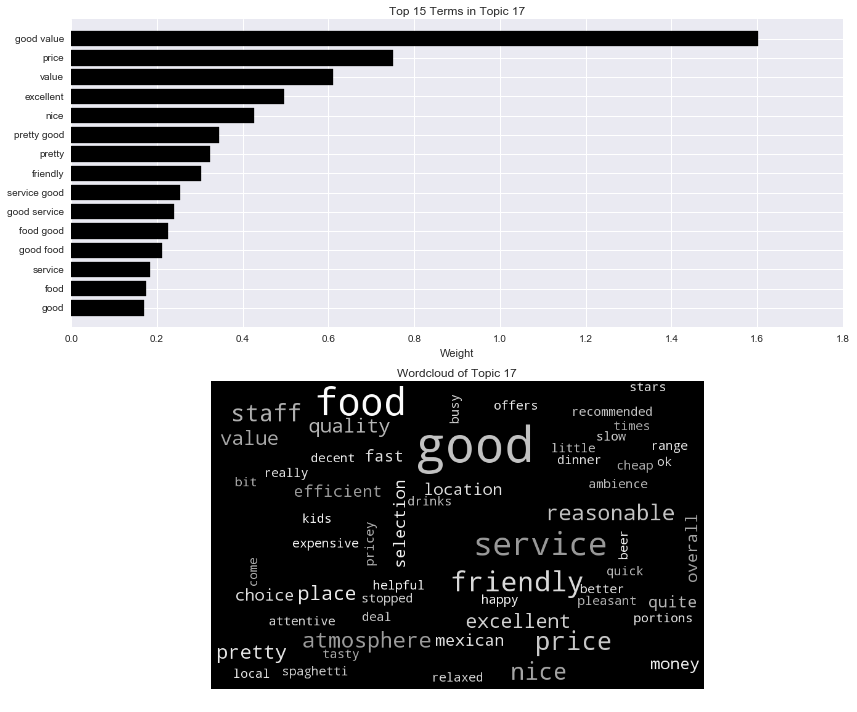


 Topic 18: 

indian restaurant dishes food curry menu indian food restaurants italian authentic naan meal vegetarian lamb indian restaurant rice different edinburgh quality tapas traditional cuisine delicious quite dish street portions main modern area prices range small dining family priced india tasty takeaway style decor friendly definitely pasta indian restaurants offer meals meat curries excellent tasted nan inside reasonable extensive offers staff clean south including certainly indian dishes quality food large away service best centre selection indian cuisine nepalese italian restaurant tikka restaurant food byob serve options plenty try authentic indian taste reasonably spices chinese choice recommend spice masala starters variety expect buffet reasonably priced ordered cost atmosphere tandoori mosque experience went


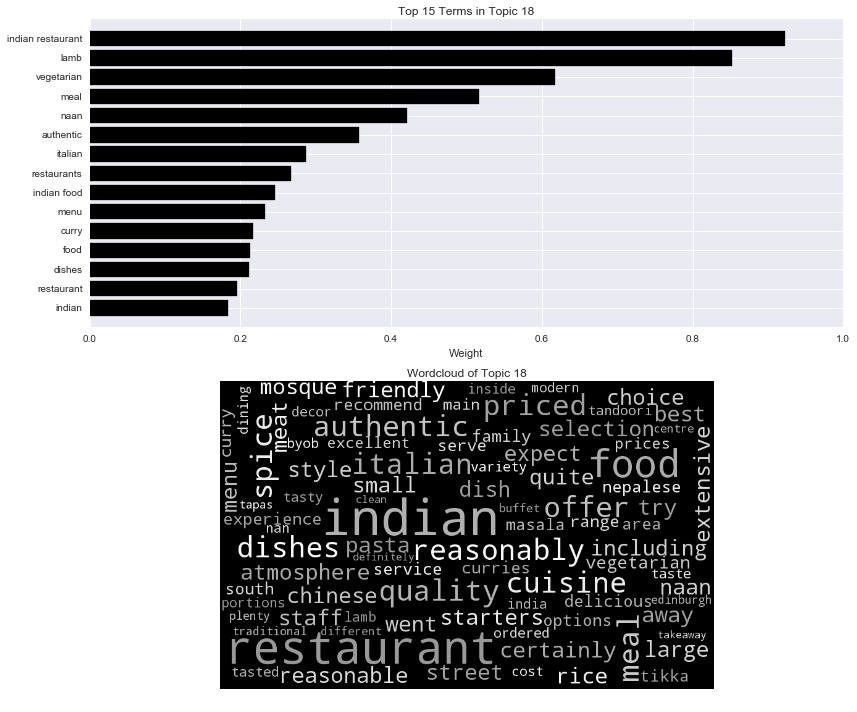


 Topic 19: 

tea teas cake afternoon afternoon tea cakes scones scone cup pot tea tree tree cafe tree tea sandwiches cup tea lovely chai earl pot tea nice earl grey eteaket grey little fruit free room slice cuppa jam milk tea milk just gluten free pots loose gluten table warm green tea shop bit tea scone delicious tea coffee sweet staff latte croissant piece offer clotted cream clotted leaves day tables try breakfast tea atmosphere tea tea rooibos pastries selection choose iced tea pots choice carrot opted large cream tea cream drink green tea came friend chai tea make oolong cute bags chairs carrot cake apple home served caf snacks iced tea super couldn good tea different bubble big space sat house fresh


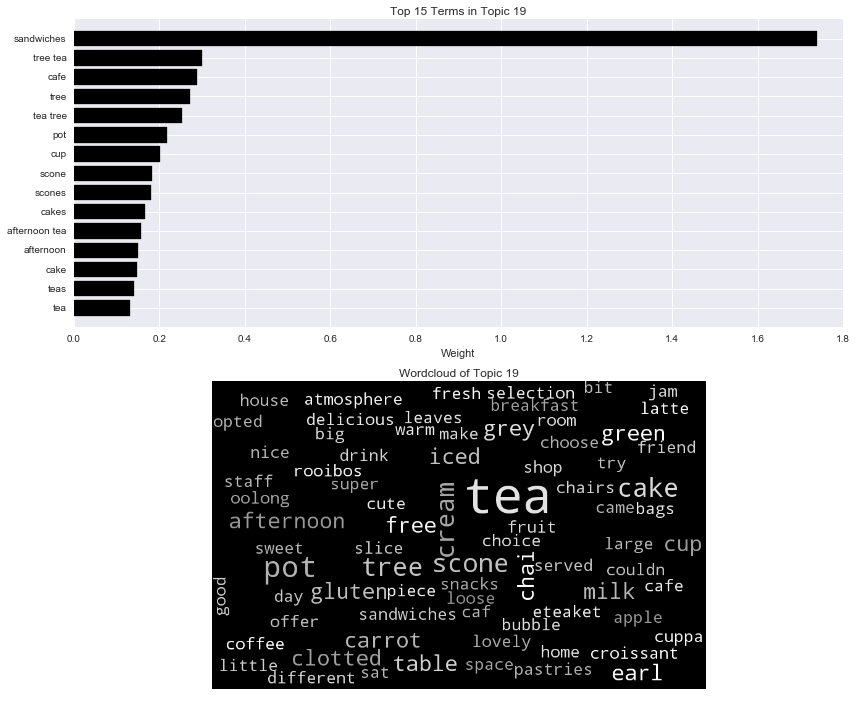


 Topic 20: 

sushi miso japanese sashimi miso soup tuna edinburgh roll maki tempura rolls soup bento best nigiri japanese food bonsai ramen salmon yo japan places best sushi box kanpai order sushi places chef yo sushi hay bento box california experience restaurant little fish seaweed sushi edinburgh say spicy tuna wasabi dragon sushi experience dishes rice edinburgh sushi fresh try set sushi restaurants good sushi sushi place better aubergine restaurants town belt value definitely sushi restaurant green tea taste sake gyoza reviews edamame tried sushi bar raw fish uk rainbow eggplant sushi chef tang far eel raw spicy price japanese restaurant sushi sashimi conveyor way tasty sushi things platter bentoya love sushi seaweed salad going just ve soy salad green avocado thing good teriyaki time


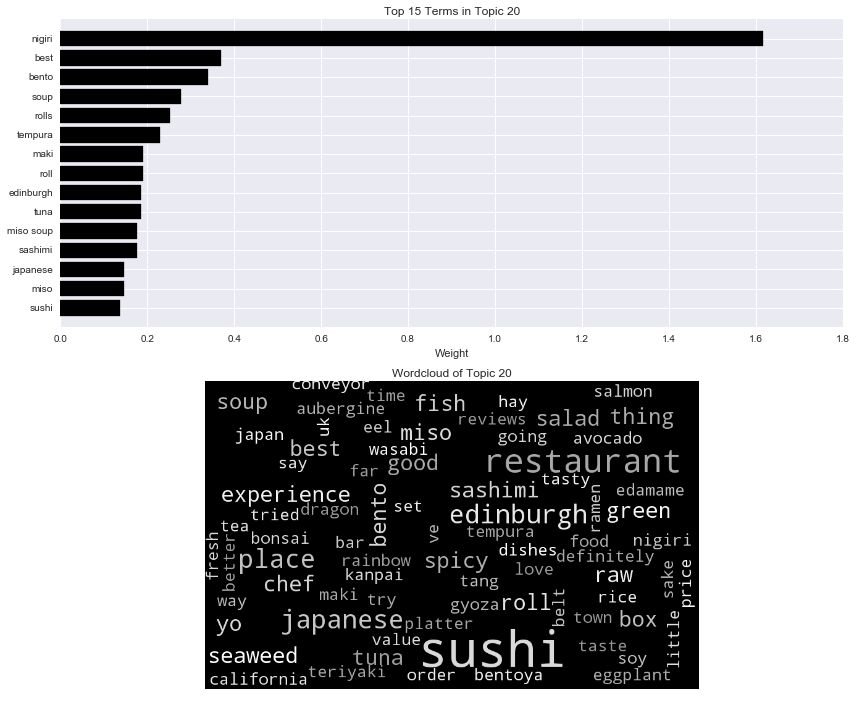

In [22]:
TopTermsByTopic(nmfmodel_4, features_4, 100)


 Topic 1: 

place like love just really don eat make know want time good feel ll love place little come people bit going food think say try thing sure way things places home ve nice pretty said kind lot right times awesome definitely need look got big feel like mexican oh yes quite burrito eating friend menu makes friends long ok let didn actually cool doesn cheap tasty review really good day great place looking having new drink did night went different small reviews getting enjoy man place really type walk super sit away stars huge ask feeling thought tell love love idea ones order place eat work isn


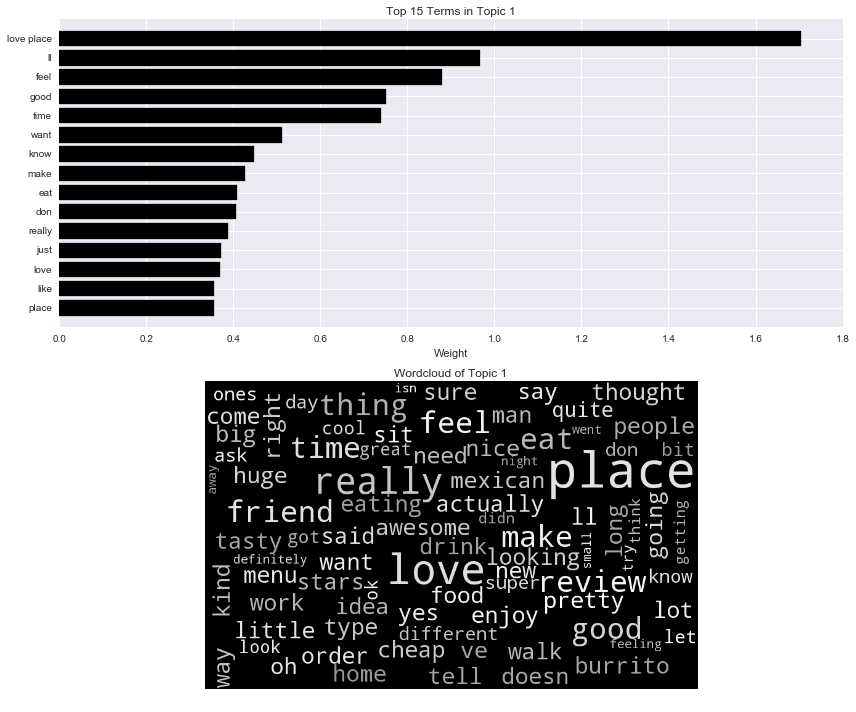


 Topic 2: 

great great food food great service food great service service great great place atmosphere fantastic place great atmosphere great value staff great place great lovely great selection lunch value great staff selection definitely meal great time fun atmosphere great drinks salmon great price awesome food service sausages haggis really great meal great lunch loved service lovely disappointed great meal fun great nice atmosphere eat mussels great experience seafood beers cosy quick price great great spot great little music restaurant great whiskey specials beer definitely recommended setting marks come great time quick service music great great pub burgers great good great restaurant advise cafe ended having menu great oysters restaurant quite veg fast great night delicious great eat great value great night reserve finish disappoint great spot bartender friends great variety environment great location wow service fantastic great flavour great coffee fantastic food mix great c

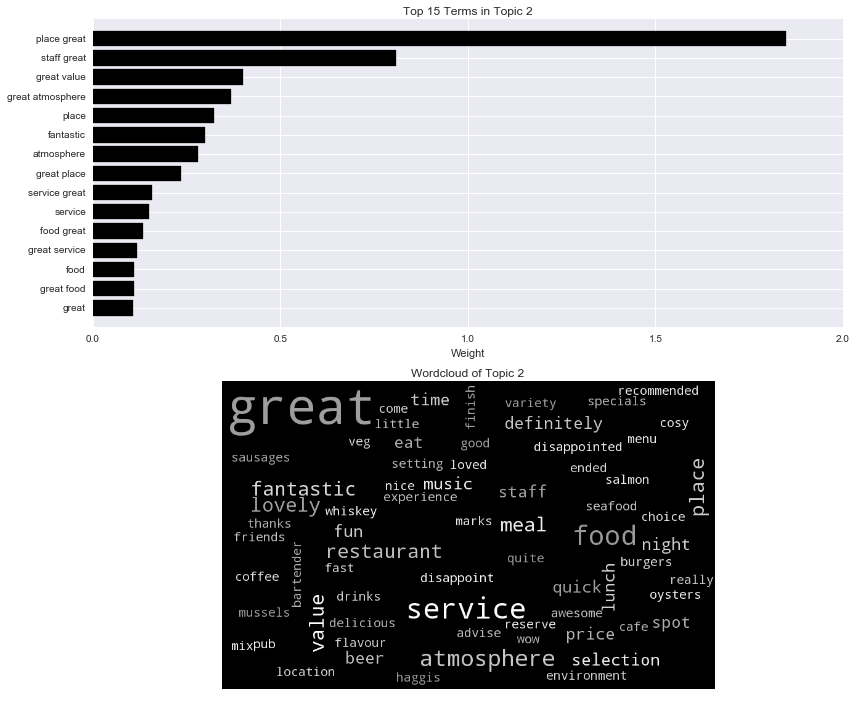


 Topic 3: 

fish chips fish chips haddock pie best fish crispy chippy tailend fried best supper batter bene chips ve worth peas steak haggis good chip ordered scotland getting perfectly suppers past battered fry bite tacos portion fish supper chip shop sauce fish fresh deep host fresh don vinegar good fish fantastic mushy uk mushy peas different sizes el fish suppers soft defiantly cooked fish fish haddock chips man nice chips good deep fried best chips place time time ordered favorite salad edinburgh place smoked better brown piping piping hot rings mars onion rings delicious fish clean cod soft inside wait going crisp perfectly cooked hot brown sauce steak pie hake mash flaky golden frying curry seafood pub order fried fish home quality beef shop hot fresh light


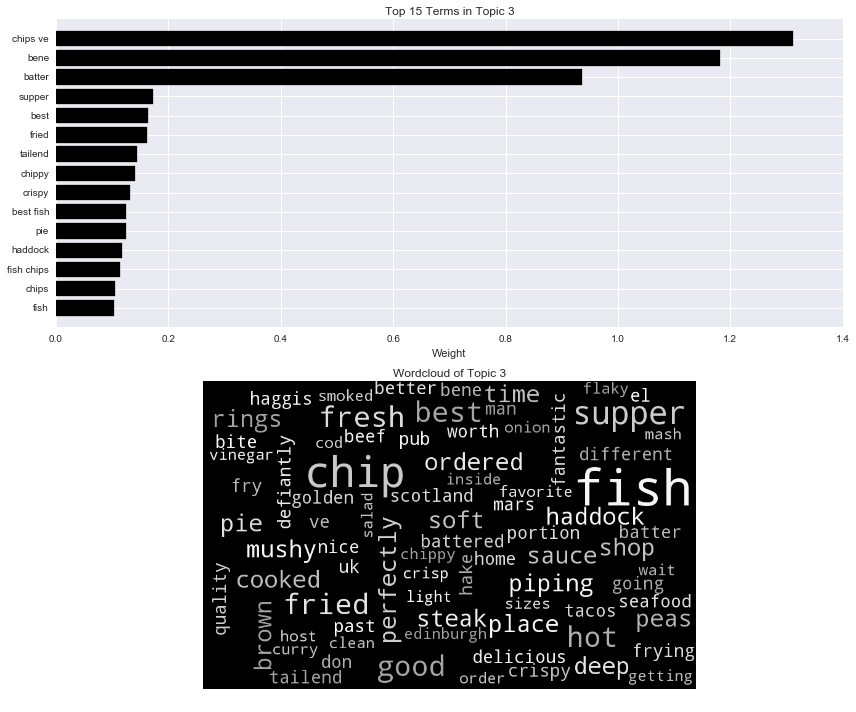


 Topic 4: 

breakfast coffee eggs brunch toast cafe bacon morning scottish breakfast bear scottish day flat benedict french eggs benedict french toast blue bear egg scrambled flat white blue sausage big syrup edinburgh coffee shop spot good coffee good wifi delicious great breakfast beans scone coffee good cappuccino breakfast coffee white black poached perfect great fruit maple syrup porridge black pudding maple scrambled eggs breakfasts breakfast lunch roll caf big bear eggs toast start day ordered veggie cakes pastries day breakfast kilimanjaro artisan smoked salmon wonderful rolls latte coffee shops busy veggie breakfast breakfast morning space smoothie town gem shops snax deli delicious coffee visit awesome tables fresh great coffee pudding smoked food coffee juice decor stay work potato scone cup art bread coffee excellent fabulous waffles greasy place breakfast


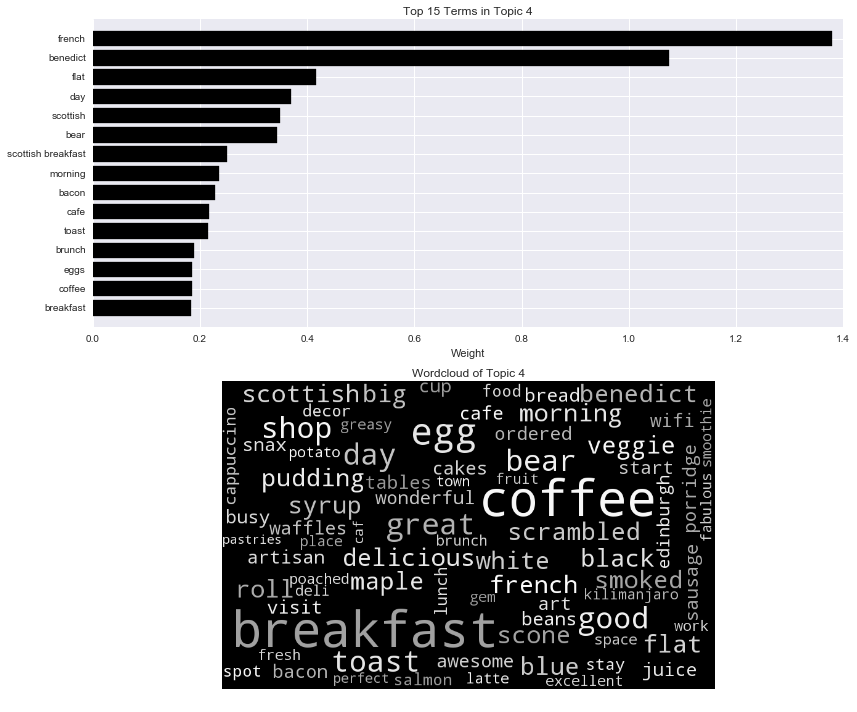


 Topic 5: 

pizza italian pizzas pasta favorita toppings la italian food la favorita order fresh best pizza pepperoni cheese italian restaurant dough just italy base delivery pizza edinburgh crust authentic italian half vittoria sauce favourite favourite pizza amazing better edinburgh authentic night chicken garlic ordered olives ham pizza hut pizza pasta branch late hut tiramisu reviews don fast pizza place order pizza fantastic best italian chicken pakora crispy mozzarella bit time delicious want makes large basil oil friends mushroom family home homemade know italian restaurants tomatoes really good italian olive oil red pakora kebabs quick fired parmesan spaghetti away free pastas pizza amazing tomato peppers haven delivery service mushrooms chains ate restaurant ingredients went fact big good quality opinion bottle red


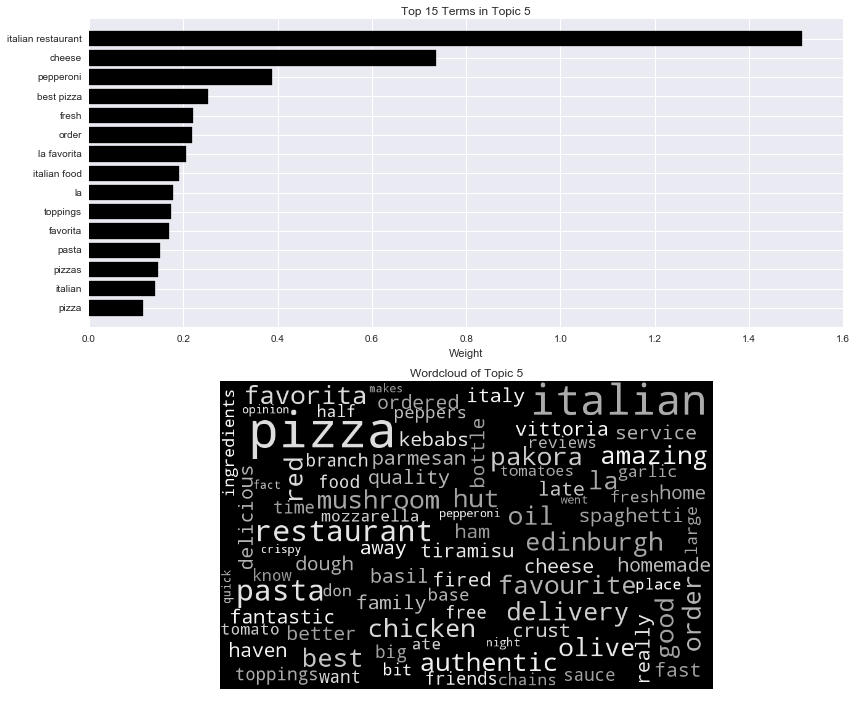


 Topic 6: 

indian curry chicken indian food naan rice spicy dishes food curries lamb best indian takeaway tikka authentic delicious dosa dish masala order india nan noor ordered sauce indian restaurants chilli authentic indian portions chicken tikka korma food edinburgh spice tasty food ve kitchen indian restaurant delivery mango garlic mosque away hot south naan bread tandoori kismot spices lassi meal cuisine south indian sweet coconut kebab butter chicken flavour nepalese cheap tapas try ve indian takeaway paneer kebabs cooked variety tikka masala vegetable large style mosque kitchen menu different range rogan pakora chinese tender mother india takeaways tried restaurants fried definitely garlic naan huge meat bit samosas mango lassi portion tasted went rice naan rogan josh josh traditional chicken curry indian cuisine


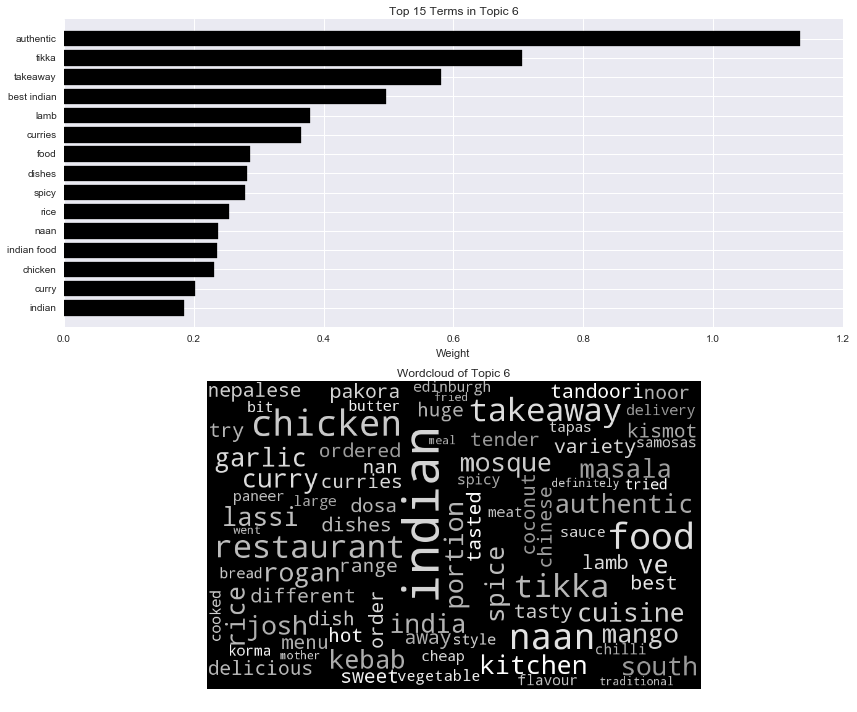


 Topic 7: 

chocolate cream ice ice cream hot chocolate hot cake chocolates best ice dessert hotel chocolat hotel chocolat pudding amazing truffles sweet white chocolate vanilla cafe luca flavours white little toffee taste sorbet caramel rich love cocoa buy cream ve fantastic upstairs really event shop coconut sell scoop butter yum rhubarb coffee away just chocolate cake make vanilla ice fruit bit strawberry homemade best apple bought peanut butter served creamy loved pie peanut delicious try brownie nom cone home good chilli dark jam wee drink bean cheesecake smoked morningside sharing downstairs sweets toffee pudding day delish yum yum die better light frozen slice vittoria tried flavor gorgeous perfect luxury sugar lovely sunny


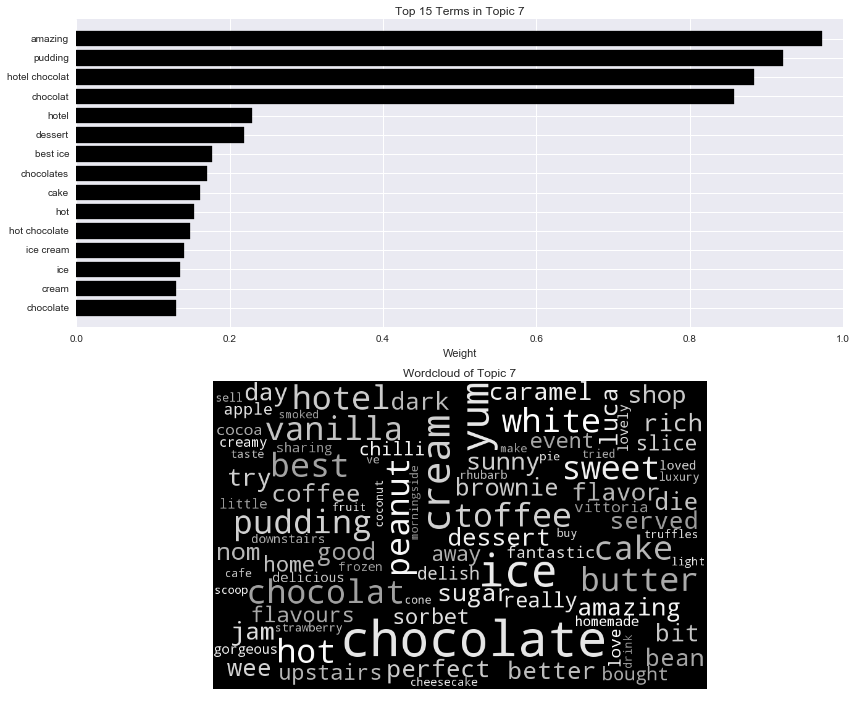


 Topic 8: 

und der sehr ist mit das die ein den war zu fr essen eine es auch gut nicht lecker ich wir bedienung hier auf dem man sind einer karte das essen nach besuch groe wieder waren absolut empfehlen immer und eine uerst nur freundlich im und der hat restaurant aber zu empfehlen einem alles dass als kleinen einfach super laden bei tag personal service noch da que turf surf turf pizza el surf en mein des la portion edinburgh blue bear aioli blue bear trade bank hunger india organic haggis mother india seafood caf fit pizza express fair muy start live mother hipster snack express tapas una por


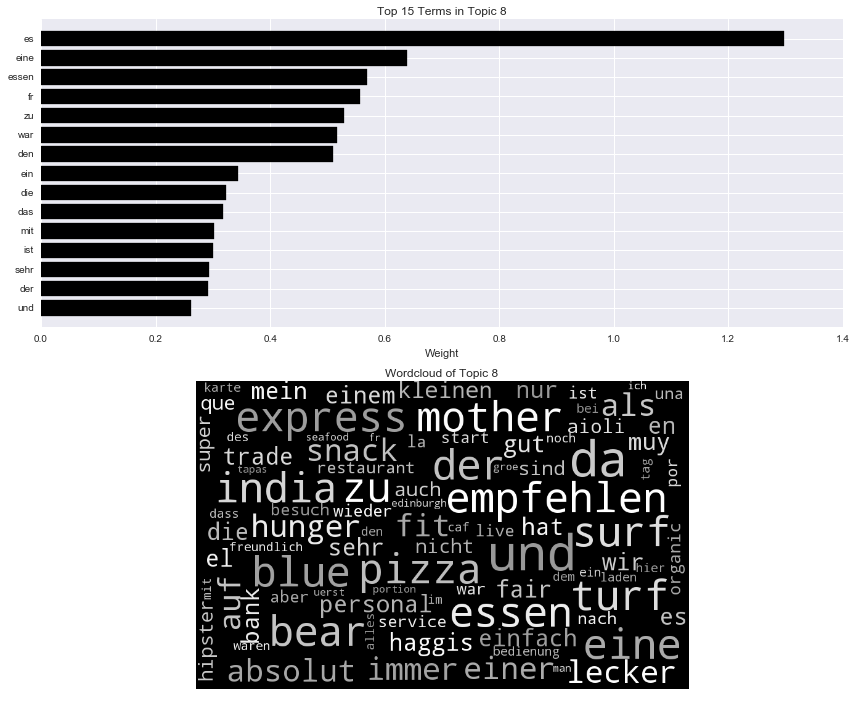


 Topic 9: 

pork oink sauce haggis pig roll pulled pulled pork apple stuffing sandwich crackling apple sauce meat hog sage roast bbq onion window roasted rolls sage onion brown chilli sandwiches onion stuffing pork sandwiches thing grunter chili white delicious bbq sauce belly relish pork belly choose try cracklin juicy simple victoria pork sandwich sage stuffing better mouth roast pig good perfect tender brown roll hog roast chilli sauce piglet say ask barbecue small stop pig window cheese size victoria street seating pork pork street day tasty grassmarket pigs order cooked best hot choice don pie filling shop probably stuffing apple large crispy oh roasted pig haggis chili chilli cheese soft medium heaven does chili relish best pulled white brown ramen spread mash come right


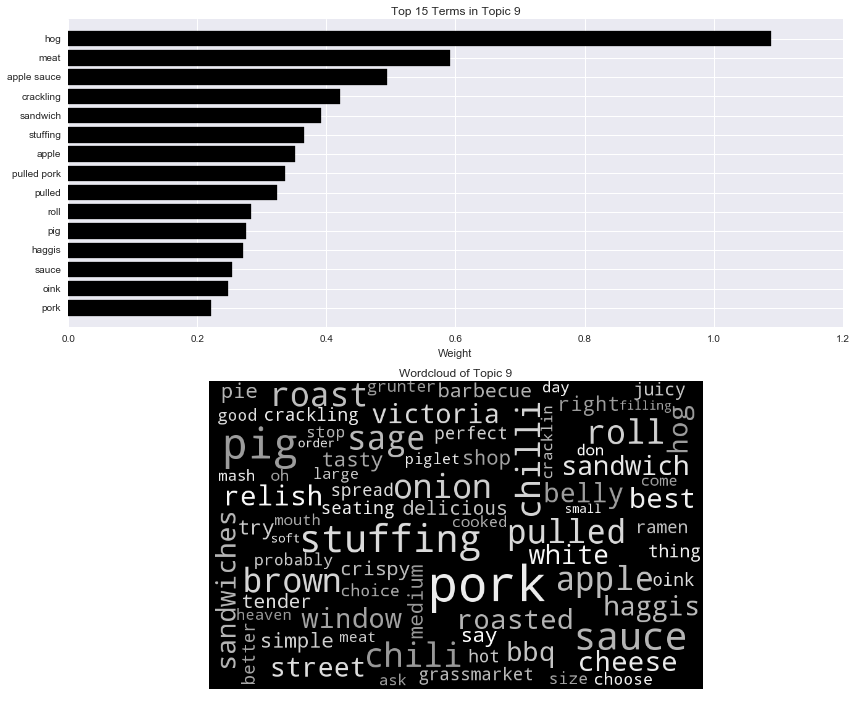


 Topic 10: 

wings chicken chicken wings wing sauce beer spicy wings wings bowl hot challenge sauces delicious chicken wings edinburgh table flavours wings came suicide wall got came sweet flame like buffalo bbq fried loved awesome rubs bowl wings dry chinese just wings chips bucket hot sauce delicious crispy bowls strips good dill tiger fried chicken comic weeping tortilla noodle decoration yelp doctor oh mile bones maple parmesan mariachi free canada bone spicy chicken like chicken holding order pepper saw satay yes just pot rub america ordered fingers caesar fringe went royal mile mixed face chilli facebook drops good beer old expect true beers angel black space themed tasty night buckets royal beer great actually nando


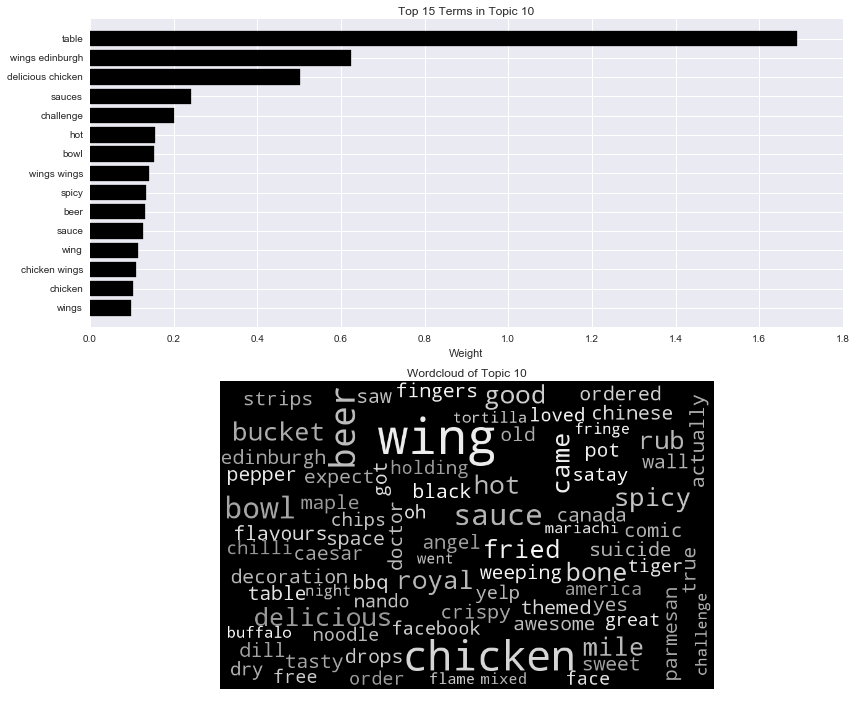


 Topic 11: 

sushi japanese roll sashimi kanpai salmon miso rolls dishes tempura maki dragon tuna teriyaki menu soul sushi nigiri sushi restaurant restaurant fresh platters miso soup dragon roll japanese food avocado yo soul best sushi japanese restaurant sushi places grilled japan tasty yo sushi fish bento sushi edinburgh favourite aubergine rice platter dumplings like tang really bit good boxes box pieces don quite good sushi just seaweed raw order little like sushi authentic sake choice bonsai new town favourite sushi places definitely raw fish look edinburgh california time small think different tried vegetable share food pretty inside belt bento box prawn wasabi things sushi rolls options love presented super crab enjoy spicy ordered sign tiny book advance mistake


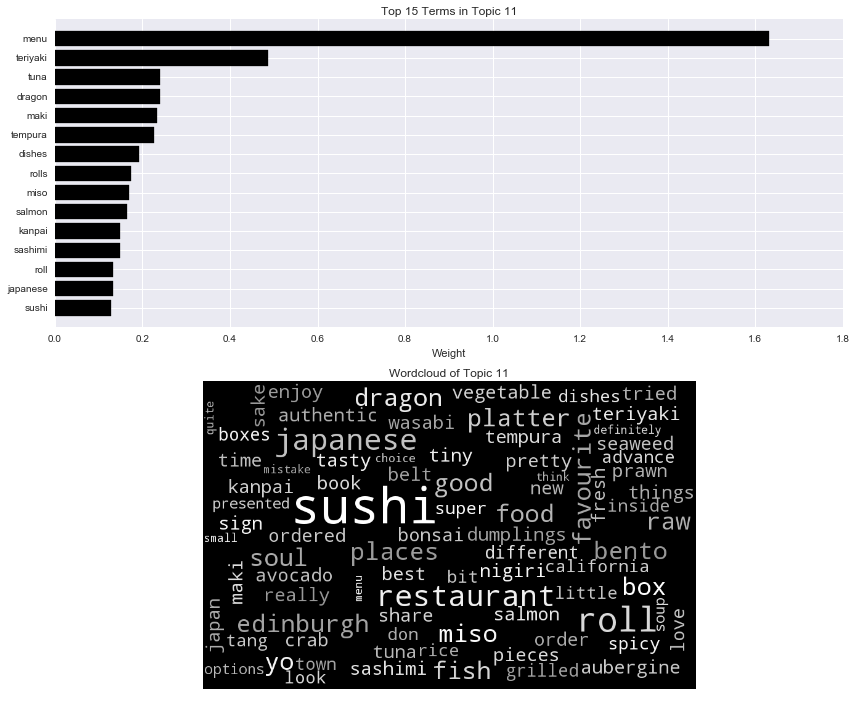


 Topic 12: 

burger burgers fries bun best burger cheese really bacon holyrood good beef chips got chilli good burger burger edinburgh milkshake best fan steak meat really good sauce chicken burger burger ve juicy tasty potato fries american cheeseburger delicious burger amazing sweet potato beef burger chicken really tasty beer definitely milkshakes crispy ve sweet went best burgers came edinburgh handmade far shake right soft burger joint diner huge grilled big just order decided menu joint mac burger place lamb burger relish oh piri southern try place potato try smokey years oz skinny beers patties happy burgers really wannaburger garlic burger great messy loved wasn say burger delicious did table town pioneer pretty burgers ve face mustard lamb awesome salad ketchup bad


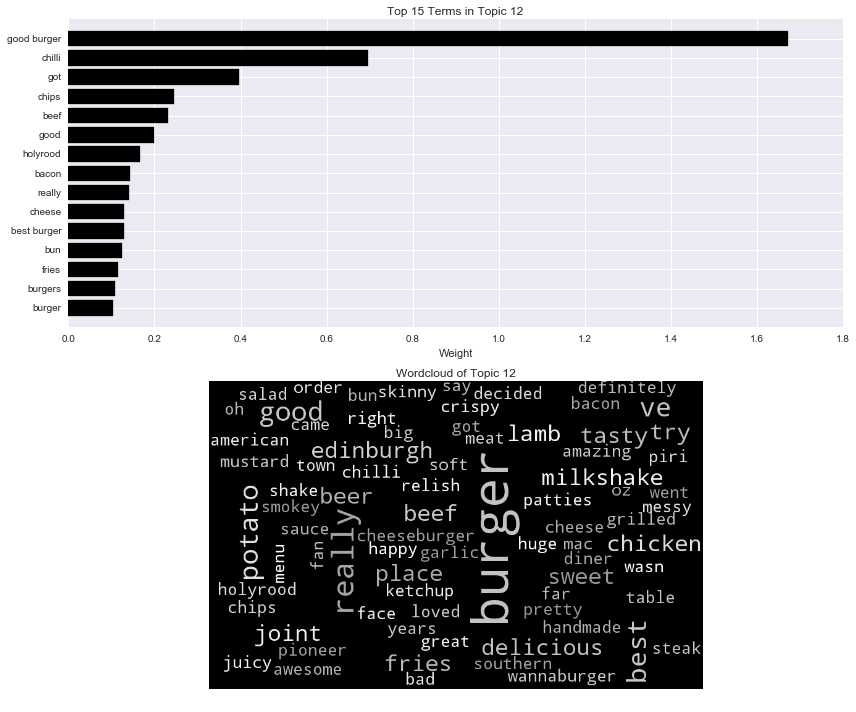


 Topic 13: 

menu wine restaurant meal main course dinner steak cooked starter just dessert dish table delicious dining courses french came ordered perfect went experience dishes lovely perfectly served night didn mains pudding time absolutely evening meat starters did plate room waiter main course special sauce little wonderful quite red list duck cheese got start beautiful chef mussels really fantastic lamb beautifully presented bit small end salmon arrived bottle definitely visit tender glass flavour seafood taste beef birthday tasting having scallops shared enjoyed restaurants took given happy right black opted set wine list loved rare bread looked felt started salad star light mark perfectly cooked


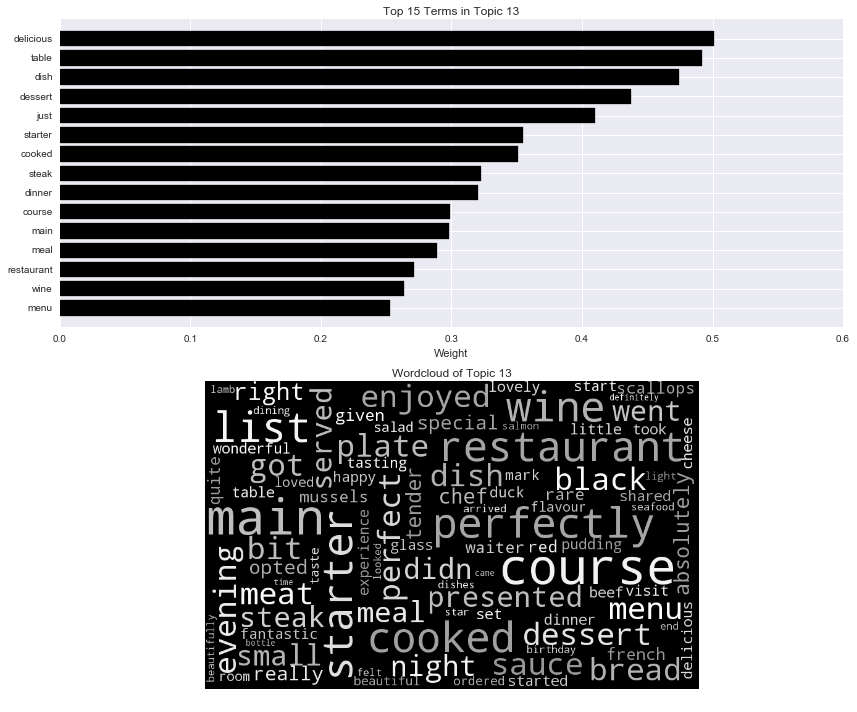


 Topic 14: 

best edinburgh ve thai restaurant restaurant edinburgh favourite thai food time best thai times amazing far food pad best ve pad thai eaten restaurants years favourite restaurant thai restaurant visit say fantastic trip ve edinburgh ve eaten chinese meals uk worth food ve meal favorite city quality restaurant ve tried best restaurant scotland twice best food food best truly hands visiting ve tried far best probably don miss place edinburgh world places castle probably best wife make better don miss life restaurants ve time edinburgh best meals thailand pies quite seriously trip edinburgh authentic korean owner fresh ve tasted say best edinburgh best long wait festival week prawn second opinion mexican try simply bakery edinburgh food tasted visited street best place meal ve dishes thank seen visiting edinburgh town definitely


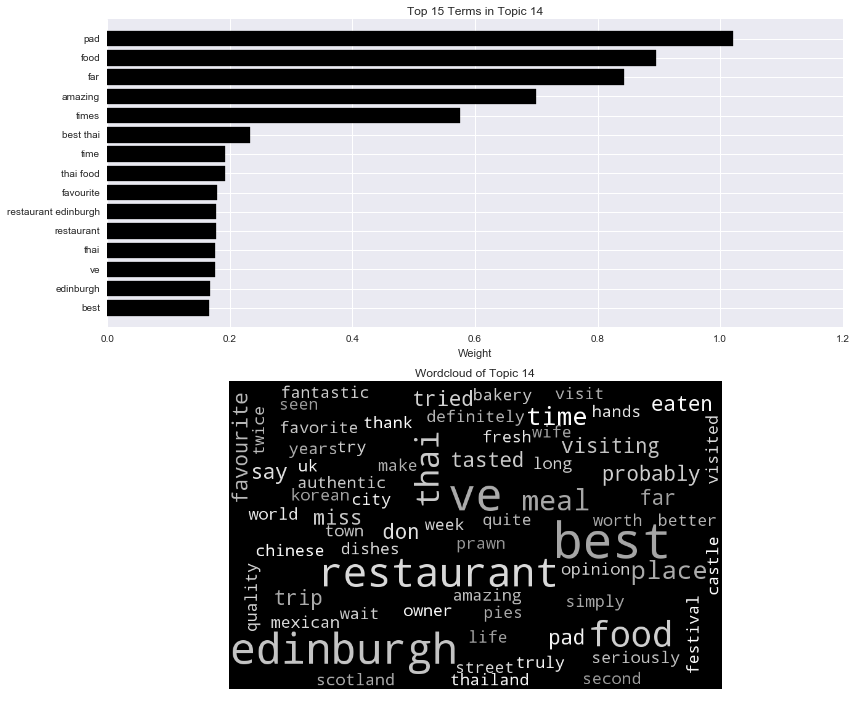


 Topic 15: 

bar pub beer drinks selection cocktails cocktail beers night old edinburgh music drink whisky area menu bars street great royal pubs scottish new ales bar staff fun advocate room cool monkey local brewdog favourite glass traditional live mile vodka tables close different tap decor royal mile whiskies spot space cosy crowd atmosphere good like looking modern nice city live music outside evening selection beers brass leith burgers seating quite brass monkey vibe pretty visit list quiz devil downstairs looks town style location good selection busy large bar restaurant pint inside table bartender devil advocate way walls real cocktail bar bartenders ale whiskey high try beautiful lots cocktail menu away open


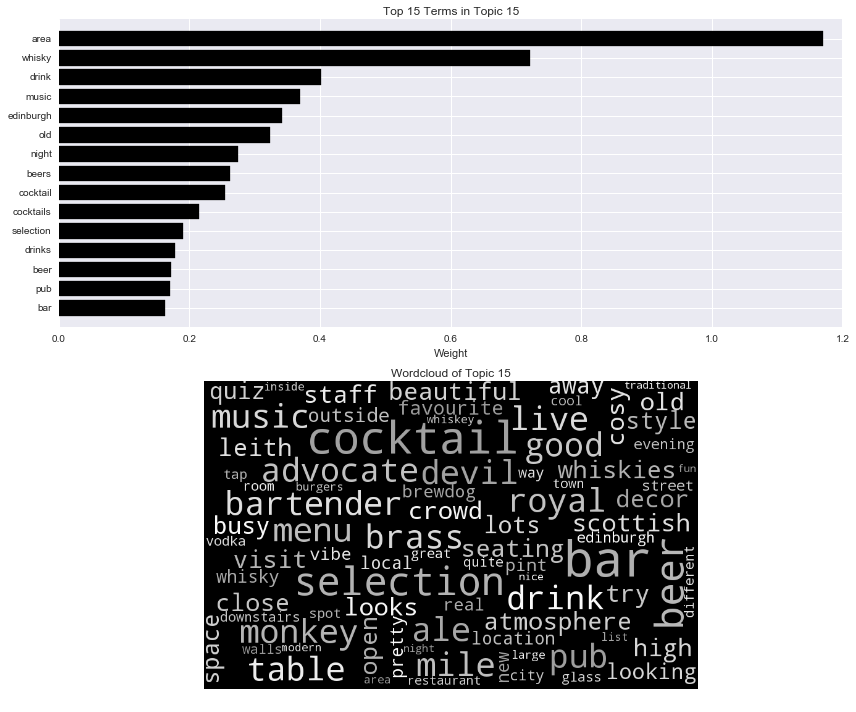


 Topic 16: 

food good service excellent good food food good prices excellent food quality food service price good service food excellent amazing reasonable value excellent service delicious service excellent really good quality food service good atmosphere really friendly service delicious food family food amazing service friendly ambiance friendly good value meal priced presentation fast portions money gem value money good price food delicious worth outstanding italian reasonable prices decor exceptional enjoyed return chinese food really superb amazing food restaurant wife authentic service food impeccable good prices especially attentive busy haggis dishes range excellent value reasonable price definitely service impeccable reasonably manager absolutely recommended reasonably priced went lunch decent times special friends restaurant good quick stars expect loved experience extremely brilliant chinese food wonderful vegetarian right scottish good quality fresh amazing service overa

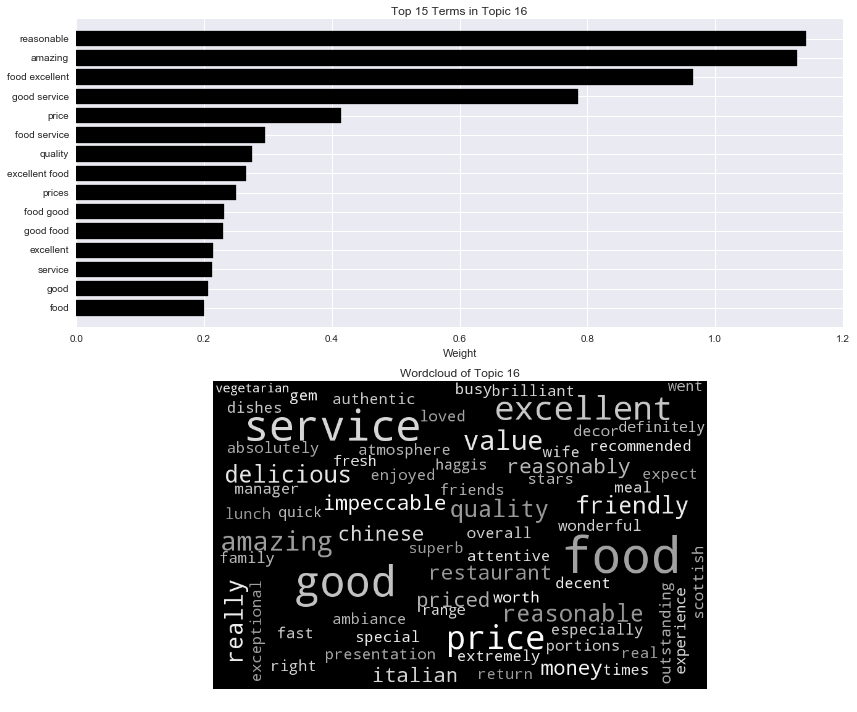


 Topic 17: 

highly recommend highly recommend highly recommended place recommended recommend place delicious amazing absolutely definitely recommend fantastic atmosphere attentive absolutely delicious delicious food definitely place highly haggis came service food delicious good highly mussels food attentive turkish outstanding excellent wonderful dinner food highly enjoyed food amazing recommend restaurant great highly friendly great wait staff sandwich priced friends delicious great recommend highly absolutely amazing meal highly town brilliant ambience staying fantastic food husband friendly attentive seafood ambiance live restaurant meal quick quirky food place awesome turkish food chicken tried servers edinburgh highly variety place visit service atmosphere spot place fantastic chocolate high went looking sea food recommend friends small simply visit terrific stumbled place looking definitely come lunch special menu delicious recommended place delicious coffee sea ribeye service

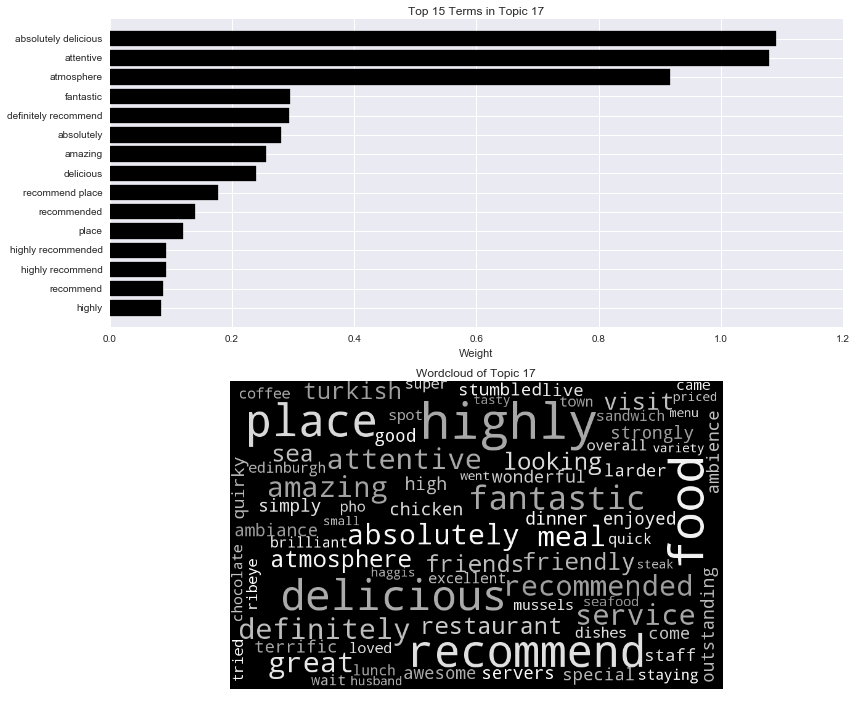


 Topic 18: 

tea afternoon afternoon tea cakes scones teas lovely cake pot sandwiches cafe room jam shop coffee delicious tea coffee little cups scone served clotted clotted cream loopy green tea lorna selection sit tea shop tea room beautiful pot tea cup china visit free birthday green mini friends eteaket friend looking cream tray layer feel coffee tea cup tea tea pot slice gluten bubble cute pots tea pots away did counter doing definitely homemade treats tables worth gf vintage fruit glass recently inside gorgeous fun scrumptious orange time usually fresh cupcakes earl earl grey gluten free chai blend extra quirky bakes hotel worth visit loose prosecco old leaf quite truly tray bakes grey lots hot selection teas


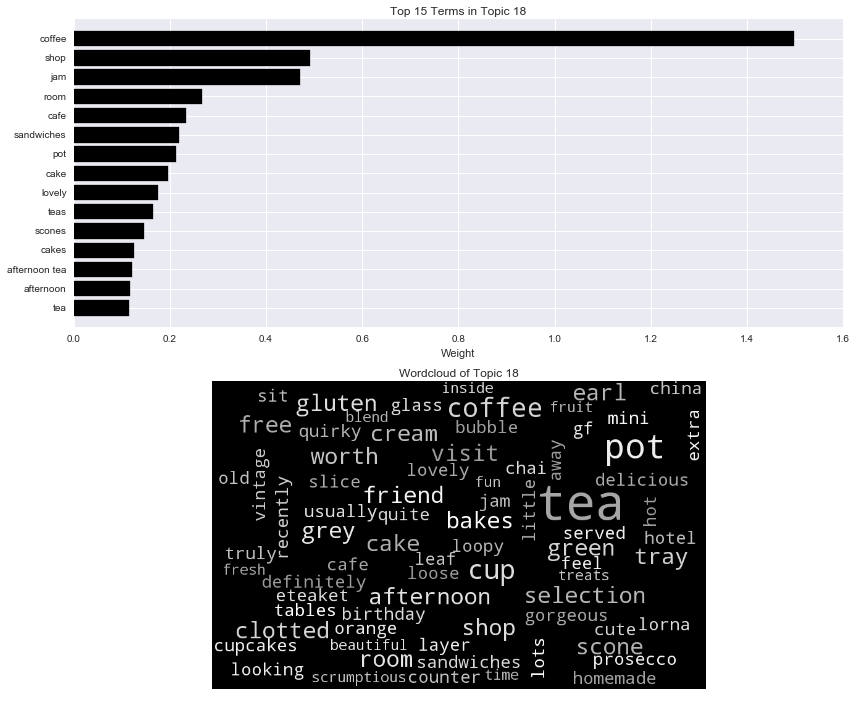


 Topic 19: 

soup lunch bread potato baked fresh salad free sandwich cheese shop gluten sandwiches vegan gluten free baked potato fillings delicious potatoes soups day options cakes salads tasty cake chicken healthy amazing filling selection baguette potato shop got hula half coffee wrap juice prices baked potatoes panini vegetarian deal hot away good lentil spot small wraps deli little tomato today yum offer range ingredients cafe veggie option came sweet cold time daily lunch time carrot freshly avocado peppers home just union huge ham eat lots area thyme baguettes wifi tuna choose quality lentil soup smoothies onion great bowl need seating juices lunchtime ve great lunch outside brie offers


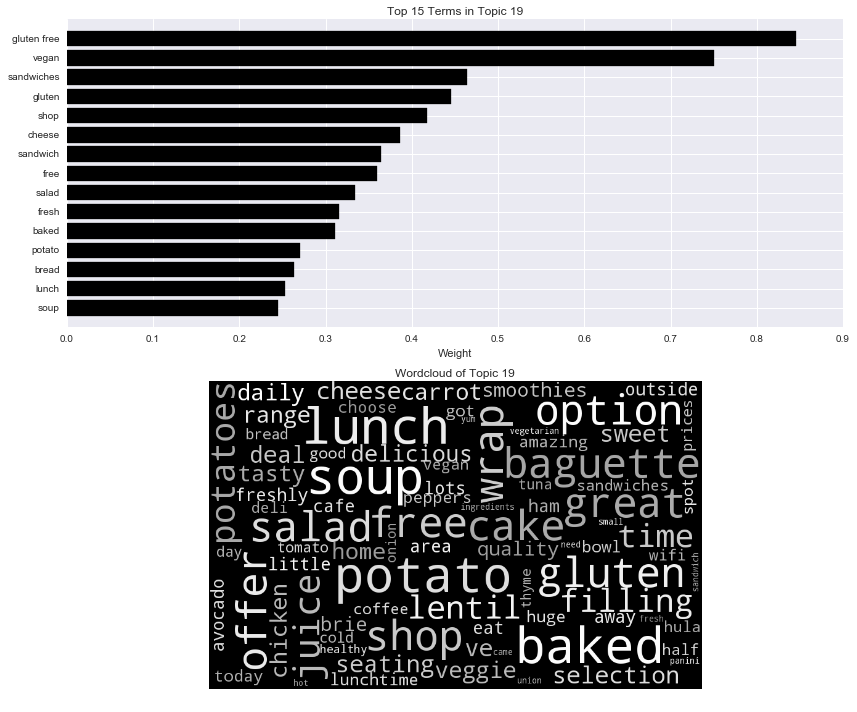


 Topic 20: 

staff friendly staff friendly nice friendly staff helpful really lovely super really friendly atmosphere tasty friendly helpful really nice food friendly staff great super friendly attentive staff really staff nice local staff super food friendly attentive friendly service nice staff area busy relaxed welcoming place nice place friendly food clean cafe friendly atmosphere lovely staff warm wait accommodating environment service friendly delicious staff cosy excellent friendly really happy favourite helpful staff friendly welcoming try wonderful cocktails staff lovely efficient food staff choice flat wee interesting polite vibe location day resturant stumbled yum breakfasts pumpkin friendly nice amazing staff delicious enjoyed wait staff welcome warm friendly delish fresh quiet sat great staff good staff noisy ambiance staff wonderful helpful place coming friendly good atmosphere friendly town ask free stopped house priced recommend loved evening super tasty genuine


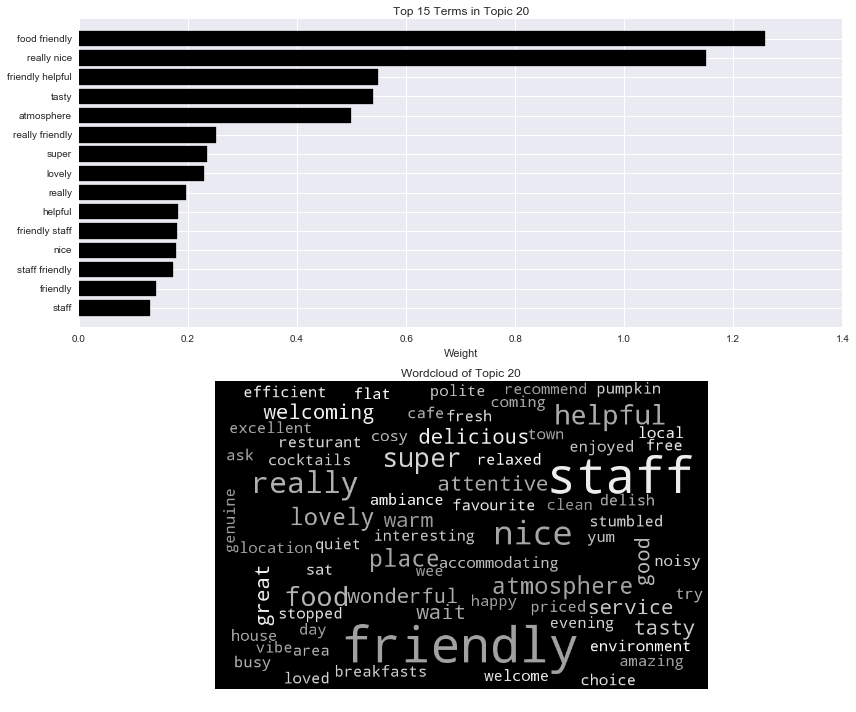

In [23]:
TopTermsByTopic(nmfmodel_5, features_5, 100)

the original building was constructed in the   th century and it still retains its original characteristics  many stairs and really narrow doorways  a throwback to an earlier time  the gastro pub food is well cooked  well presented and delicious  especially the home made icecream 


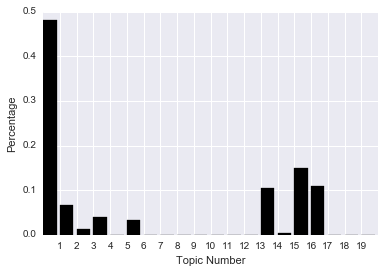

In [24]:
TopicDistribution(review,W_5,8)